# Grid Search RF models: RF, RF_BCW, BRFC, BRFC_BCW

In [25]:
from matplotlib import pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, f1_score, roc_auc_score, roc_curve, precision_recall_curve, auc, recall_score, confusion_matrix
import sys 
sys.path.append('../../')
from RF_atomver import *
import pandas as pd
import numpy as np

In [26]:
# metric_cols = ['prediction', 'accuracy', 'precision', 'recall', 'specificity',
#        'prob_class0', 'prob_class1', 'y', 'TN', 'FN', 'FP', 'TP', 'subset',
#        'model', 'cm', 'prediction_type', 'NEK', 'feat_type', 'strategy',
#        'RF_type']
# Index(['prediction', 'accuracy', 'precision', 'recall', 'specificity',
#        'prob_class0', 'prob_class1', 'y', 'TN', 'FN', 'FP', 'TP', 'model',
#        'NEK', 'strategy', 'RF_type', 'feat_type', 'dataset_category', 'cm',
#        'prediction_type', 'ROC-AUC', 'MCC', 'Balanced Accuracy', 'f1',
#        'subset'],
#       dtype='object')
# metric_cols = ['accuracy', 'precision', 'recall', 'specificity','ROC-AUC', 'MCC', 'Balanced Accuracy', 'f1'
#                'y', 'TN', 'FN', 'FP', 'TP',
#        'model', 'cm', 'prediction_type', 'NEK', 'feat_type', 'strategy',
#        'RF_type']
metric_cols = ['accuracy', 'precision', 'recall', 'specificity','ROC-AUC', 'MCC', 'Balanced Accuracy', 'f1',
               'y', 'TN', 'FN', 'FP', 'TP',
       'model', 'cm', 'NEK', 'feat_type', 'strategy',
       'RF_type','dataset_category']

In [3]:
result_path = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/RF/RF_grid_search/rf_results/'
pickle_path  = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/RF/RF_grid_search/rf_results/'
rf_types = ['RF', 'RF_BCW', 'BRFC', 'BRFC_BCW']
nek_nums = [2,3,5,9]
samplings = ['scaled', 'UNDER', 'SMOTE', 'ADASYN'] 
features = ['moe', 'mfp']
nektype = ['binding', 'inhibition'] 
NEK= 'NEK'
count=0
train_results = [] 
test_results = [] 
for i, n in enumerate(nek_nums):
    nek = str(n)
    for i in nektype: 
        for k, feat in enumerate(features): 
            print()
            for j, samp in enumerate(samplings): 
                for rf in rf_types: 
                    
                    if i=='binding': 
                        count+=1
                        file_root = f'NEK{nek}_binding_{feat}_{samp}_{rf}_GS'
                        print(f'{count}. {file_root}')
                   
                        train = pd.read_csv(f'{result_path}{file_root}_train.csv') 
                        test = pd.read_csv(f'{result_path}{file_root}_test.csv') 
        
                        train_results.append(train.iloc[[0]][metric_cols].values.flatten())
                        test_results.append(test.iloc[[0]][metric_cols].values.flatten())
    
                    
            # print()
            
                    if (n == 2 or n == 9) and i=='inhibition':
                        
                        count+=1
                 
                        file_root = f'NEK{nek}_inhibition_{feat}_{samp}_{rf}_GS'
                        print(f'{count}. {file_root}')
                   
                        train = pd.read_csv(f'{result_path}{file_root}_train.csv') 
                        test = pd.read_csv(f'{result_path}{file_root}_test.csv') 
        
                        train_results.append(train.iloc[[0]][metric_cols].values.flatten())
                        test_results.append(test.iloc[[0]][metric_cols].values.flatten())



1. NEK2_binding_moe_scaled_RF_GS
2. NEK2_binding_moe_scaled_RF_BCW_GS
3. NEK2_binding_moe_scaled_BRFC_GS
4. NEK2_binding_moe_scaled_BRFC_BCW_GS
5. NEK2_binding_moe_UNDER_RF_GS
6. NEK2_binding_moe_UNDER_RF_BCW_GS
7. NEK2_binding_moe_UNDER_BRFC_GS
8. NEK2_binding_moe_UNDER_BRFC_BCW_GS
9. NEK2_binding_moe_SMOTE_RF_GS
10. NEK2_binding_moe_SMOTE_RF_BCW_GS
11. NEK2_binding_moe_SMOTE_BRFC_GS
12. NEK2_binding_moe_SMOTE_BRFC_BCW_GS
13. NEK2_binding_moe_ADASYN_RF_GS
14. NEK2_binding_moe_ADASYN_RF_BCW_GS
15. NEK2_binding_moe_ADASYN_BRFC_GS
16. NEK2_binding_moe_ADASYN_BRFC_BCW_GS

17. NEK2_binding_mfp_scaled_RF_GS
18. NEK2_binding_mfp_scaled_RF_BCW_GS
19. NEK2_binding_mfp_scaled_BRFC_GS
20. NEK2_binding_mfp_scaled_BRFC_BCW_GS
21. NEK2_binding_mfp_UNDER_RF_GS
22. NEK2_binding_mfp_UNDER_RF_BCW_GS
23. NEK2_binding_mfp_UNDER_BRFC_GS
24. NEK2_binding_mfp_UNDER_BRFC_BCW_GS
25. NEK2_binding_mfp_SMOTE_RF_GS
26. NEK2_binding_mfp_SMOTE_RF_BCW_GS
27. NEK2_binding_mfp_SMOTE_BRFC_GS
28. NEK2_binding_mfp_SMOTE

In [9]:
train_df =  pd.DataFrame(train_results,columns=metric_cols)
test_df =  pd.DataFrame(test_results,columns=metric_cols)
test_df
train_df['model'] = train_df['model'].str.replace('scaled', 'raw')
test_df['model'] = test_df['model'].str.replace('scaled', 'raw')
train_df['strategy'] = train_df['strategy'].str.replace('scaled', 'raw')
test_df['strategy'] = test_df['strategy'].str.replace('scaled', 'raw')
train_df['dataset_category'] = train_df['dataset_category'].str.replace('scaled', 'raw')
test_df['dataset_category'] = test_df['dataset_category'].str.replace('scaled', 'raw')
train_df.to_csv(result_path+'RF_gridsearch_train_results_all_NEK.csv', index=False) 
test_df.to_csv(result_path+'RF_gridsearch_test_results_all_NEK.csv', index=False) 

In [27]:
df_all = pd.read_csv(result_path+'RF_gridsearch_test_results_all_NEK.csv')
drop_cols = ['prediction', 'subset','prediction_type']
df_all.columns

Index(['accuracy', 'precision', 'recall', 'specificity', 'ROC-AUC', 'MCC',
       'Balanced Accuracy', 'f1', 'y', 'TN', 'FN', 'FP', 'TP', 'model', 'cm',
       'NEK', 'feat_type', 'strategy', 'RF_type', 'dataset_category'],
      dtype='object')

# Colors and paths 

In [38]:
figures_path = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/plots/figures/RF_gridsearch_plots/'
df_all['dataset_category'].unique()
moes = sns.color_palette('Blues', 4) 
mfps = sns.color_palette('YlOrBr', 4)
neks = ['NEK2_binding','NEK2_inhibition','NEK3_binding','NEK5_binding','NEK9_binding','NEK9_inhibition']
dataset_palette = moes+mfps
feat_palette_dict = {}
feat_types = df_all['feat_type'].unique()
strategies = df_all['strategy'].unique()
# for i, feat in enumerate(feat_types):
#     for j, strat in enumerate(strategies):
#         feat_palette_dict[(feat,strat)] = dataset_palette[i*len(strategies)+j]
        
def get_color(feat_type, strategy):
    return feat_palette_dict[(feat_type,strategy)]
palette_dict = {strategy: color for strategy, color in zip(strategies, dataset_palette)}

raws = sns.color_palette('Grays', 1) 
smotes = sns.color_palette('Greens', 1)
unders = sns.color_palette('Reds',1) # Purples, RdPu, Reds, YlGn, YlGnBu, YlOrBr, YlOrRd, BuPu, BuGn , dark:salmon_r
adasyns = sns.color_palette('Purples',1)

sampling_palette = raws+smotes+unders+adasyns

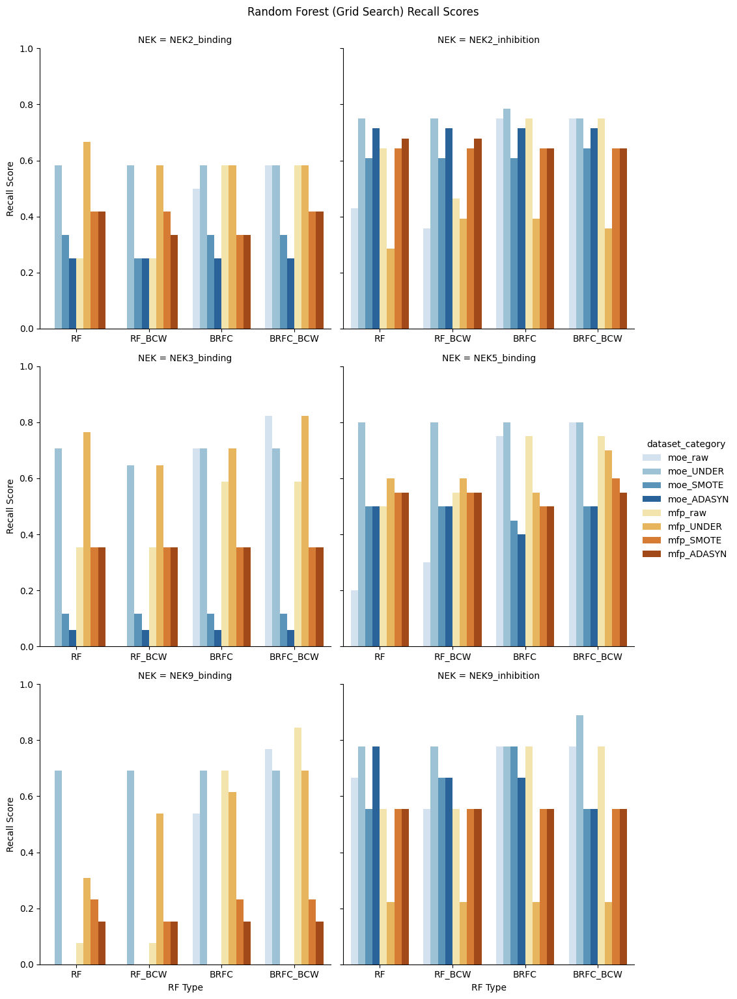

In [29]:
p1 = sns.catplot(
    data=df_all, x='RF_type', y='recall', hue='dataset_category', 
    col='NEK', kind='bar', sharex=False, legend_out=True, 
    palette=dataset_palette, col_wrap=2
)
p1.set_axis_labels(x_var='RF Type', y_var='Recall Score')
plt.ylabel('Recall Score')
plt.suptitle('Random Forest (Grid Search) Recall Scores', y=1.02) 
plt.ylim(0,1)
plt.savefig(figures_path+'all_RF_GS_recall.png')
plt.show(); 


nek_values = df_all['NEK'].unique()
dataset_categories = df_all['dataset_category'].unique()
# for ax_row in p1.axes.flatten():
#     for ax in ax_row:
#         ax.legend(loc='upper right')  

for i, nek_value in enumerate(df_all['NEK'].unique()):
    fig = p1.fig
    fig.savefig(f'{figures_path}{nek_value}_GS_recall.png', bbox_inches='tight')
    plt.close(fig)


# Plot recall scores, with rf type on x, for each NEK

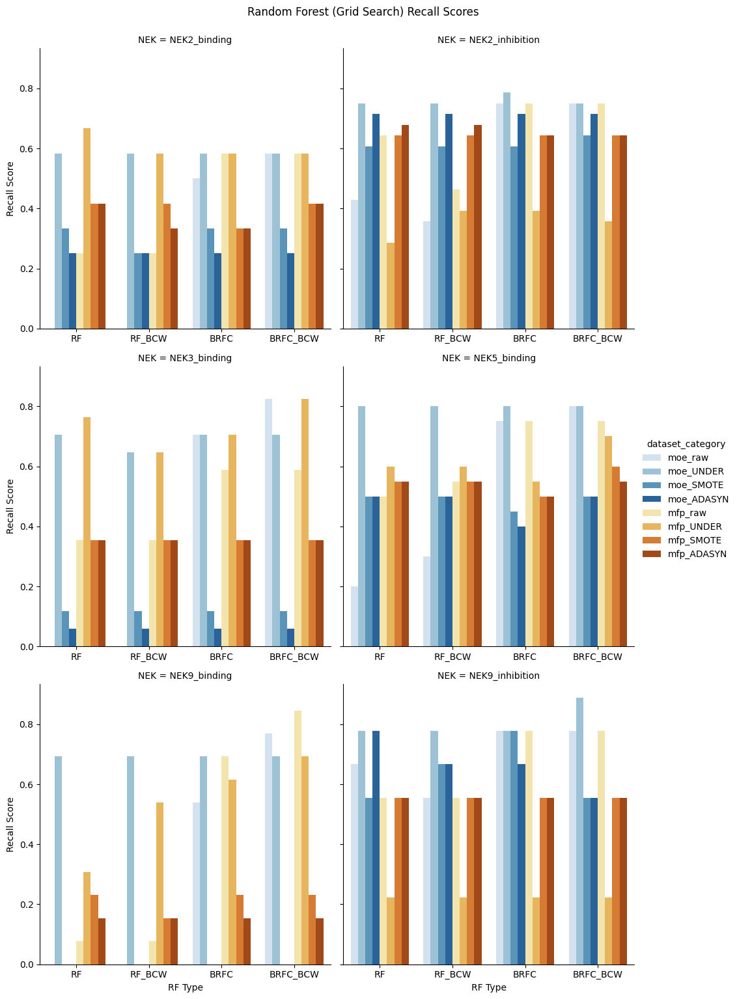

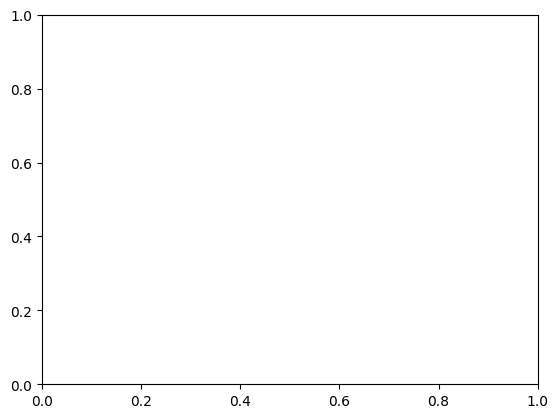

In [39]:
p1 = sns.catplot(
    data=df_all, x='RF_type', y='recall', hue='dataset_category', 
    col='NEK', kind='bar', sharex=False, legend_out=True, 
    palette=dataset_palette, col_wrap=2
)
p1.set_axis_labels(x_var='RF Type', y_var='Recall Score')
plt.ylabel('Recall Score')
plt.suptitle('Random Forest (Grid Search) Recall Scores', y=1.02) 

plt.savefig(figures_path+'all_RF_GS_recall.png')
plt.show(); 
plt.ylim(0,1)


nek_values = df_all['NEK'].unique()
dataset_categories = df_all['dataset_category'].unique()
# for ax_row in p1.axes.flatten():
#     for ax in ax_row:
#         ax.legend(loc='upper right')  

for i, nek_value in enumerate(df_all['NEK'].unique()):
    fig = p1.fig
    fig.savefig(f'{figures_path}{nek_value}_GS_recall.png', bbox_inches='tight')
    plt.close(fig)


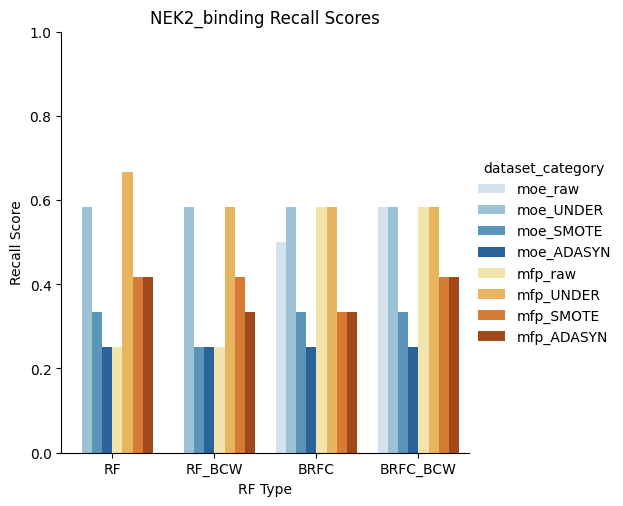

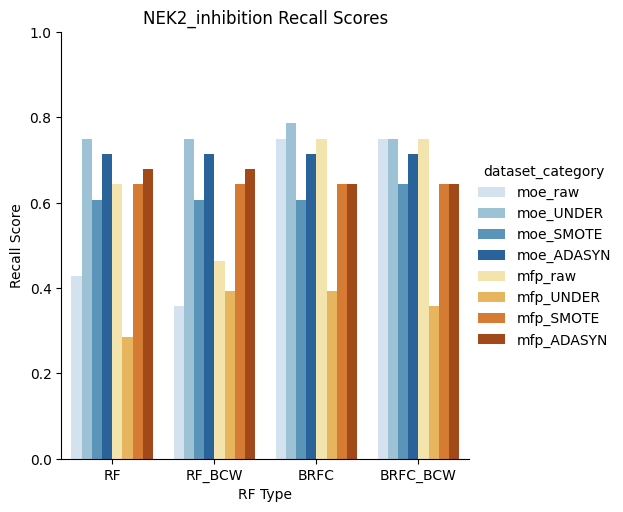

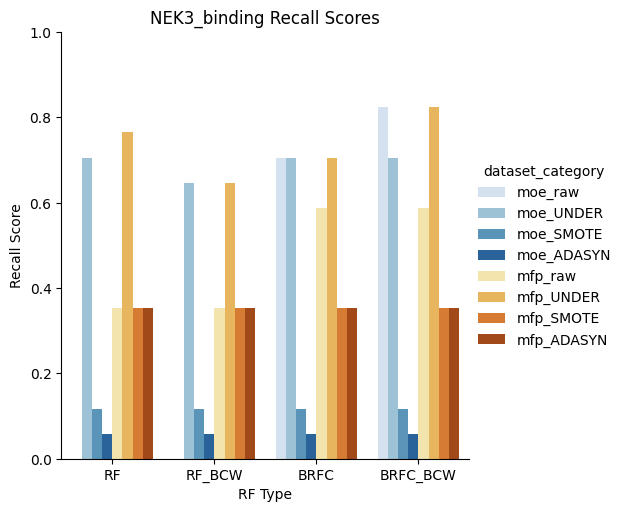

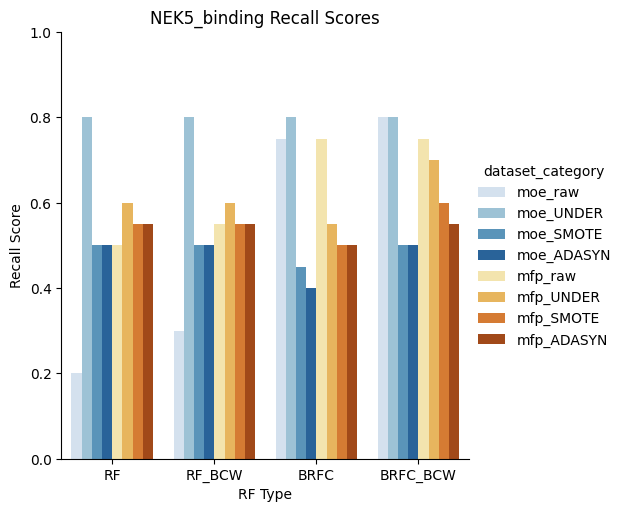

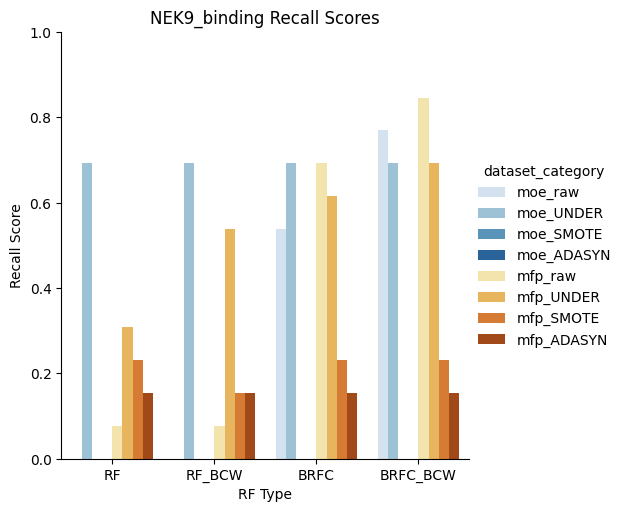

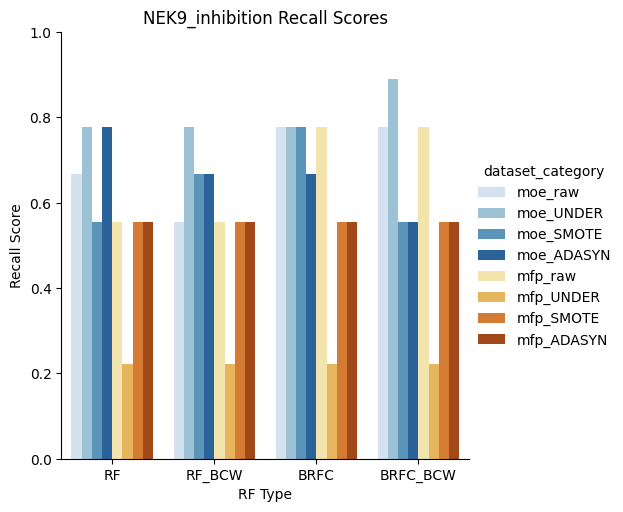

In [40]:
# save individual figures 
for nek in neks:
    nek_df = df_all[df_all['NEK']==nek]
    p1individ = sns.catplot(
        data=nek_df, x='RF_type', y='recall', hue='dataset_category', 
        kind='bar', sharex=False, legend_out=True, 
        palette=dataset_palette
    )

    p1individ.set(ylim=(0,1))
    # p1individ.ax.legend_.remove() # no legend excpet 1 
    p1individ.set_axis_labels(x_var='RF Type', y_var='Recall Score')
    plt.ylabel('Recall Score')
    plt.title(f'{nek} Recall Scores')
    plt.savefig(f'{figures_path}{nek}_GS_recall.png', bbox_inches='tight')
    # plt.close()

# Same as above, but individual plots for each NEK and separated by feaet_Type


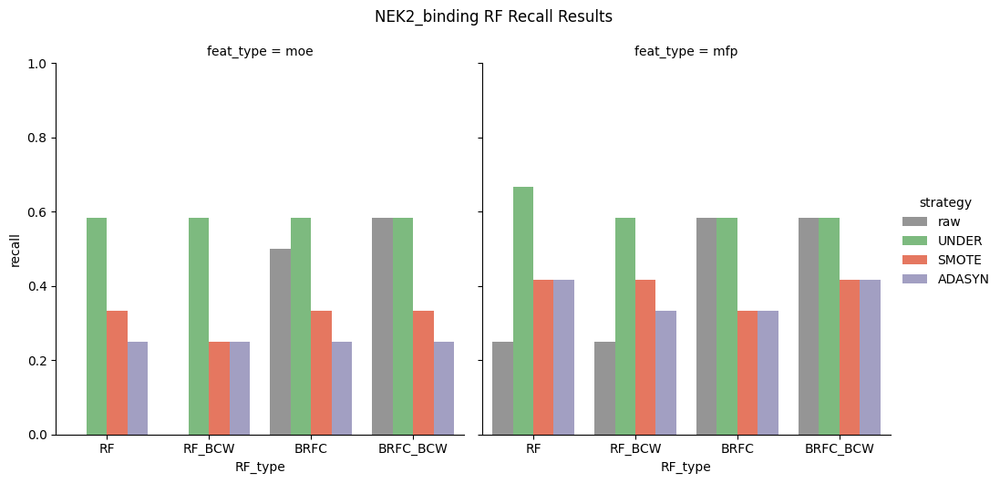

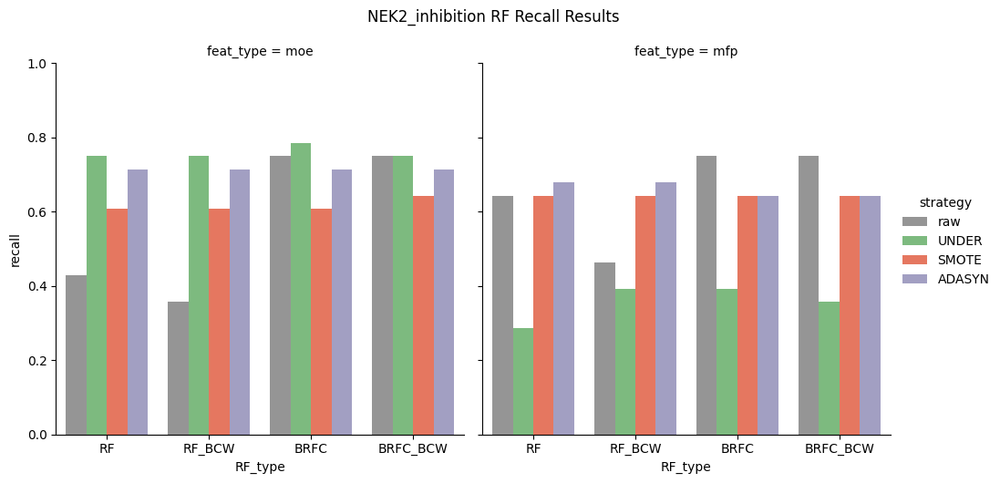

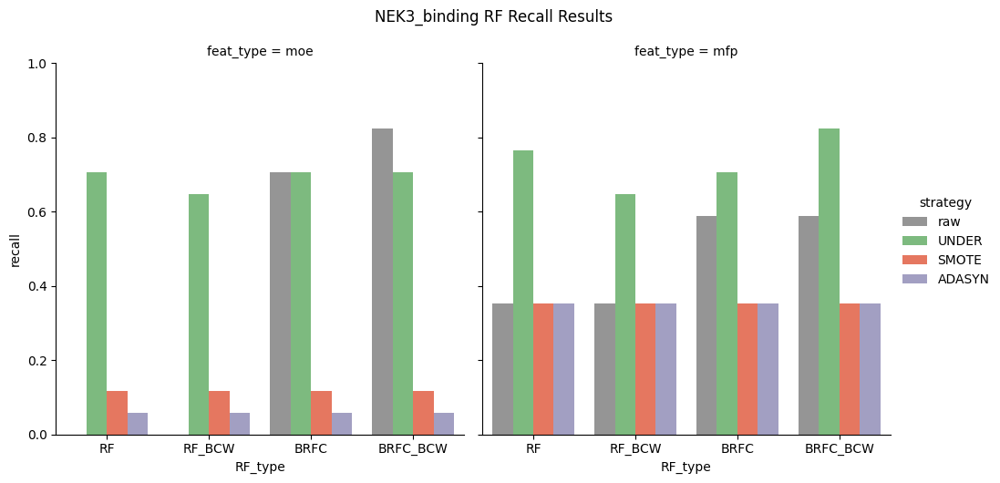

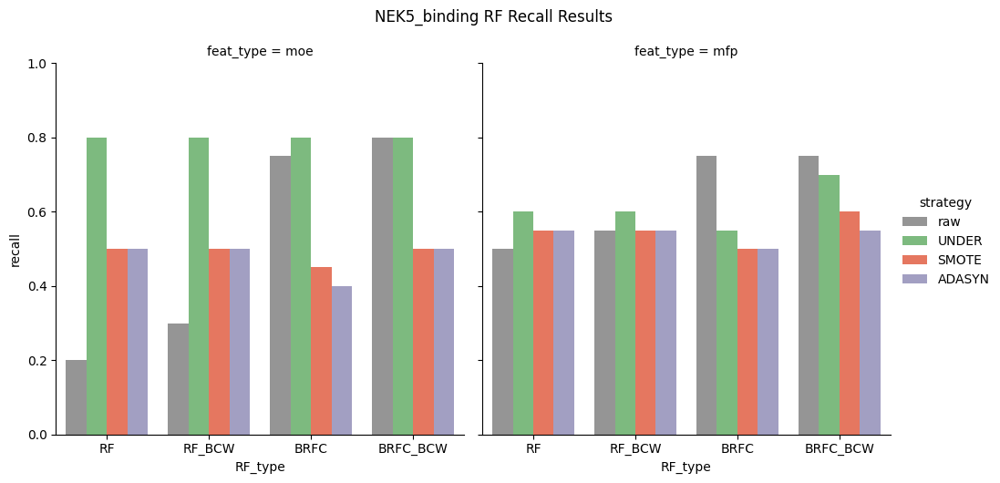

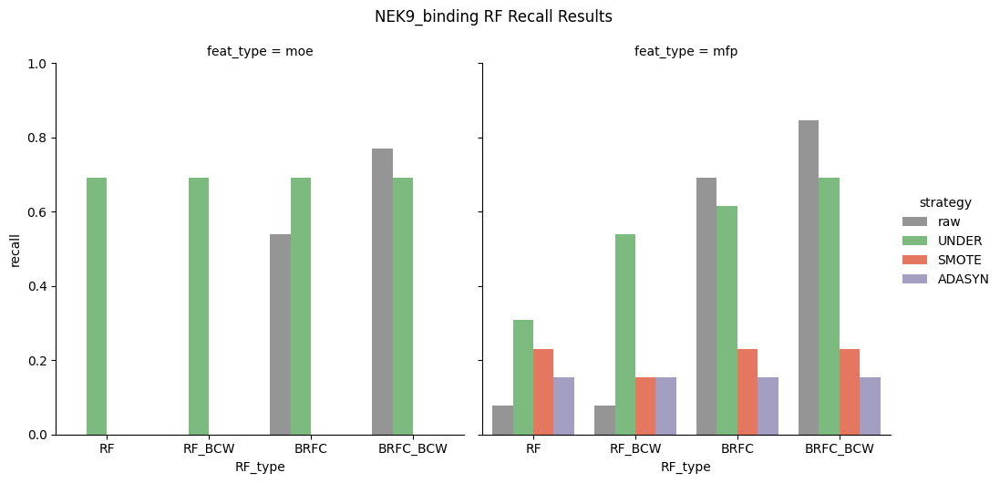

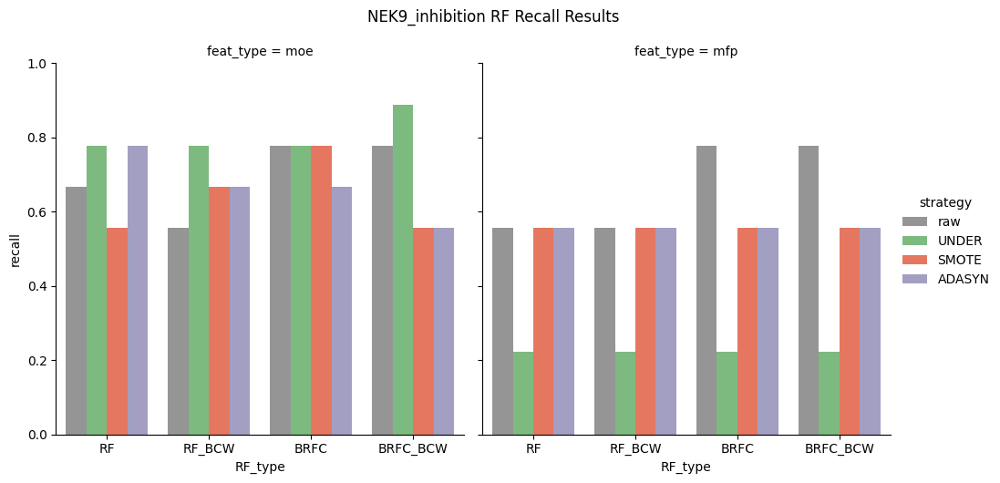

In [41]:
neks = ['NEK2_binding', 'NEK2_inhibition','NEK3_binding', 'NEK5_binding', 'NEK9_binding','NEK9_inhibition']

for nek in neks: 
    nek_df = df_all[df_all['NEK']==nek]
    nek_df.sort_values('strategy')
    # p1_individ = sns.catplot(data=nek_df, x='RF_type', y='recall', hue='strategy',col='feat_type', kind='bar',palette=palette_dict)
    p1_individ = sns.catplot(data=nek_df, x='RF_type', y='recall', hue='strategy',col='feat_type', kind='bar',palette=sampling_palette)
    # p1_individ = sns.catplot(data=nek_df, x='RF_type', y='recall', hue='dataset_category', kind='bar')
    # plt.suptitle(f'{nek} RF Recall Results')
    plt.ylabel('Recall Score')

    # for ax in p1_individ.axes.flat:
    #     if ax.get_legend() is not None:
    #         ax.get_legend().remove()
    p1_individ.fig.suptitle(f'{nek} RF Recall Results', y=1.05) 
    p1_individ.set(ylim=(0,1))
    plt.savefig(f'{figures_path}{nek}_GS_4rftype_4colorsamp_2feat.png', bbox_inches='tight')

    plt.show()

# same, but don't separate moe and mfp on diff plots, just use dataset_category 

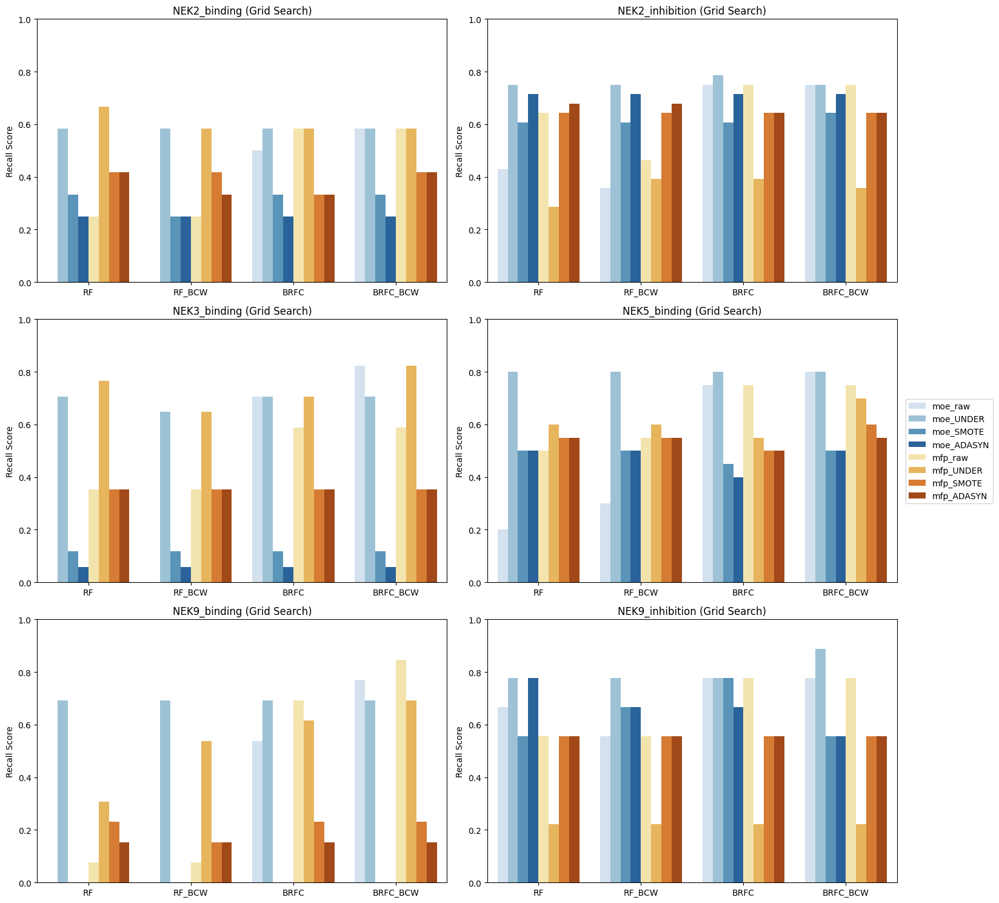

In [44]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 15))
axes = axes.flatten()

for i, nek in enumerate(neks):
    nek_df = df_all[df_all['NEK'] == nek]
    # nek_df = nek_df.sort_values('RF_type')
    g = sns.barplot(data=nek_df, x='RF_type', y='recall', hue='dataset_category', ax=axes[i],palette=dataset_palette)
    axes[i].set_title(f'{nek} (Grid Search)')
    axes[i].set_ylabel('Recall Score')
    axes[i].set_xlabel('RF Type')
    axes[i].set_ylim(0, 1)
    axes[i].set(xlabel='')
    axes[i].get_legend().remove()

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='center right',bbox_to_anchor=(1.1,0.5))
plt.savefig(f'{figures_path}NEK_RF_GS_recall_byRF_type.png', bbox_inches='tight')
plt.tight_layout()
plt.show();

# Blue and gold feat type and sampling strategy on x, plot for each RF model type

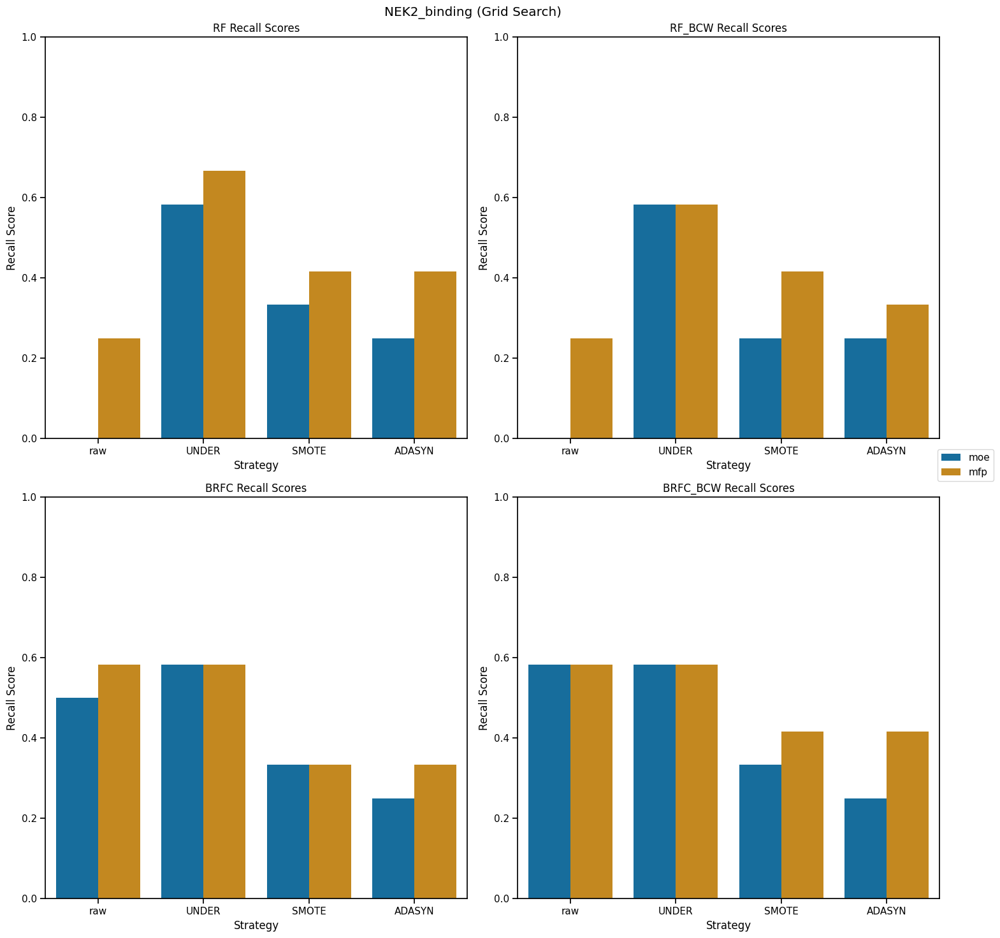

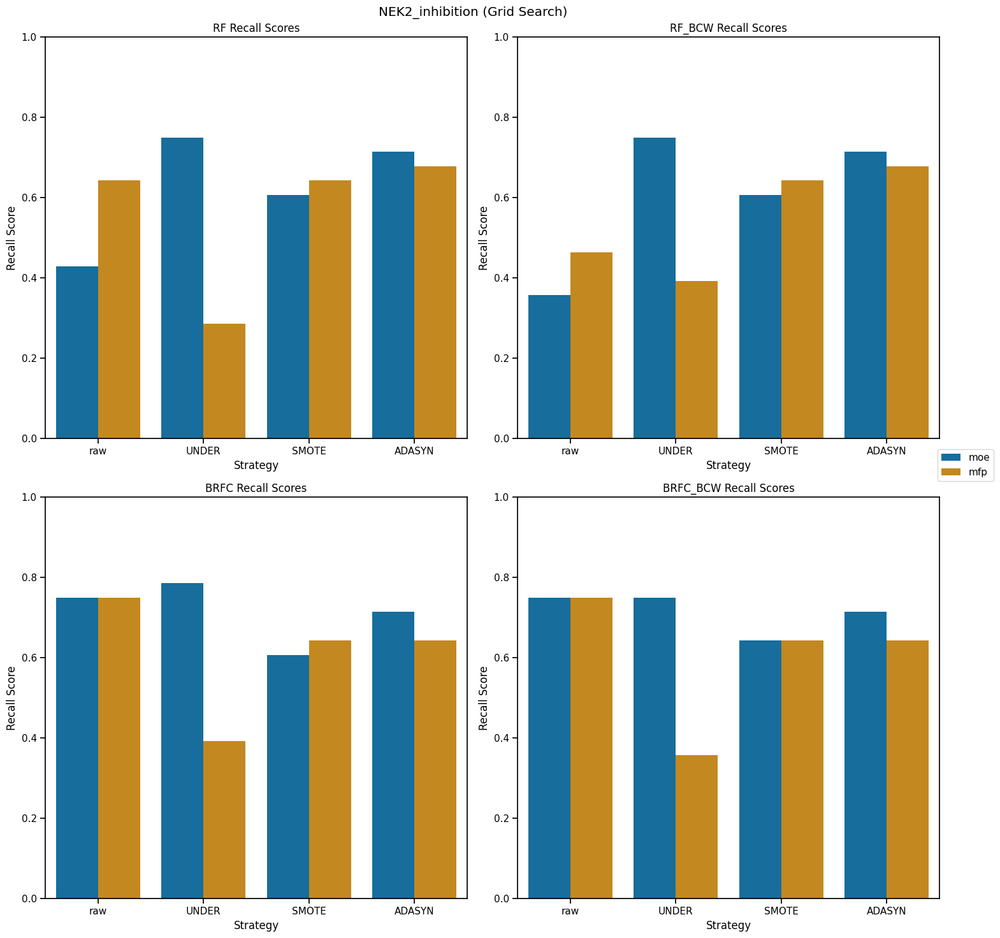

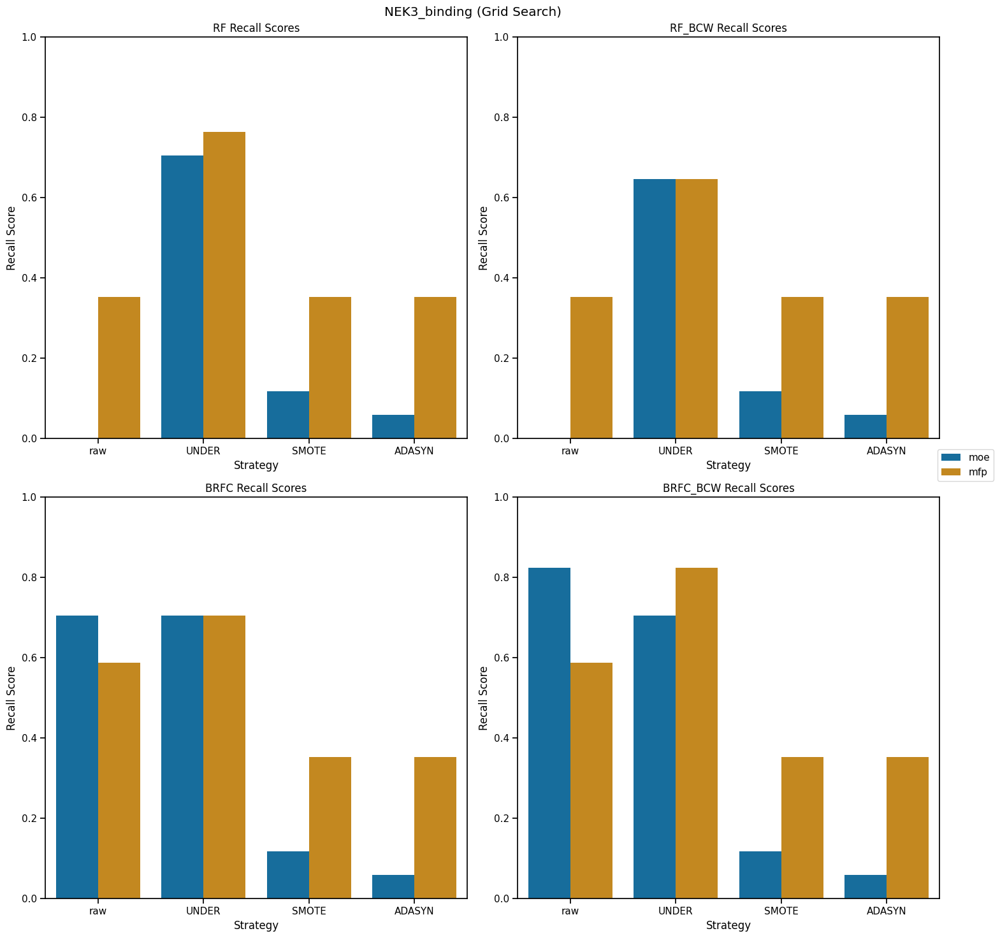

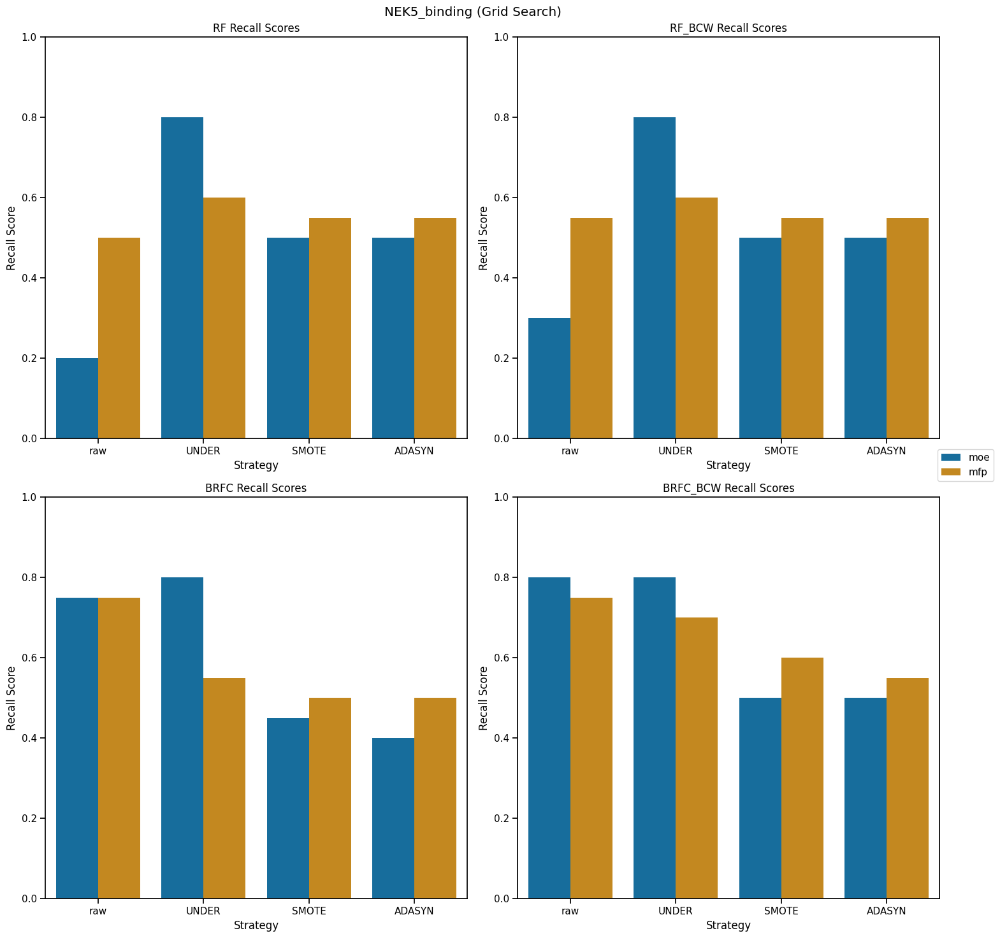

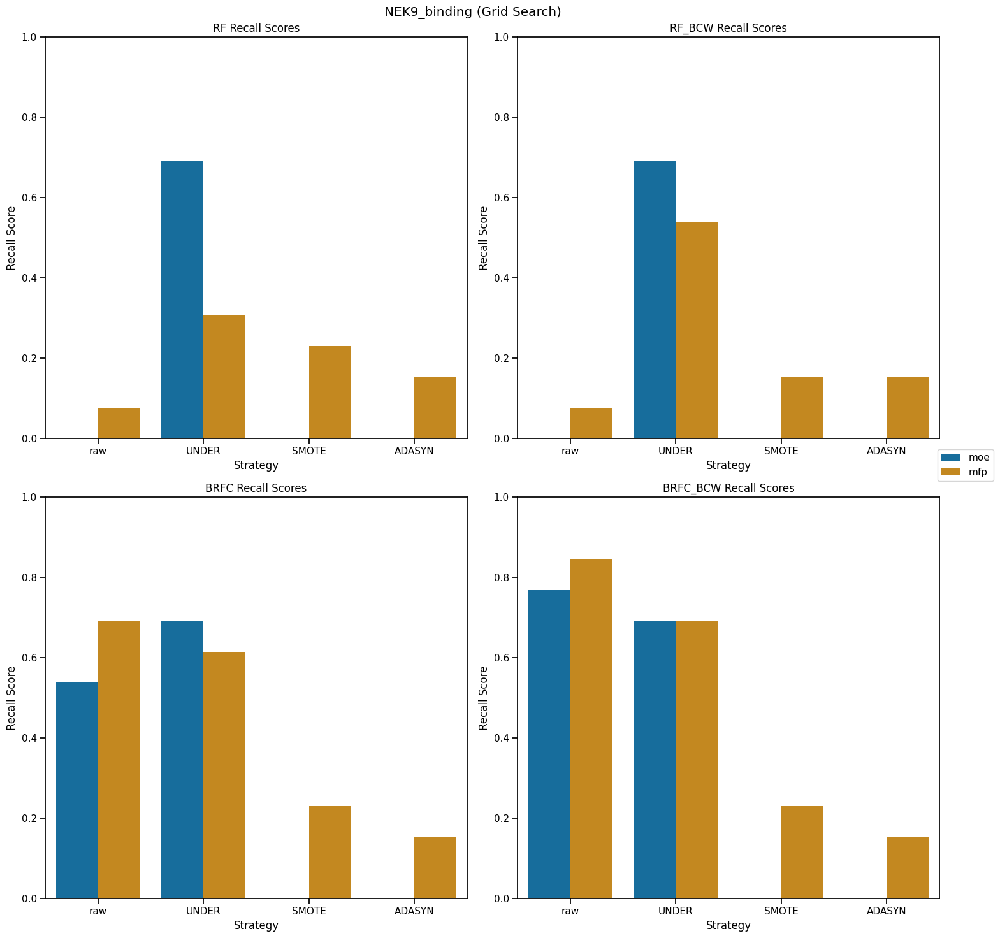

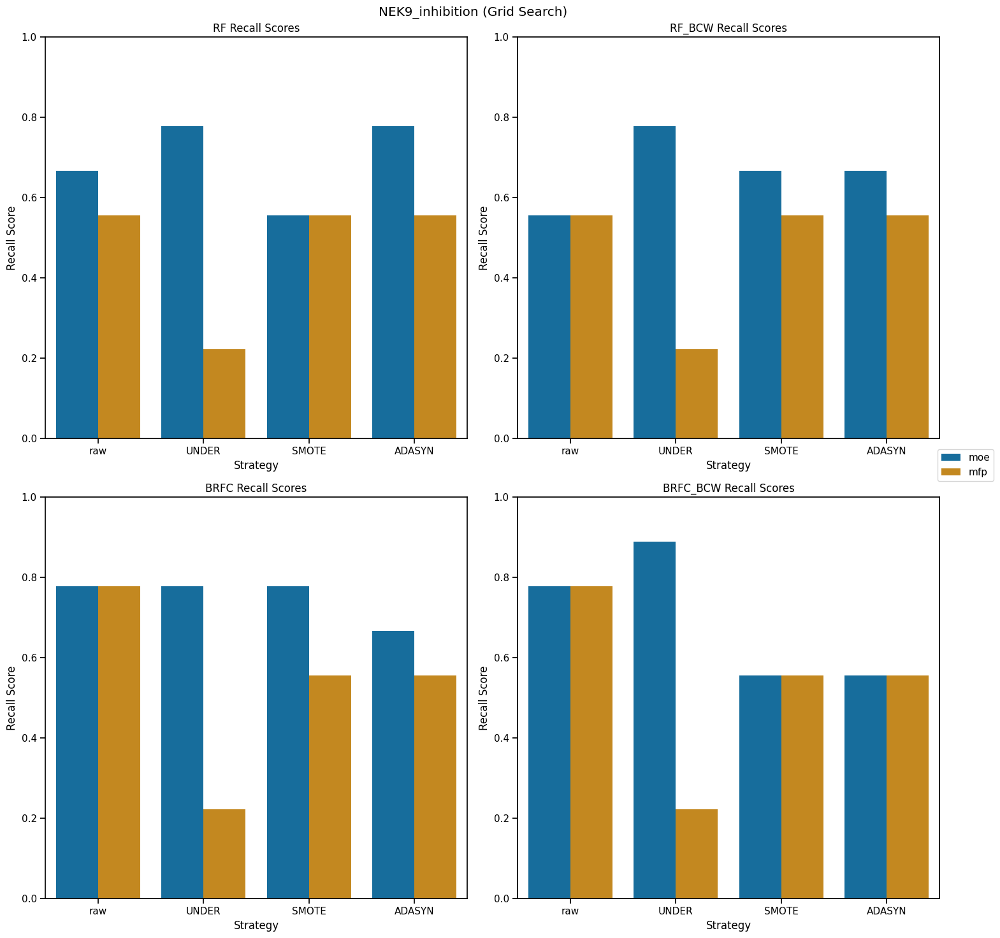

In [48]:
tptnfpfn = ['TN', 'TP', 'FP', 'FN']
for nek in neks: 
    df = df_all[df_all['NEK'] == nek]
    df = df.drop(columns = tptnfpfn)
    # ax = df.plot(x='dataset_category',kind='bar', figsize=(10,10))
    # p_all_metrics = sns.catplot(data=df, x='RF_type', y='recall', hue='strategy',col='feat_type', kind='bar')
    # for rf in df['RF_type'].unique(): 
    rf_types = df['RF_type'].unique()
    nrows = (len(rf_types)+2-1)//2
    fig, axes = plt.subplots(nrows, ncols=2, figsize=(15, 15))
    axes = axes.flatten()
    sns.set_context('notebook')
    sns.set_palette('colorblind')
    for ax, rf in zip(axes, rf_types):
        rf_df = df[df['RF_type'] == rf]
        sns.barplot(data=rf_df, x='strategy', y='recall', hue='feat_type', ax=ax)
        ax.set_xlabel('Strategy')
        ax.set_ylabel('Recall Score')
        ax.set_title(f'{rf} Recall Scores')
        ax.legend().remove()
        ax.set(ylim=(0,1))
        # ax.set_xticklabels(ax.get_xticklabels(), rotation=80)
        
        # p_all_metrics = sns.catplot(data=rf_df, x='strategy', y='recall', hue='feat_type', kind='bar')
        # plt.xlabel('Model name')
        # plt.ylabel('Metric Score')
        # plt.title(f'{nek} {rf} Model Performance')
        # plt.xticks(rotation=80)  
        # ax.legend(loc='upper left', bbox_to_anchor=(1,1))
    handles, labels = ax.get_legend_handles_labels()

    fig.legend(handles, labels, loc='center right', bbox_to_anchor=(1.05, 0.5))
    plt.suptitle(f'{nek} (Grid Search)')
    plt.tight_layout()
    plt.savefig(f'{figures_path}{nek}_{rf}_GS_recall.png',bbox_inches='tight')

    
    plt.show();    

# Recall and Precision Only for each model

In [49]:
metric_palette = sns.color_palette("RdPu", n_colors=2)
# metric_palette = ['palevioletred', 'darkseagreen']

NEK2_binding


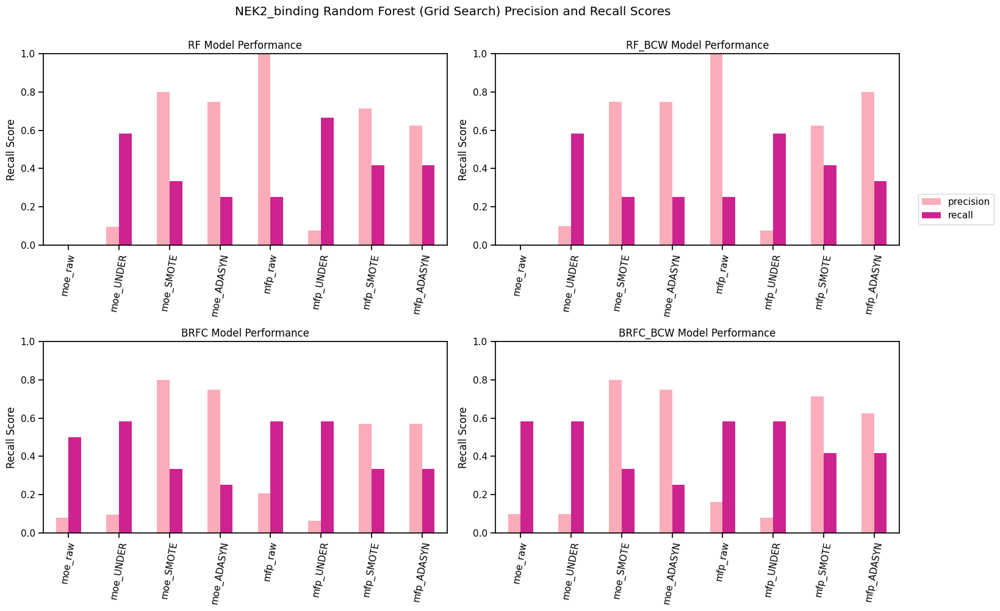

NEK2_inhibition


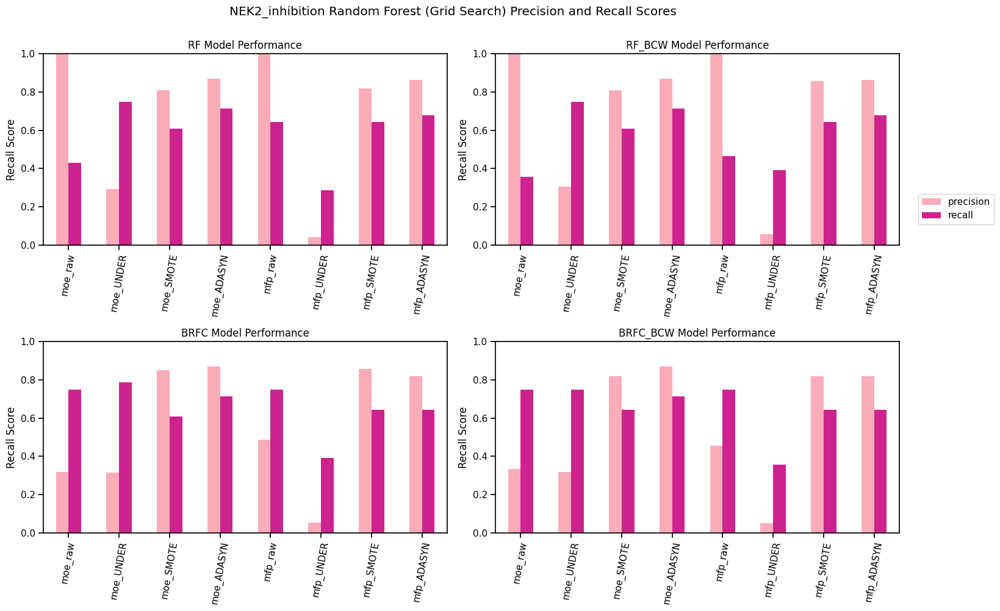

NEK3_binding


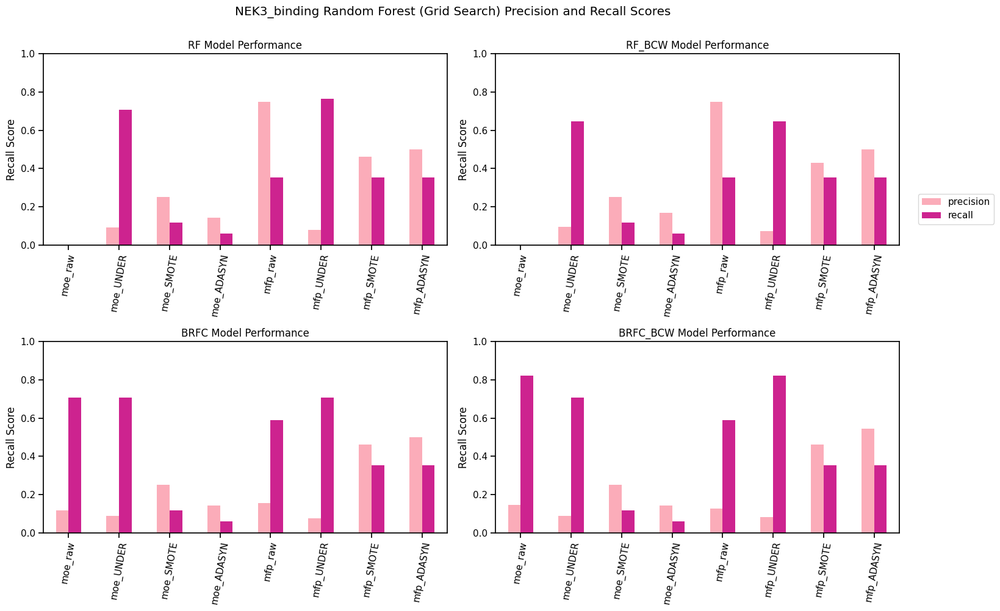

NEK5_binding


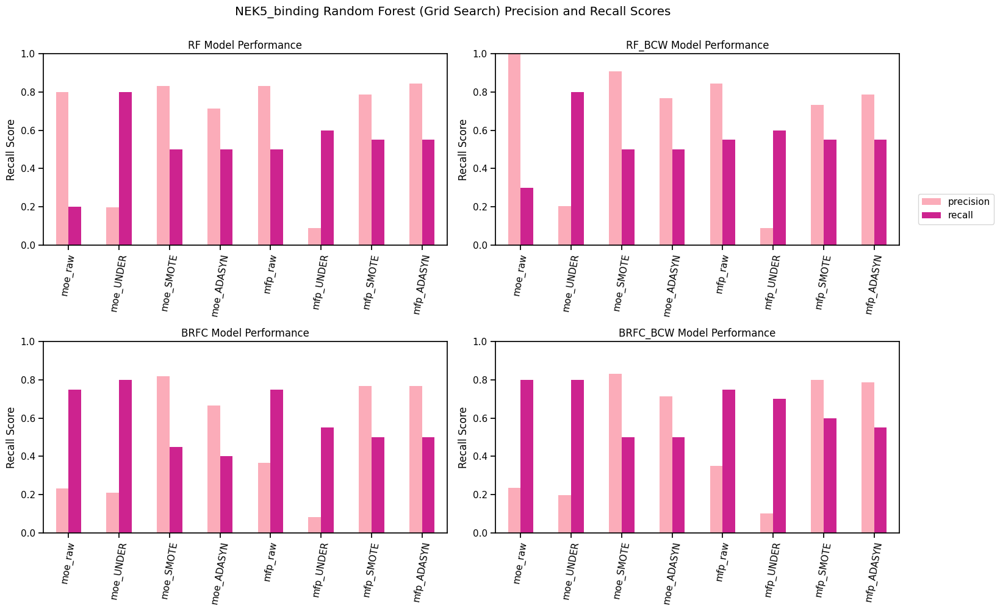

NEK9_binding


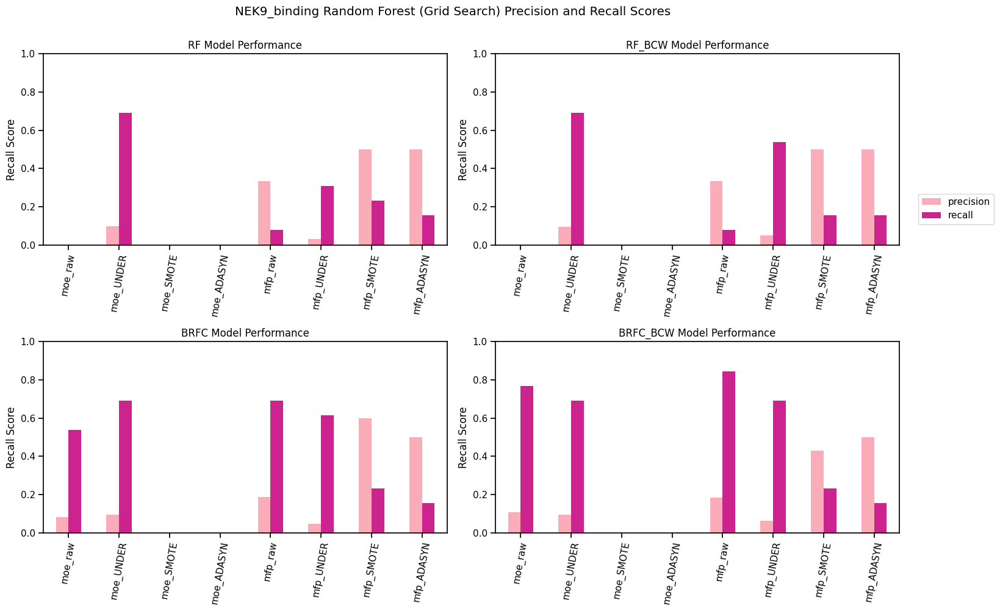

NEK9_inhibition


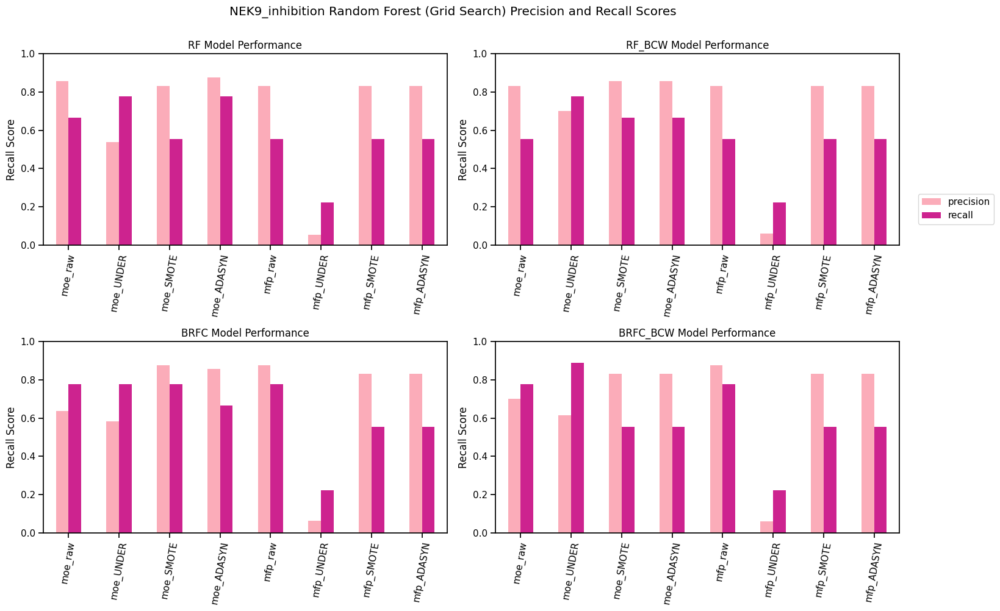

In [51]:
tptnfpfn = ['TN', 'TP', 'FP', 'FN']
for nek in neks: 
    print(nek)
    df = df_all[df_all['NEK'] == nek]
    df = df.drop(columns = tptnfpfn)
    rf_types = df['RF_type'].unique()
    ncols = 2
    nrows = (len(rf_types)+ncols-1)//ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(15,5 * nrows))
    axes = axes.flatten()
    keep_cols = ['precision', 'recall', 'RF_type', 'model', 'NEK', 'feat_type', 'strategy','dataset_category']
    for ax, rf in zip(axes, rf_types):
        rf_df = df[df['RF_type'] == rf]
        pr_df = rf_df[keep_cols]
        pr_df.plot(x='dataset_category',kind='bar', ax=ax, legend=False,color=metric_palette)
        # sns.barplot(data=pr_df,x='model', ax=ax, legend=False)
        ax.set_ylabel('Recall Score')
        ax.set_title(f'{rf} Model Performance')
        ax.set_xticklabels(ax.get_xticklabels(), rotation=80)
        ax.set(ylim=(0,1))
        ax.set(xlabel='')
        plt.suptitle(f'{nek} Random Forest (Grid Search) Precision and Recall Scores',y=1.0)
        
    for i in range(len(rf_types), len(axes)):
        fig.delaxes(axes[i])

    handles,labels = ax.get_legend_handles_labels()
    # fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(1.05, .7), ncol=len(labels))
    fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(1.05, .7))
    plt.tight_layout()
    plt.savefig(f'{figures_path}{nek}_RF_GS_prec_recall.png', bbox_inches='tight')
    plt.show();    

# Same as above, but all metrics 

In [52]:
# metric_palette = ['palevioletred', 'darkseagreen']
# metric_palette = sns.color_palette("RdPu", n_colors=2)
metric_palette2 = sns.color_palette('RdPu',n_colors=8)
metric_palette2

[(0.9931103421760862, 0.8893963860053825, 0.8771549404075356),
 (0.9891887735486352, 0.7982929642445213, 0.7805920799692426),
 (0.9830065359477124, 0.673202614379085, 0.7241830065359477),
 (0.9739792387543252, 0.5059592464436755, 0.6670511341791618),
 (0.922245290272972, 0.31507881584006153, 0.6135332564398308),
 (0.8052287581699347, 0.13725490196078433, 0.5594771241830065),
 (0.6327720107650904, 0.00392156862745098, 0.487443291041907),
 (0.45507112648981163, 0.0034448289119569397, 0.46046905036524416)]

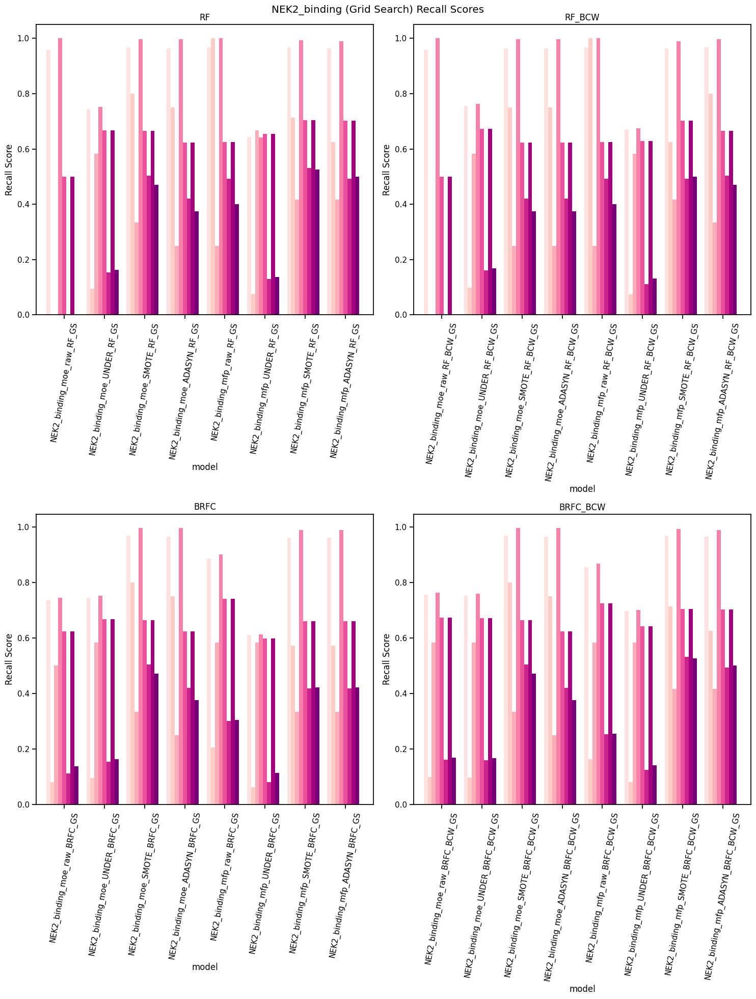

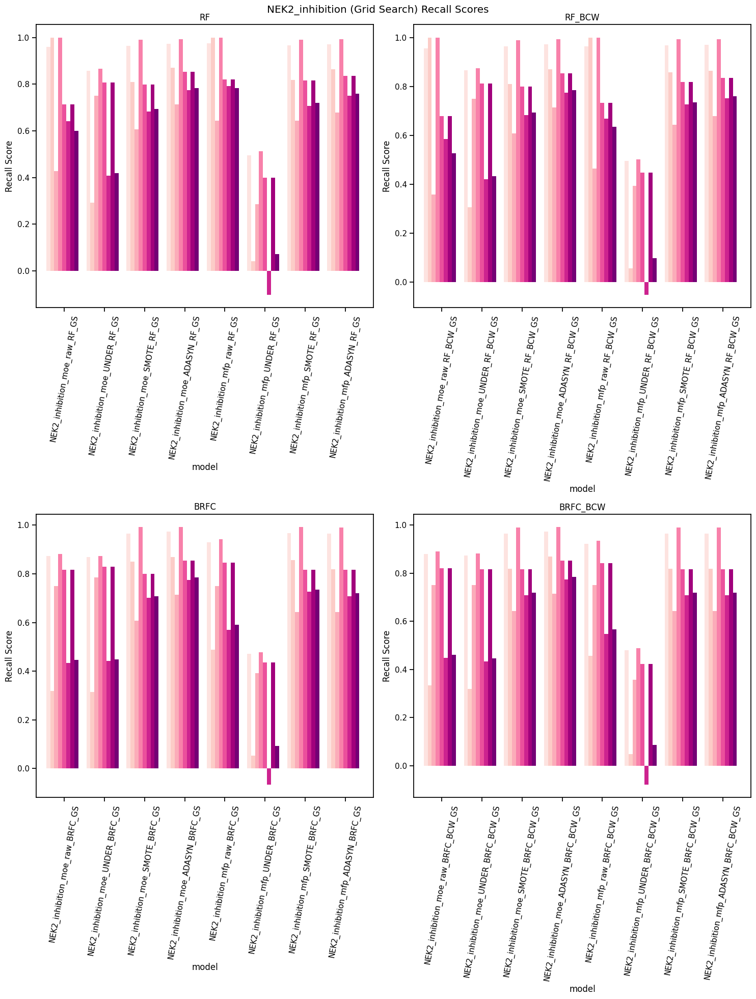

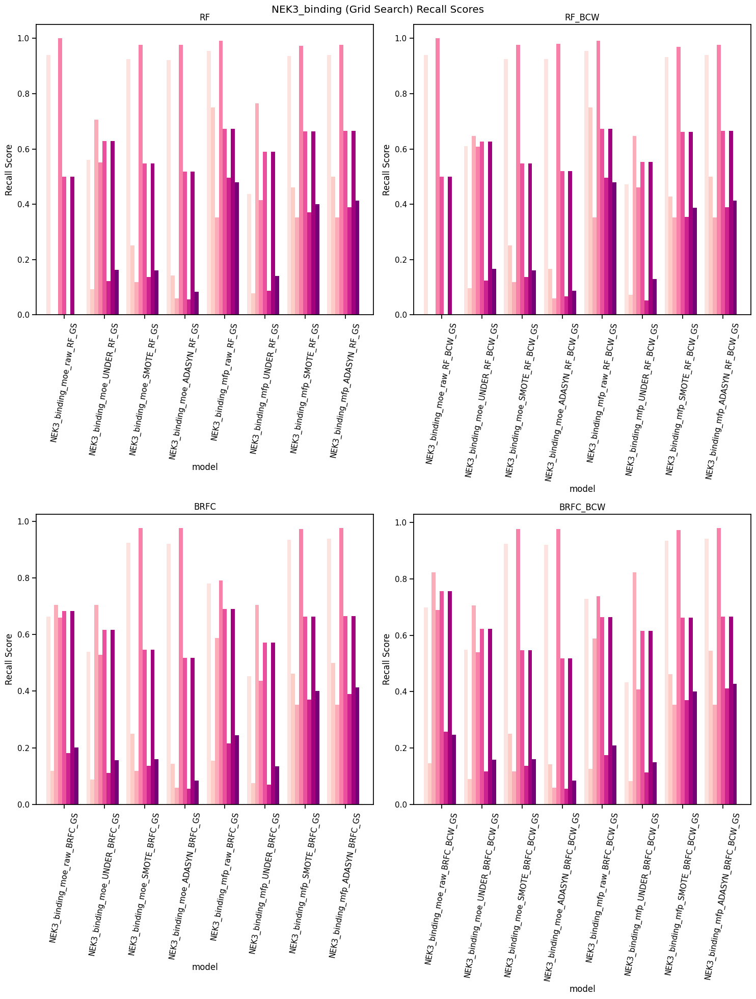

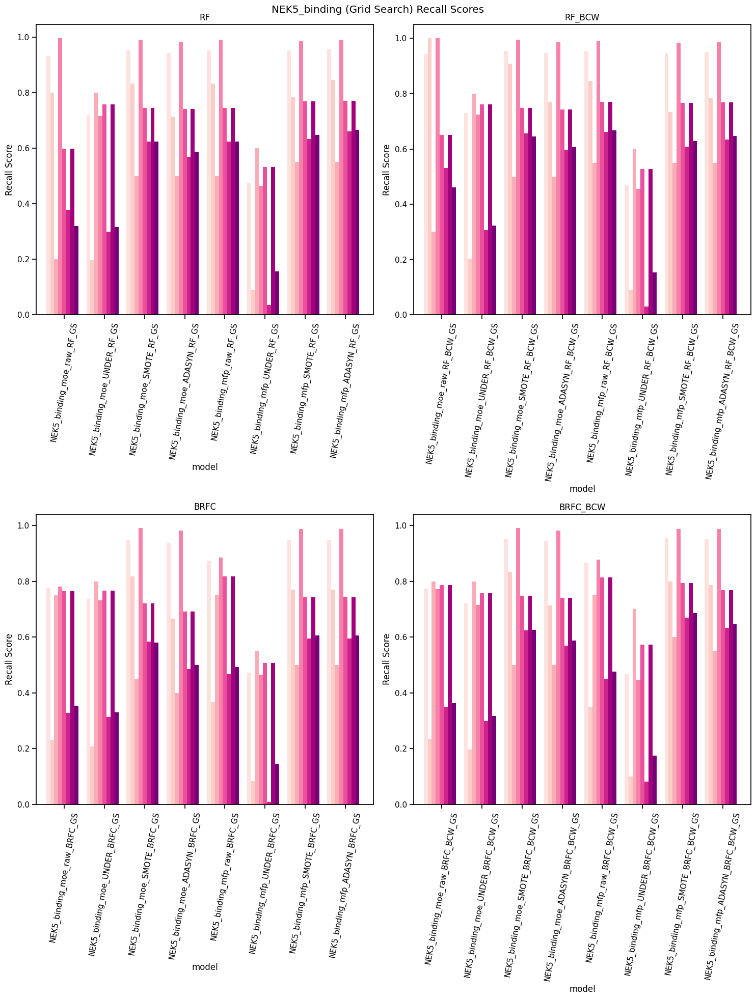

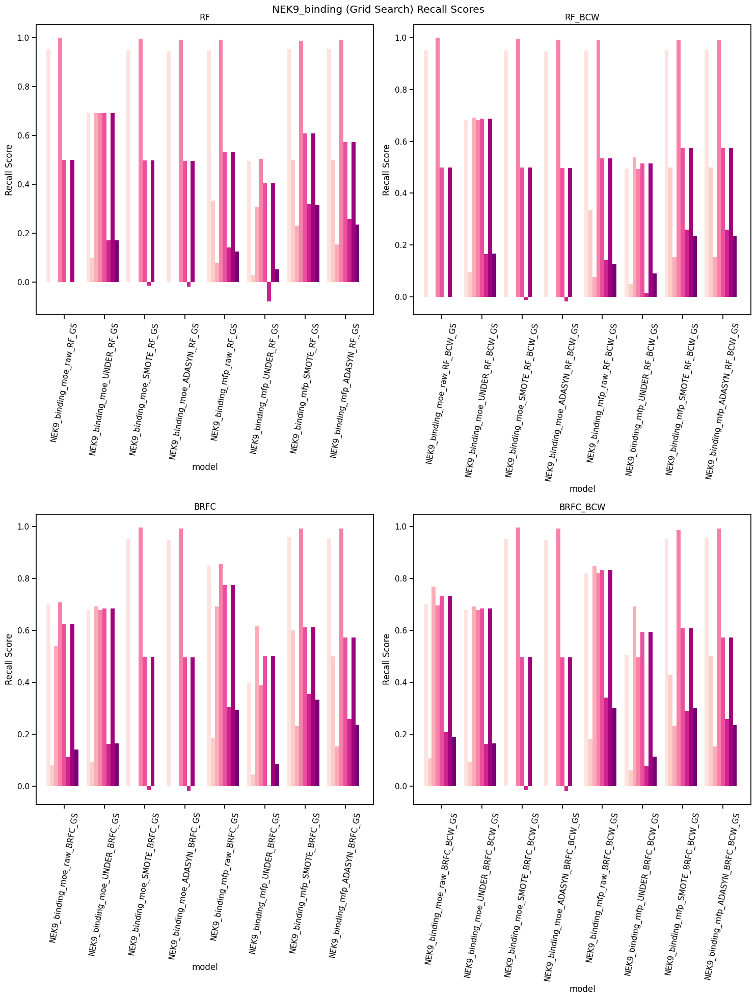

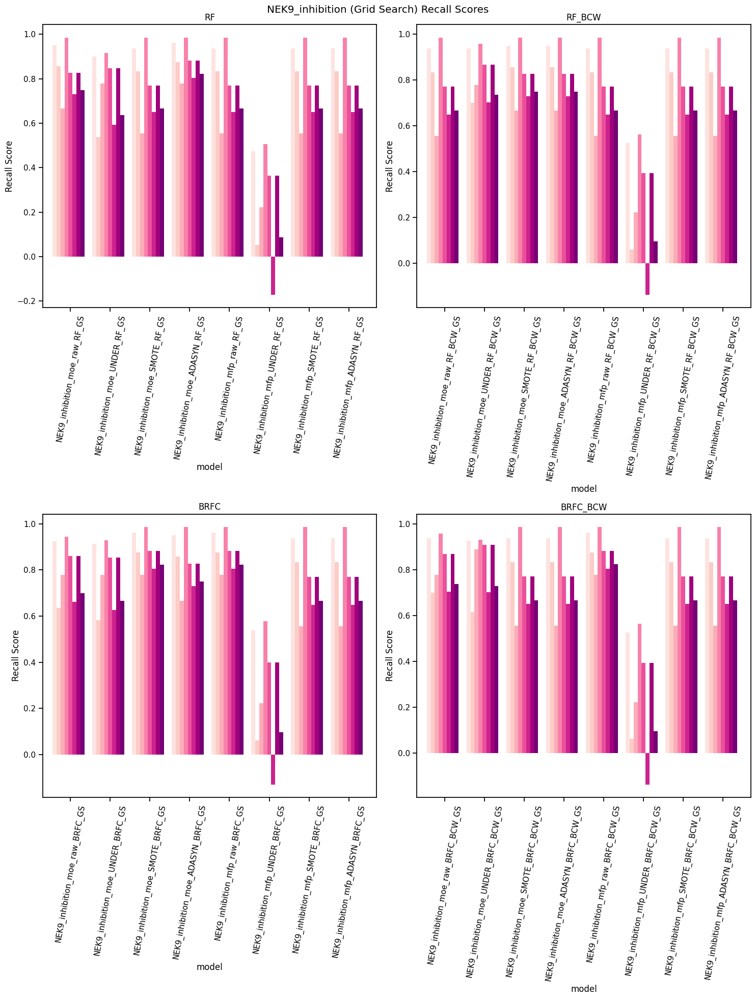

In [55]:
tptnfpfn = ['TN', 'TP', 'FP', 'FN']
for nek in neks: 
    df = df_all[df_all['NEK'] == nek]
    df = df.drop(columns = tptnfpfn)
    rf_types = df['RF_type'].unique()
    ncols = 2

    nrows = (len(rf_types)+ncols-1)//ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(15,10 * nrows))
    axes = axes.flatten()
    for ax, rf in zip(axes, rf_types):
        rf_df = df[df['RF_type'] == rf]
        rf_df.plot(x='model',kind='bar', ax=ax, legend=False,color=metric_palette2,width=0.9)
        ax.set_ylabel('Recall Score')
        ax.set_title(f'{rf}')
        # ax.set_xticklabels(rf['model name'], rotation=45)
        ax.set_xticklabels(ax.get_xticklabels(), rotation=80)

        plt.suptitle(f'{nek} (Grid Search) Recall Scores')
        
    for i in range(len(rf_types), len(axes)):
        fig.delaxes(axes[i])

    handles,labels = ax.get_legend_handles_labels()
    # fig.legend(handles, labels, loc='upper center',bbox_to_anchor=(1.1,1))
    # fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 1.01), ncol=len(labels))
    # ax.legend(loc='center',bbox_to_anchor=(1,1))
    plt.tight_layout()
    plt.savefig(f'{figures_path}{nek}_GS_all_recall.png', bbox_inches='tight')
    plt.show();    

# same as above but order by decreasing degree of imbalance 

In [56]:
size_df = pd.read_csv('/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/dataset_creation/all_NEK_dataset_sizes.csv')
size_df['train actives/total%'] = size_df['actives_train']/size_df['total_size']*100
df_all2 = df_all.copy()
tempcols = ['NEK', 'strategy', 'feat_type', 'model','RF_type','num_samples_train','actives_train', 'active%_train', 'num_samples_test', 'actives_test',
       'active%_test', 'total_size', 'total_actives', 'total actives/total%']
size_cols = ['num_samples_train','actives_train', 'active%_train', 'num_samples_test', 'actives_test',
       'active%_test', 'total_size', 'total_actives', 'total actives/total%','train actives/total%']
for i, nek in enumerate(neks): 
    for j,samp in enumerate(df_all2['strategy'].unique()):
        ds_idx = df_all2[(df_all2 ['NEK']==nek) & (df_all2['strategy']==samp)].index
        sizedf_idx = size_df[(size_df['NEK']==nek) & (size_df['strategy']==samp)].iloc[0]

        df_all2.loc[ds_idx, size_cols] = sizedf_idx[size_cols].values
        df_all2[(df_all2['NEK']==nek) & (df_all2['strategy']==samp)]
tempdf = df_all2[tempcols]
df_all2.columns

Index(['accuracy', 'precision', 'recall', 'specificity', 'ROC-AUC', 'MCC',
       'Balanced Accuracy', 'f1', 'y', 'TN', 'FN', 'FP', 'TP', 'model', 'cm',
       'NEK', 'feat_type', 'strategy', 'RF_type', 'dataset_category',
       'num_samples_train', 'actives_train', 'active%_train',
       'num_samples_test', 'actives_test', 'active%_test', 'total_size',
       'total_actives', 'total actives/total%', 'train actives/total%'],
      dtype='object')

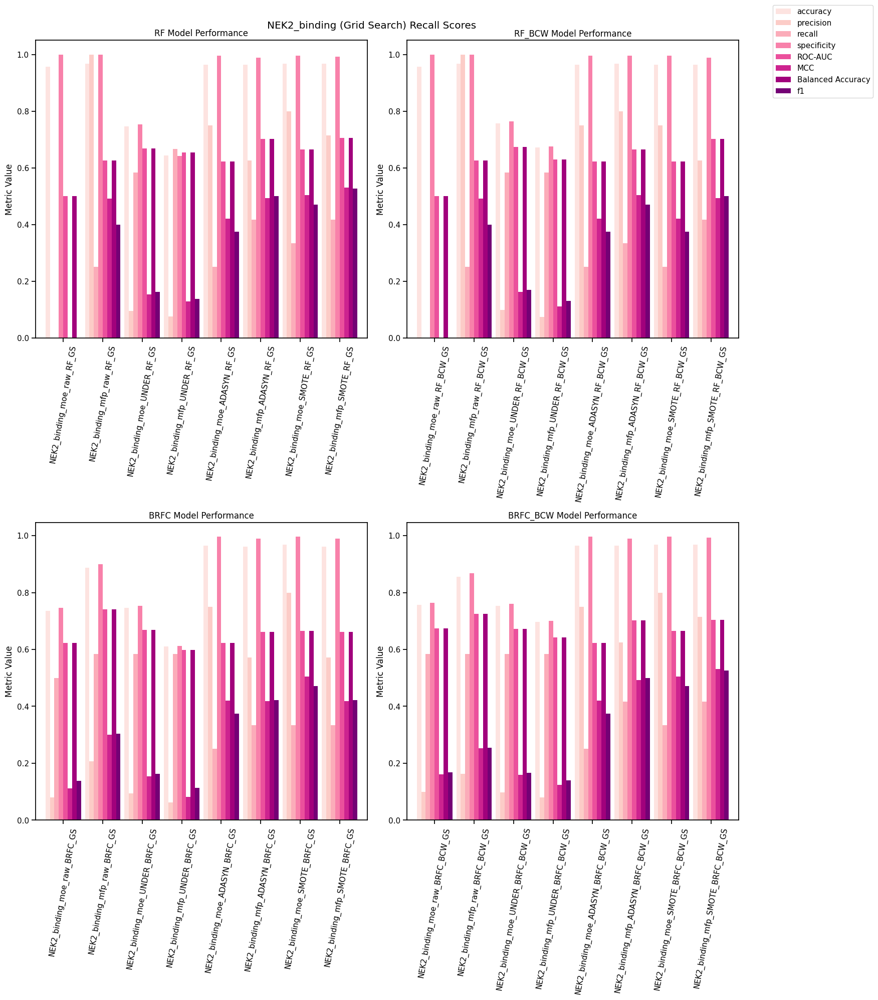

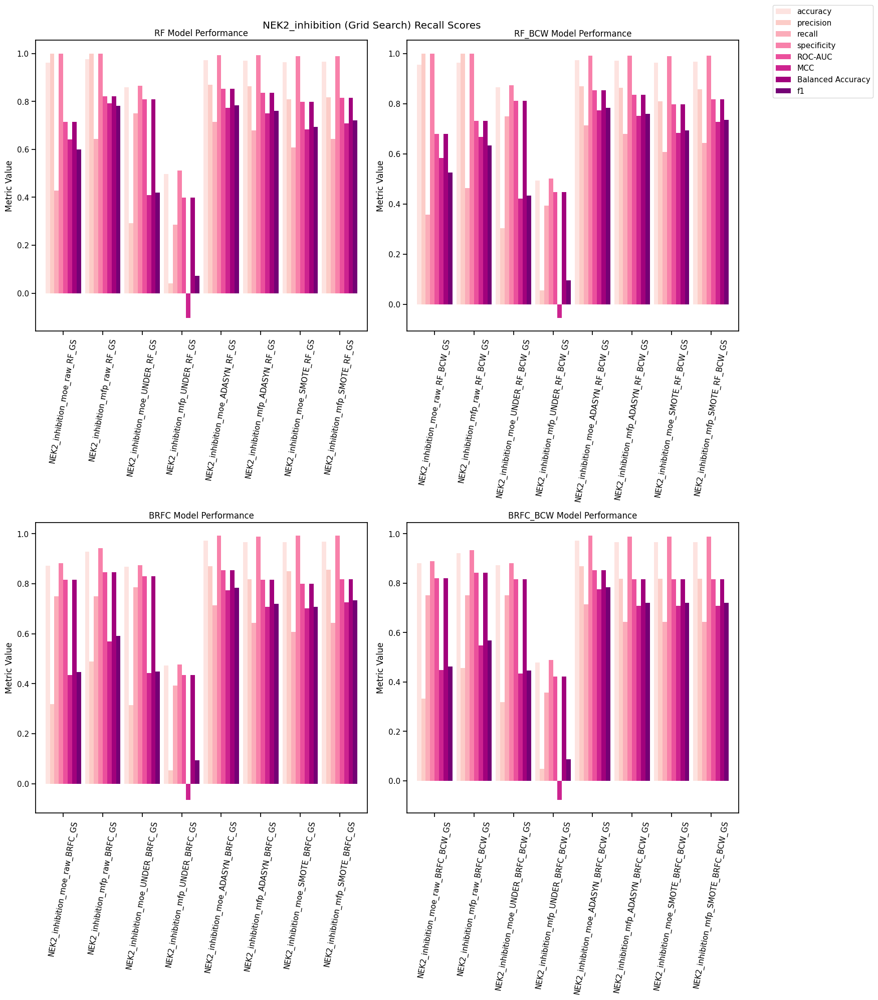

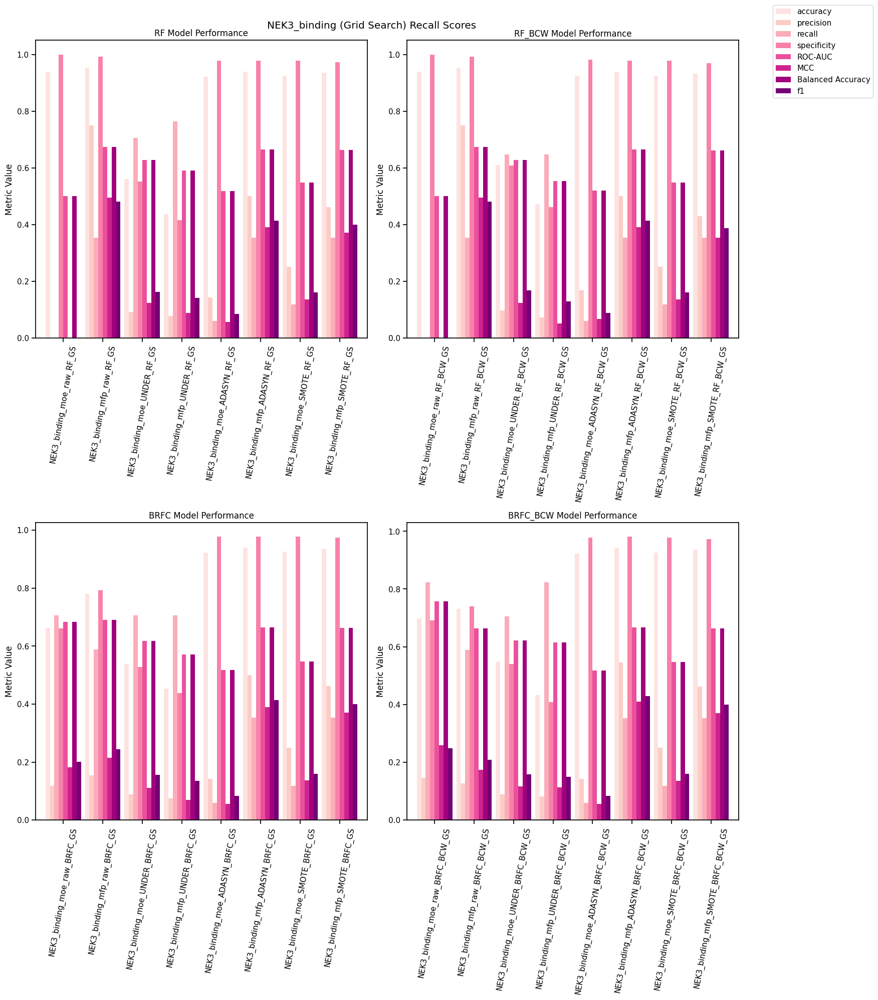

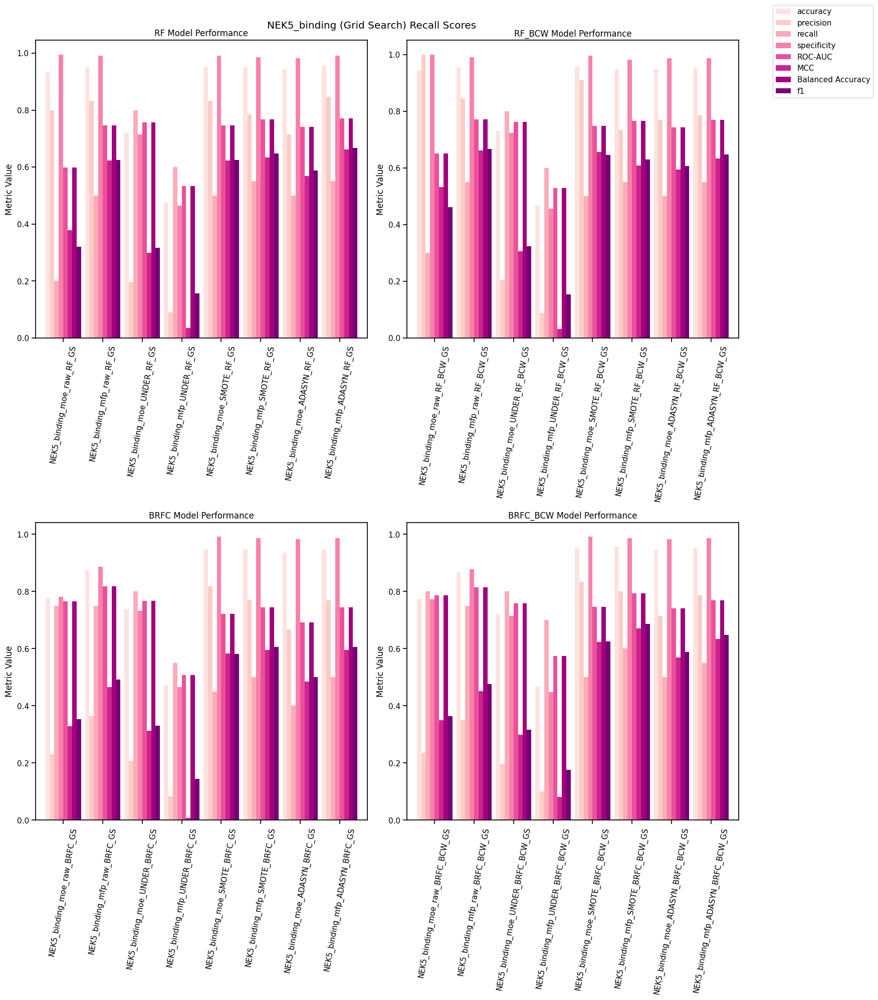

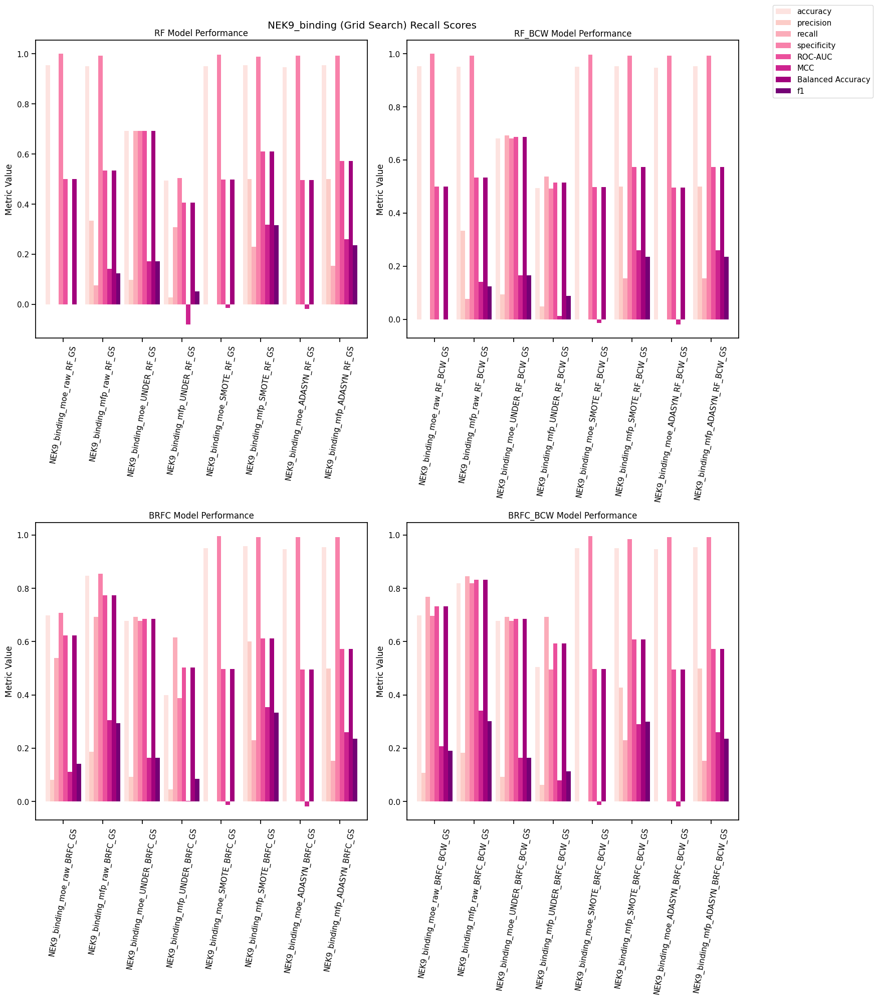

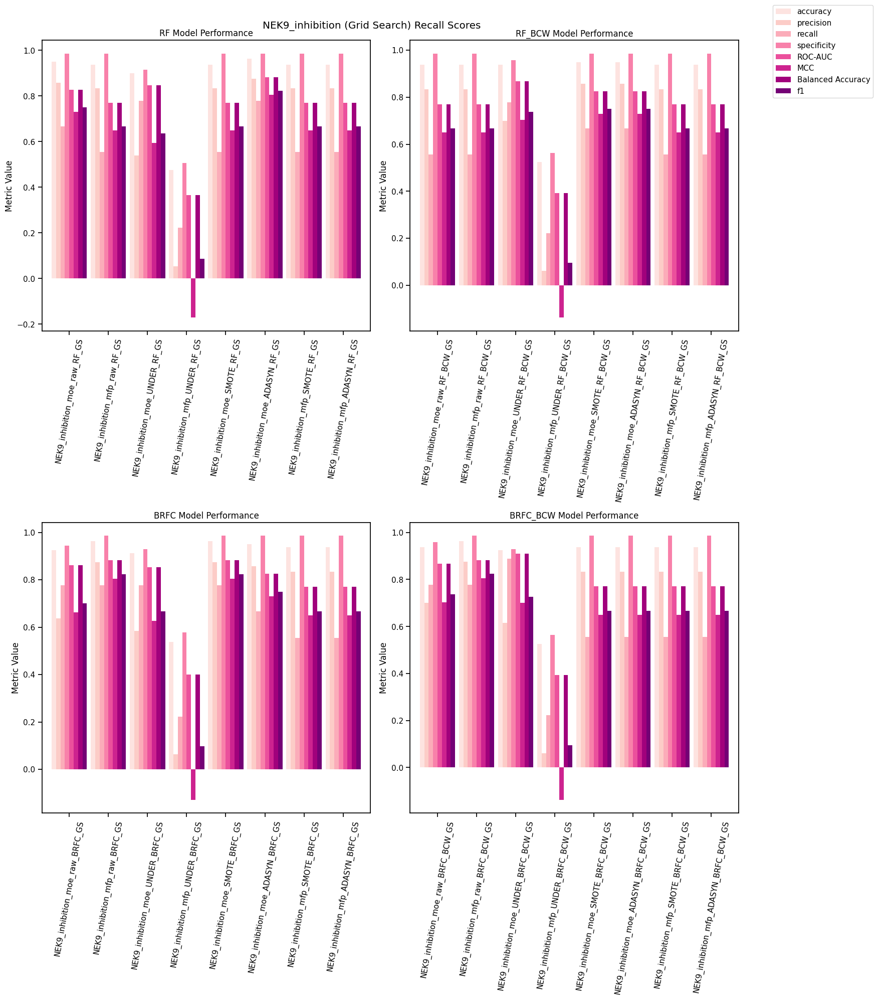

In [59]:
# metric_palette3 = sns.color_palette('RdPu',n_colors=18)
metric_cols2 = ['accuracy', 'precision', 'recall', 'specificity', 'TN', 'FN', 'FP',
       'TP', 'f1', 'ROC-AUC', 'MCC', 'Balanced Accuracy', 'model', 'cm',
       'prediction_type', 'NEK', 'feat_type', 'strategy', 'RF_type',
       'dataset_category']
size_cols = ['num_samples_train', 'actives_train',
       'active%_train', 'num_samples_test', 'actives_test', 'active%_test',
       'total_size', 'total_actives', 'total actives/total%','train actives/total%','y']
for nek in neks: 
    df = df_all2[df_all2['NEK'] == nek]
    df = df.drop(columns = tptnfpfn)
    
    rf_types = df['RF_type'].unique()
    fig, axes = plt.subplots(nrows, ncols, figsize=(15,10 * nrows))
    axes = axes.flatten()
    for ax, rf in zip(axes, rf_types):
        rf_df = df[df['RF_type'] == rf]
        rf_df=rf_df.sort_values('train actives/total%')
        rf_df=rf_df.drop(columns=size_cols)
        rf_df.plot(x='model',kind='bar', ax=ax, legend=False,color=metric_palette2,width=0.9)
        ax.set_ylabel('Metric Value')
        ax.set_title(f'{rf} Model Performance')
        # ax.set_xticklabels(rf['model name'], rotation=45)
        ax.set_xticklabels(ax.get_xticklabels(), rotation=80)
        plt.suptitle(f'{nek} (Grid Search) Recall Scores')
        ax.set(xlabel='')
        
    for i in range(len(rf_types), len(axes)):
        fig.delaxes(axes[i])

    handles,labels = ax.get_legend_handles_labels()
  
    fig.legend(handles, labels, loc='upper center',bbox_to_anchor=(1.1,1))
    plt.tight_layout()
    plt.savefig(f'{figures_path}{nek}_GS_all_metrics.png', bbox_inches='tight')
    plt.show();    

# subplot for every RF type and loop through each NEK

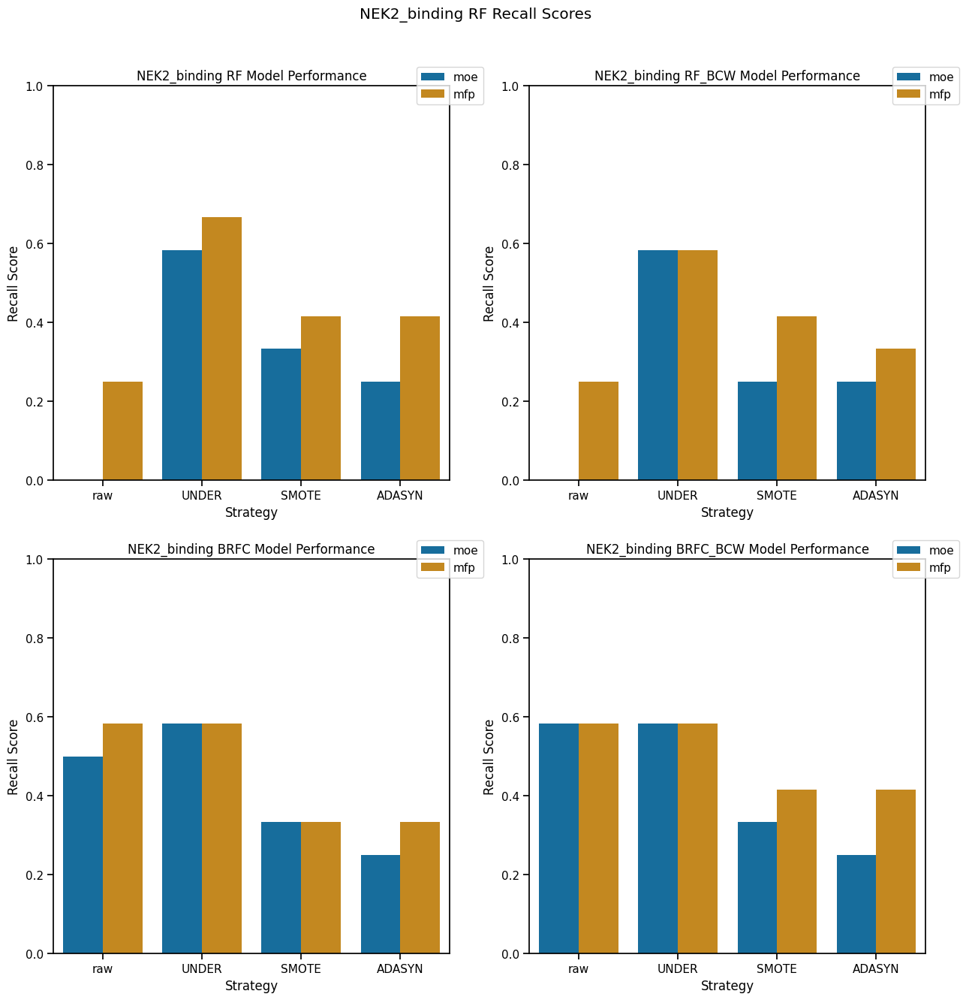

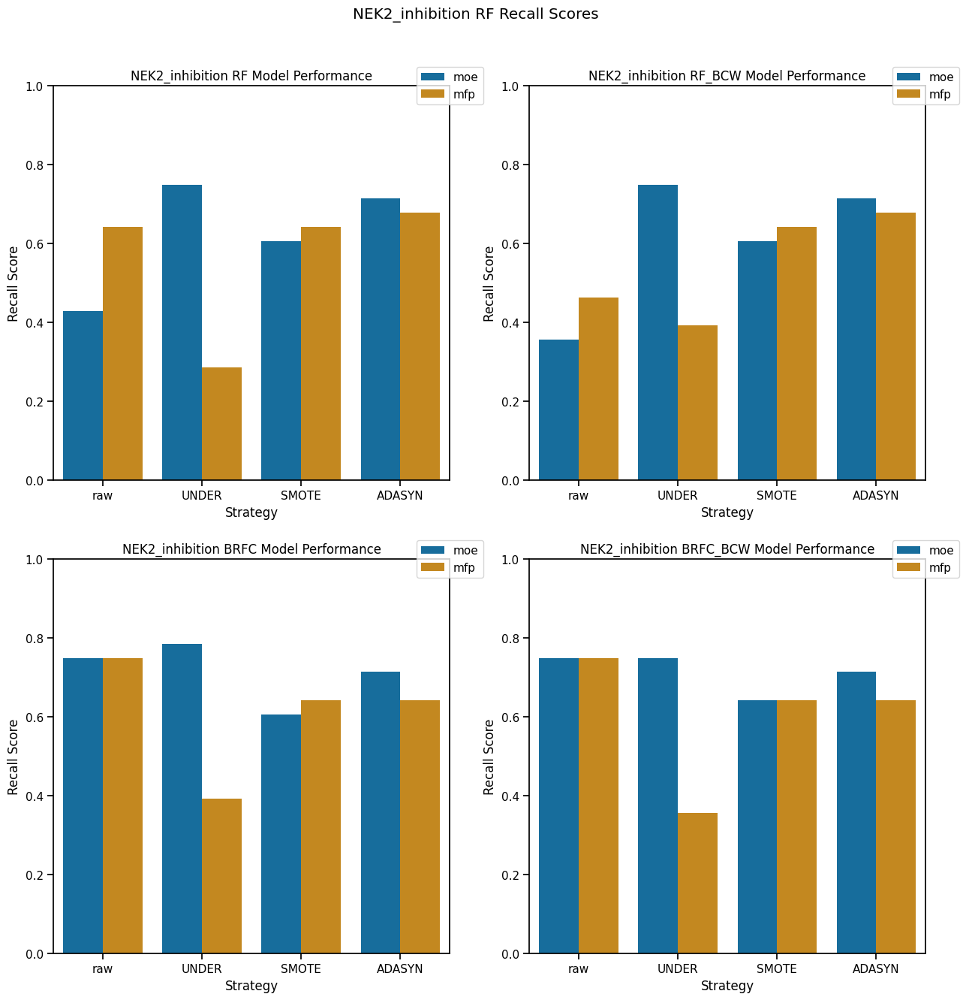

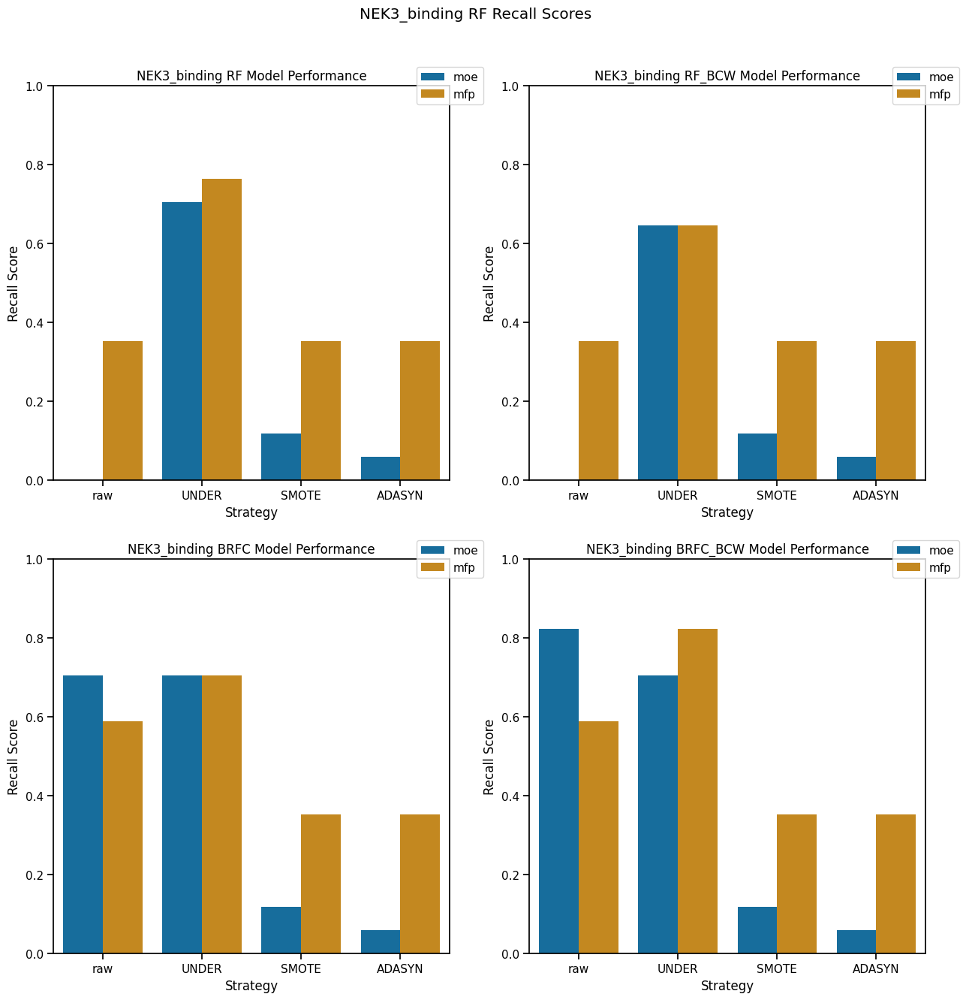

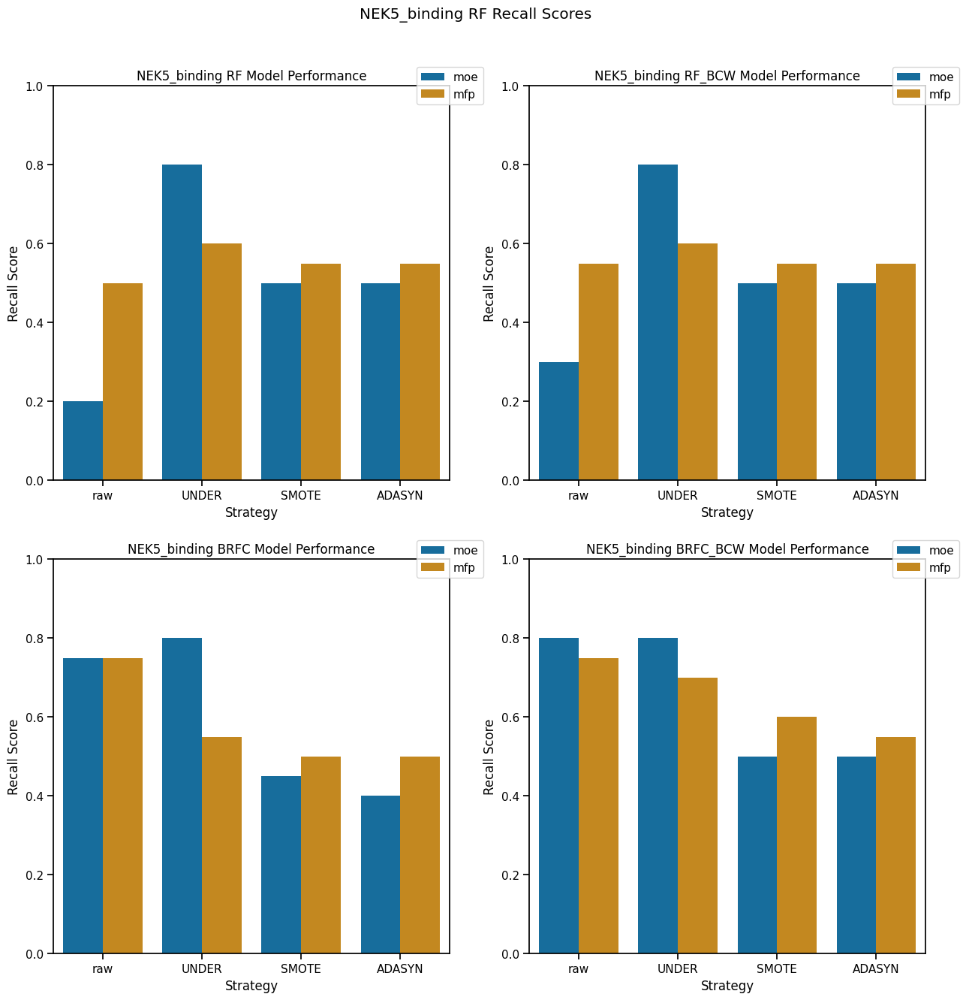

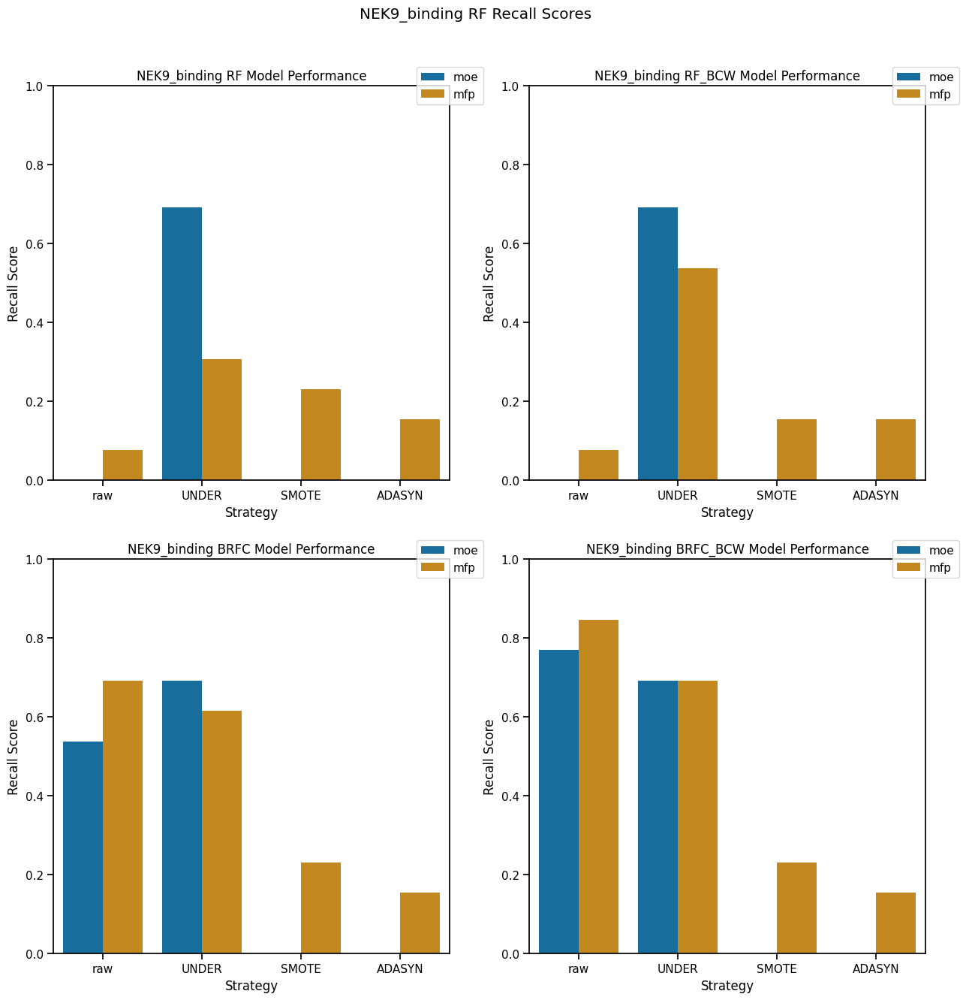

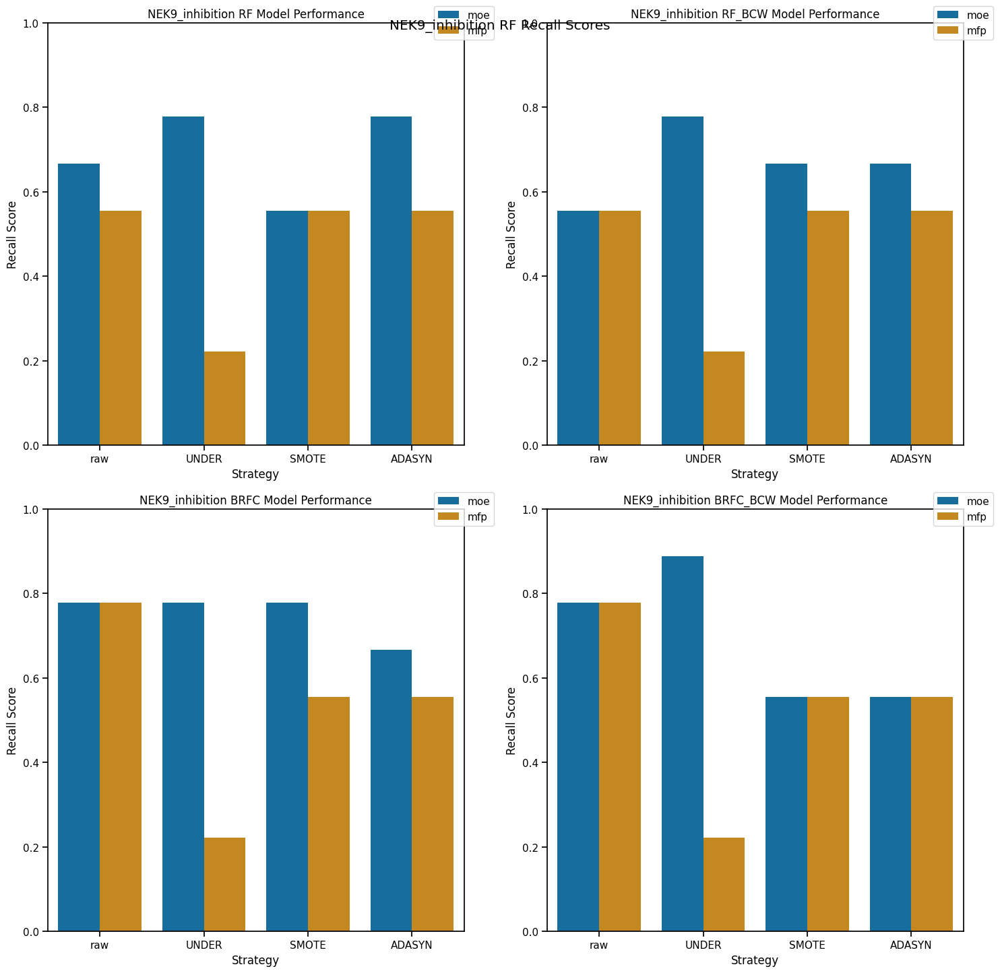

In [68]:
tptnfpfn = ['TN', 'TP', 'FP', 'FN']
for nek in neks: 
    df = df_all[df_all['NEK'] == nek]
    df = df.drop(columns = tptnfpfn)
    rf_types = df['RF_type'].unique()
    nrows = (len(rf_types)+2-1)//2
    fig, axes = plt.subplots(nrows, ncols=2, figsize=(15, 15))
    axes = axes.flatten()
    for ax, rf in zip(axes, rf_types):
        rf_df = df[df['RF_type'] == rf]
        sns.barplot(data=rf_df, x='strategy', y='recall', hue='feat_type', ax=ax)
        ax.set_xlabel('Strategy')
        ax.set_ylabel('Recall Score')
        ax.set_title(f'{nek} {rf} Model Performance')
        ax.legend(loc='center',bbox_to_anchor=(1,1))
        ax.set(ylim=(0,1))
        plt.suptitle(f'{nek} RF Recall Scores',y=0.95)
        plt.savefig(f'{figures_path}_GS_recall_moe_mfp.png',bbox_inches='tight')
        
plt.tight_layout()
# plt.savefig(f'figures/RF_plots/RF_NEK_recall_moe_mfp.png',bbox_inches='tight')
plt.show();    

# save all subplots in one fig 

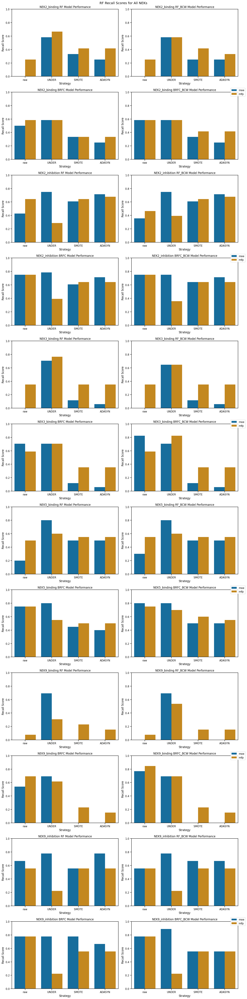

In [69]:
total_rf_types = len(df_all['RF_type'].unique())
total_neks = len(neks)
total_subplots = total_rf_types * total_neks
nrows = (total_subplots + 2 - 1) // 2
fig, axes = plt.subplots(nrows, ncols=2, figsize=(15, nrows * 5))
axes = axes.flatten()
ax_idx = 0
for nek in neks:
    df = df_all[df_all['NEK'] == nek]
    df = df.drop(columns=['TN', 'TP', 'FP', 'FN'])
    rf_types = df['RF_type'].unique()
    
    for rf in rf_types:
        ax = axes[ax_idx]
        rf_df = df[df['RF_type'] == rf]
        sns.barplot(data=rf_df, x='strategy', y='recall', hue='feat_type', ax=ax)
        ax.set_xlabel('Strategy')
        ax.set_ylabel('Recall Score')
        ax.set_title(f'{nek} {rf} Model Performance')
        ax.set_ylim(0,1)
        ax_idx += 1
        ax.get_legend().remove()
    ax.legend(loc='center',bbox_to_anchor=(1,1))
handles, labels = ax.get_legend_handles_labels()

plt.tight_layout();
plt.suptitle('RF Recall Scores for All NEKs',y=1.001)
plt.savefig(f'{figures_path}RF_GS_NEK_recall_moe_mfp.png', bbox_inches='tight')
plt.show();

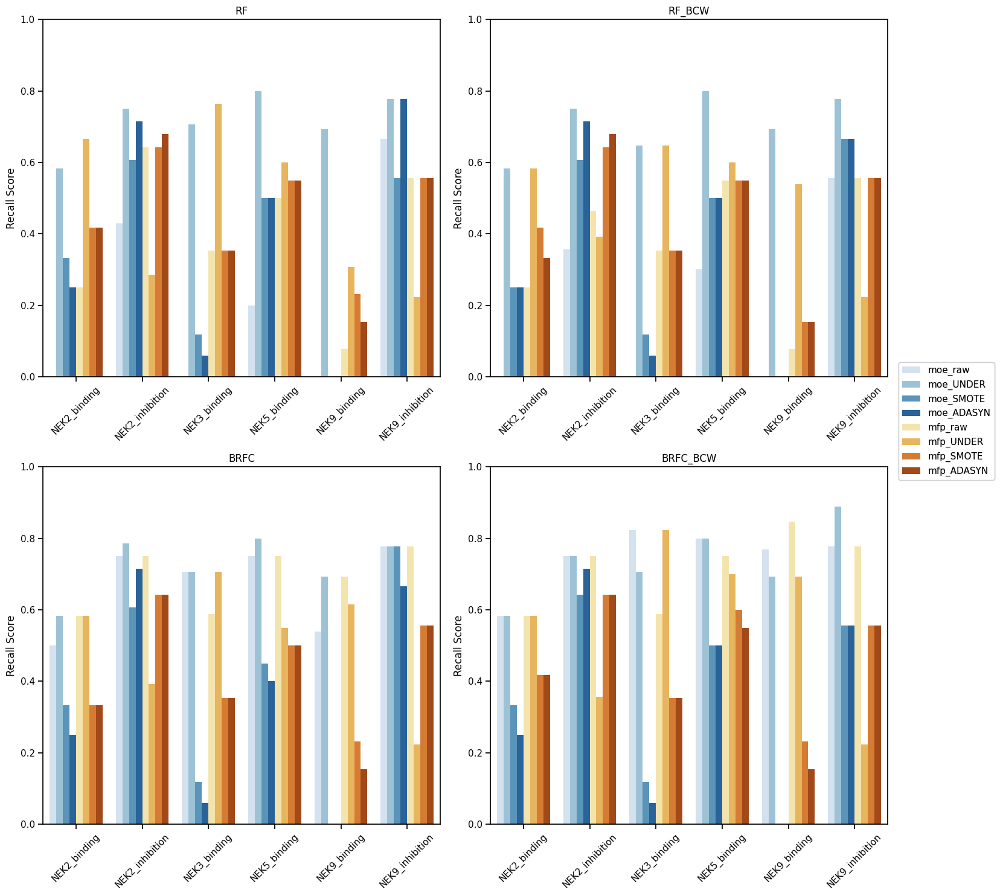

In [70]:
tptnfpfn = ['TN', 'TP', 'FP', 'FN']
nrows = (len(rf_types)+2-1)//2
fig, axes = plt.subplots(nrows, ncols=2, figsize=(15, 15))
axes = axes.flatten()

for ax, rf in zip(axes, df_all2['RF_type'].unique()):
    df = df_all2[df_all2['RF_type'] == rf].drop(columns=tptnfpfn)
    # df.sort_values('train actives/total%',inplace=True)
    sns.barplot(data=df, x='NEK', y='recall', hue='dataset_category', ax=ax,palette=dataset_palette)
  
    # ax.set_xlabel('NEK')
    ax.set_ylabel('Recall Score')
    ax.set_title(f'{rf}')
    ax.legend(loc='center', bbox_to_anchor=(1, 1))
    ax.tick_params(axis='x', rotation=45)
    ax.set(ylim=(0,1))
    ax.set(xlabel=None)
    ax.get_legend().remove()
    handles,labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center',bbox_to_anchor=(1.05,.6))
    
plt.tight_layout()
plt.savefig(f'{figures_path}RF_GS_typesubplots_recall.png',bbox_inches='tight')
plt.show();


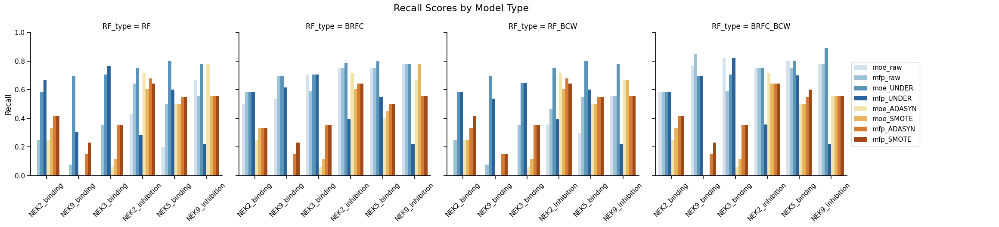

In [75]:
tptnfpfn = ['TN', 'TP', 'FP', 'FN']
# sns.catplot(data=nek_df, x='RF_type', y='recall', hue='strategy',col='feat_type', kind='bar')
df = df_all2.drop(columns = tptnfpfn)
# df=df.sort_values('train actives/total%')
df=df.sort_values('NEK')
g2 = sns.catplot(data=df, x='NEK', y='recall', hue='dataset_category',col='RF_type', kind='bar', palette=dataset_palette)
plt.xticks(rotation=45)
sns.move_legend(g2, (1.0, 0.4))

g2.fig.subplots_adjust(top=0.95)
for ax in g2.axes.flat:
    ax.set_ylabel('Recall')
    for label in ax.get_xticklabels():
        label.set_rotation(45)
    ax.set(xlabel=None)
    ax.set(ylim=(0,1))
plt.legend(loc='center',bbox_to_anchor=(1.2,0.5))
plt.tight_layout()
plt.suptitle('Recall Scores by Model Type',y=1.05,fontsize=16)
plt.savefig(f'{figures_path}RF_GS_recall_horizontal_by_RF_type.png',bbox_inches='tight')
plt.show();

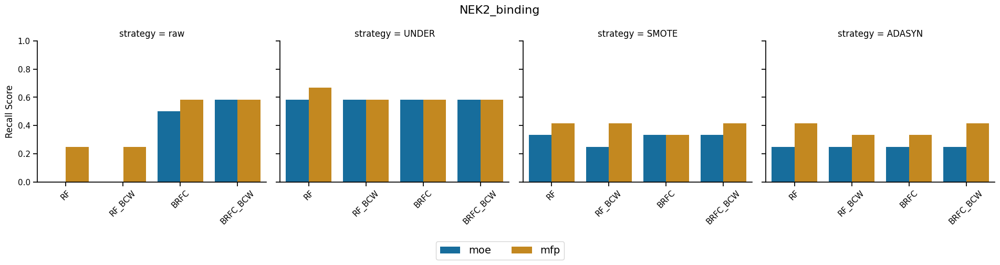

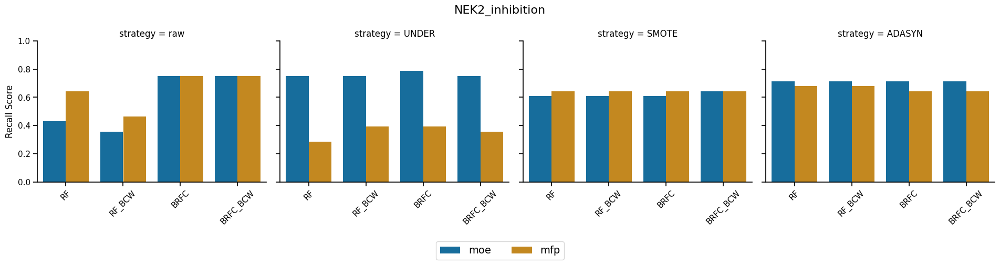

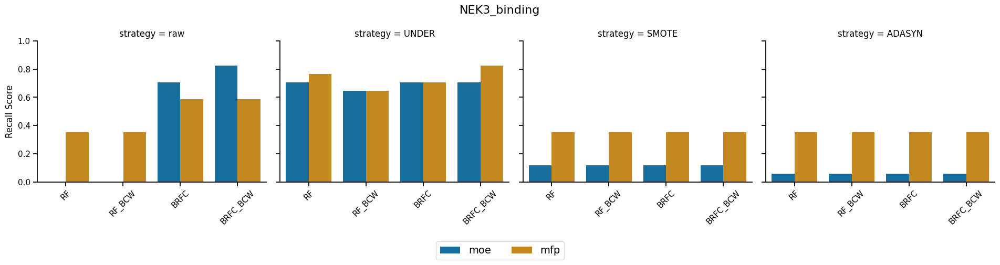

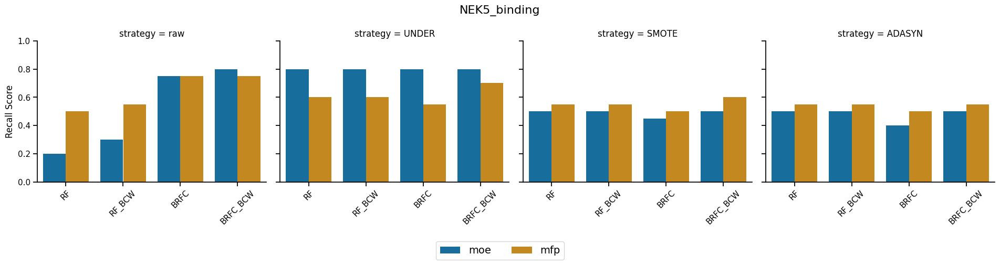

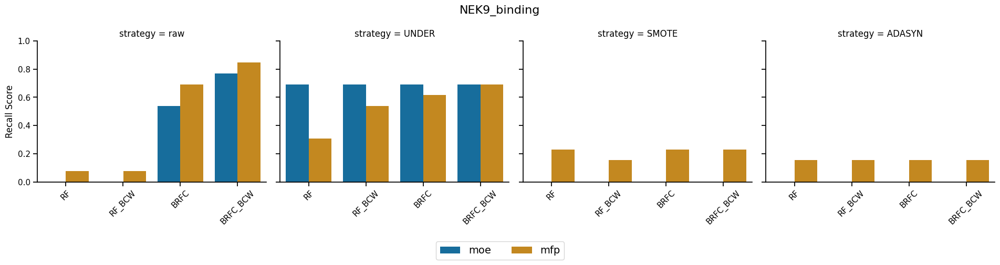

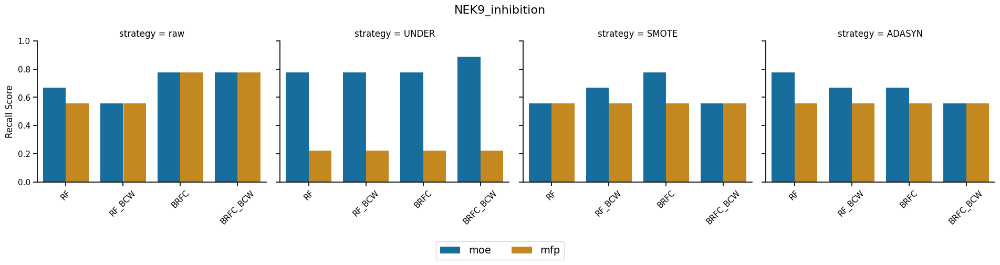

In [76]:
for n, nek in enumerate(neks): 
    nek_df = df_all[df_all['NEK'] ==nek]
    g5 = sns.catplot(data=nek_df, x='RF_type', y='recall', hue='feat_type', col='strategy', kind='bar', height=4, aspect=1.2,legend_out=False)
    g5.fig.suptitle(f'{nek}', y=1.02,fontsize=16)

    for ax in g5.axes.flat:
        for label in ax.get_xticklabels():
            label.set_rotation(45)
        if ax.get_legend() is not None:
            ax.get_legend().remove()
        ax.set(ylabel='Recall Score')
        ax.set(xlabel=None)
        ax.set(ylim=(0,1))
    g5.fig.subplots_adjust(top=0.85)
    # g5.fig.legend(loc='center', bbox_to_anchor=(1.044,0.5))
    g5.fig.legend(loc='center', bbox_to_anchor=(0.5,-.15), ncol=2,fontsize=14)
    # fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 1.01), ncol=len(labels))
    plt.show();
    g5.fig.savefig(f"{figures_path}{nek}_RF_GS_subplot_by_strategy.png", bbox_inches='tight')
    

In [ ]:
# Sort by modeling type
# 1. sort by 'feat_type' and make the strategies next to each other to compare RF_type (moe_ADASYN, mfp_ADASYN x4 each for 4x RF types) 
# moe_SMOTE_RF, moe_SMOTE_RF_BCW, moe_SMOTE_
# 2. sort by 'strategy' and make the feat

In [77]:
short_df_cols = [ 'NEK',  'feat_type', 'strategy', 'RF_type',  'precision', 'recall','cm', 'dataset_category']
strategies = ['scaled', 'UNDER', 'SMOTE', 'ADASYN']
feat_types = ['moe', 'mfp']
rf_types = ['RF', 'RF_BCW', 'BRFC', 'BRFC_BCW']
for nek in neks: 
    print(nek)
    # nek_df = df_all[df_all['NEK']==nek] 
    # nek_df = df_all.loc[df_all['NEK'] == nek, short_df_cols]
    # nek_pivot  = nek_df.pivot(index='dataset_category', columns ='RF_type', values='recall')
    # display(nek_pivot)
    
    # sorted = nek_df.sort_values('feat_type')
    # display(sorted)
    # print()

NEK2_binding
NEK2_inhibition
NEK3_binding
NEK5_binding
NEK9_binding
NEK9_inhibition


# feat_type, strategy, RF_type 


In [78]:
short_df_cols = [ 'NEK',  'feat_type', 'strategy', 'RF_type',  'precision', 'recall','cm', 'dataset_category']
strategies = ['raw', 'UNDER', 'SMOTE', 'ADASYN']
feat_types = ['moe', 'mfp']
rf_types = ['RF', 'RF_BCW', 'BRFC', 'BRFC_BCW']
for nek in neks: 
    nek_df = df_all.loc[df_all2['NEK'] == nek, short_df_cols]
    for strat in strategies: 
        print(f'{nek} {strat}')
        strategy_df = nek_df.loc[nek_df['strategy'] == strat, short_df_cols]
        display(strategy_df) 
        ordered_strat_df = strategy_df.sort_values('RF_type')
        display(ordered_strat_df)
        print(f'feat type and rf type for best recall for {nek} {strat} \n {strategy_df.loc[strategy_df["recall"].idxmax(), ["feat_type", "RF_type"]]}')

    print()

NEK2_binding raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
0,NEK2_binding,moe,raw,RF,0.000000,0.000000,"[271, 0, 12, 0]",moe_raw
1,NEK2_binding,moe,raw,RF_BCW,0.000000,0.000000,"[271, 0, 12, 0]",moe_raw
2,NEK2_binding,moe,raw,BRFC,0.080000,0.500000,"[202, 69, 6, 6]",moe_raw
3,NEK2_binding,moe,raw,BRFC_BCW,0.098592,0.583333,"[207, 64, 5, 7]",moe_raw
16,NEK2_binding,mfp,raw,RF,1.000000,0.250000,"[271, 0, 9, 3]",mfp_raw
17,NEK2_binding,mfp,raw,RF_BCW,1.000000,0.250000,"[271, 0, 9, 3]",mfp_raw
18,NEK2_binding,mfp,raw,BRFC,0.205882,0.583333,"[244, 27, 5, 7]",mfp_raw
19,NEK2_binding,mfp,raw,BRFC_BCW,0.162791,0.583333,"[235, 36, 5, 7]",mfp_raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
2,NEK2_binding,moe,raw,BRFC,0.080000,0.500000,"[202, 69, 6, 6]",moe_raw
18,NEK2_binding,mfp,raw,BRFC,0.205882,0.583333,"[244, 27, 5, 7]",mfp_raw
3,NEK2_binding,moe,raw,BRFC_BCW,0.098592,0.583333,"[207, 64, 5, 7]",moe_raw
19,NEK2_binding,mfp,raw,BRFC_BCW,0.162791,0.583333,"[235, 36, 5, 7]",mfp_raw
0,NEK2_binding,moe,raw,RF,0.000000,0.000000,"[271, 0, 12, 0]",moe_raw
16,NEK2_binding,mfp,raw,RF,1.000000,0.250000,"[271, 0, 9, 3]",mfp_raw
1,NEK2_binding,moe,raw,RF_BCW,0.000000,0.000000,"[271, 0, 12, 0]",moe_raw
17,NEK2_binding,mfp,raw,RF_BCW,1.000000,0.250000,"[271, 0, 9, 3]",mfp_raw


feat type and rf type for best recall for NEK2_binding raw 
 feat_type         moe
RF_type      BRFC_BCW
Name: 3, dtype: object
NEK2_binding UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
4,NEK2_binding,moe,UNDER,RF,0.094595,0.583333,"[204, 67, 5, 7]",moe_UNDER
5,NEK2_binding,moe,UNDER,RF_BCW,0.098592,0.583333,"[207, 64, 5, 7]",moe_UNDER
6,NEK2_binding,moe,UNDER,BRFC,0.094595,0.583333,"[204, 67, 5, 7]",moe_UNDER
7,NEK2_binding,moe,UNDER,BRFC_BCW,0.097222,0.583333,"[206, 65, 5, 7]",moe_UNDER
20,NEK2_binding,mfp,UNDER,RF,0.076190,0.666667,"[174, 97, 4, 8]",mfp_UNDER
21,NEK2_binding,mfp,UNDER,RF_BCW,0.073684,0.583333,"[183, 88, 5, 7]",mfp_UNDER
22,NEK2_binding,mfp,UNDER,BRFC,0.062500,0.583333,"[166, 105, 5, 7]",mfp_UNDER
23,NEK2_binding,mfp,UNDER,BRFC_BCW,0.079545,0.583333,"[190, 81, 5, 7]",mfp_UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
6,NEK2_binding,moe,UNDER,BRFC,0.094595,0.583333,"[204, 67, 5, 7]",moe_UNDER
22,NEK2_binding,mfp,UNDER,BRFC,0.062500,0.583333,"[166, 105, 5, 7]",mfp_UNDER
7,NEK2_binding,moe,UNDER,BRFC_BCW,0.097222,0.583333,"[206, 65, 5, 7]",moe_UNDER
23,NEK2_binding,mfp,UNDER,BRFC_BCW,0.079545,0.583333,"[190, 81, 5, 7]",mfp_UNDER
4,NEK2_binding,moe,UNDER,RF,0.094595,0.583333,"[204, 67, 5, 7]",moe_UNDER
20,NEK2_binding,mfp,UNDER,RF,0.076190,0.666667,"[174, 97, 4, 8]",mfp_UNDER
5,NEK2_binding,moe,UNDER,RF_BCW,0.098592,0.583333,"[207, 64, 5, 7]",moe_UNDER
21,NEK2_binding,mfp,UNDER,RF_BCW,0.073684,0.583333,"[183, 88, 5, 7]",mfp_UNDER


feat type and rf type for best recall for NEK2_binding UNDER 
 feat_type    mfp
RF_type       RF
Name: 20, dtype: object
NEK2_binding SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
8,NEK2_binding,moe,SMOTE,RF,0.800000,0.333333,"[270, 1, 8, 4]",moe_SMOTE
9,NEK2_binding,moe,SMOTE,RF_BCW,0.750000,0.250000,"[270, 1, 9, 3]",moe_SMOTE
10,NEK2_binding,moe,SMOTE,BRFC,0.800000,0.333333,"[270, 1, 8, 4]",moe_SMOTE
11,NEK2_binding,moe,SMOTE,BRFC_BCW,0.800000,0.333333,"[270, 1, 8, 4]",moe_SMOTE
24,NEK2_binding,mfp,SMOTE,RF,0.714286,0.416667,"[269, 2, 7, 5]",mfp_SMOTE
25,NEK2_binding,mfp,SMOTE,RF_BCW,0.625000,0.416667,"[268, 3, 7, 5]",mfp_SMOTE
26,NEK2_binding,mfp,SMOTE,BRFC,0.571429,0.333333,"[268, 3, 8, 4]",mfp_SMOTE
27,NEK2_binding,mfp,SMOTE,BRFC_BCW,0.714286,0.416667,"[269, 2, 7, 5]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
10,NEK2_binding,moe,SMOTE,BRFC,0.800000,0.333333,"[270, 1, 8, 4]",moe_SMOTE
26,NEK2_binding,mfp,SMOTE,BRFC,0.571429,0.333333,"[268, 3, 8, 4]",mfp_SMOTE
11,NEK2_binding,moe,SMOTE,BRFC_BCW,0.800000,0.333333,"[270, 1, 8, 4]",moe_SMOTE
27,NEK2_binding,mfp,SMOTE,BRFC_BCW,0.714286,0.416667,"[269, 2, 7, 5]",mfp_SMOTE
8,NEK2_binding,moe,SMOTE,RF,0.800000,0.333333,"[270, 1, 8, 4]",moe_SMOTE
24,NEK2_binding,mfp,SMOTE,RF,0.714286,0.416667,"[269, 2, 7, 5]",mfp_SMOTE
9,NEK2_binding,moe,SMOTE,RF_BCW,0.750000,0.250000,"[270, 1, 9, 3]",moe_SMOTE
25,NEK2_binding,mfp,SMOTE,RF_BCW,0.625000,0.416667,"[268, 3, 7, 5]",mfp_SMOTE


feat type and rf type for best recall for NEK2_binding SMOTE 
 feat_type    mfp
RF_type       RF
Name: 24, dtype: object
NEK2_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
12,NEK2_binding,moe,ADASYN,RF,0.750000,0.250000,"[270, 1, 9, 3]",moe_ADASYN
13,NEK2_binding,moe,ADASYN,RF_BCW,0.750000,0.250000,"[270, 1, 9, 3]",moe_ADASYN
14,NEK2_binding,moe,ADASYN,BRFC,0.750000,0.250000,"[270, 1, 9, 3]",moe_ADASYN
15,NEK2_binding,moe,ADASYN,BRFC_BCW,0.750000,0.250000,"[270, 1, 9, 3]",moe_ADASYN
28,NEK2_binding,mfp,ADASYN,RF,0.625000,0.416667,"[268, 3, 7, 5]",mfp_ADASYN
29,NEK2_binding,mfp,ADASYN,RF_BCW,0.800000,0.333333,"[270, 1, 8, 4]",mfp_ADASYN
30,NEK2_binding,mfp,ADASYN,BRFC,0.571429,0.333333,"[268, 3, 8, 4]",mfp_ADASYN
31,NEK2_binding,mfp,ADASYN,BRFC_BCW,0.625000,0.416667,"[268, 3, 7, 5]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
14,NEK2_binding,moe,ADASYN,BRFC,0.750000,0.250000,"[270, 1, 9, 3]",moe_ADASYN
30,NEK2_binding,mfp,ADASYN,BRFC,0.571429,0.333333,"[268, 3, 8, 4]",mfp_ADASYN
15,NEK2_binding,moe,ADASYN,BRFC_BCW,0.750000,0.250000,"[270, 1, 9, 3]",moe_ADASYN
31,NEK2_binding,mfp,ADASYN,BRFC_BCW,0.625000,0.416667,"[268, 3, 7, 5]",mfp_ADASYN
12,NEK2_binding,moe,ADASYN,RF,0.750000,0.250000,"[270, 1, 9, 3]",moe_ADASYN
28,NEK2_binding,mfp,ADASYN,RF,0.625000,0.416667,"[268, 3, 7, 5]",mfp_ADASYN
13,NEK2_binding,moe,ADASYN,RF_BCW,0.750000,0.250000,"[270, 1, 9, 3]",moe_ADASYN
29,NEK2_binding,mfp,ADASYN,RF_BCW,0.800000,0.333333,"[270, 1, 8, 4]",mfp_ADASYN


feat type and rf type for best recall for NEK2_binding ADASYN 
 feat_type    mfp
RF_type       RF
Name: 28, dtype: object

NEK2_inhibition raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
32,NEK2_inhibition,moe,raw,RF,1.000000,0.428571,"[381, 0, 16, 12]",moe_raw
33,NEK2_inhibition,moe,raw,RF_BCW,1.000000,0.357143,"[381, 0, 18, 10]",moe_raw
34,NEK2_inhibition,moe,raw,BRFC,0.318182,0.750000,"[336, 45, 7, 21]",moe_raw
35,NEK2_inhibition,moe,raw,BRFC_BCW,0.333333,0.750000,"[339, 42, 7, 21]",moe_raw
48,NEK2_inhibition,mfp,raw,RF,1.000000,0.642857,"[381, 0, 10, 18]",mfp_raw
49,NEK2_inhibition,mfp,raw,RF_BCW,1.000000,0.464286,"[381, 0, 15, 13]",mfp_raw
50,NEK2_inhibition,mfp,raw,BRFC,0.488372,0.750000,"[359, 22, 7, 21]",mfp_raw
51,NEK2_inhibition,mfp,raw,BRFC_BCW,0.456522,0.750000,"[356, 25, 7, 21]",mfp_raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
34,NEK2_inhibition,moe,raw,BRFC,0.318182,0.750000,"[336, 45, 7, 21]",moe_raw
50,NEK2_inhibition,mfp,raw,BRFC,0.488372,0.750000,"[359, 22, 7, 21]",mfp_raw
35,NEK2_inhibition,moe,raw,BRFC_BCW,0.333333,0.750000,"[339, 42, 7, 21]",moe_raw
51,NEK2_inhibition,mfp,raw,BRFC_BCW,0.456522,0.750000,"[356, 25, 7, 21]",mfp_raw
32,NEK2_inhibition,moe,raw,RF,1.000000,0.428571,"[381, 0, 16, 12]",moe_raw
48,NEK2_inhibition,mfp,raw,RF,1.000000,0.642857,"[381, 0, 10, 18]",mfp_raw
33,NEK2_inhibition,moe,raw,RF_BCW,1.000000,0.357143,"[381, 0, 18, 10]",moe_raw
49,NEK2_inhibition,mfp,raw,RF_BCW,1.000000,0.464286,"[381, 0, 15, 13]",mfp_raw


feat type and rf type for best recall for NEK2_inhibition raw 
 feat_type     moe
RF_type      BRFC
Name: 34, dtype: object
NEK2_inhibition UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
36,NEK2_inhibition,moe,UNDER,RF,0.291667,0.750000,"[330, 51, 7, 21]",moe_UNDER
37,NEK2_inhibition,moe,UNDER,RF_BCW,0.304348,0.750000,"[333, 48, 7, 21]",moe_UNDER
38,NEK2_inhibition,moe,UNDER,BRFC,0.314286,0.785714,"[333, 48, 6, 22]",moe_UNDER
39,NEK2_inhibition,moe,UNDER,BRFC_BCW,0.318182,0.750000,"[336, 45, 7, 21]",moe_UNDER
52,NEK2_inhibition,mfp,UNDER,RF,0.041237,0.285714,"[195, 186, 20, 8]",mfp_UNDER
53,NEK2_inhibition,mfp,UNDER,RF_BCW,0.054726,0.392857,"[191, 190, 17, 11]",mfp_UNDER
54,NEK2_inhibition,mfp,UNDER,BRFC,0.052381,0.392857,"[182, 199, 17, 11]",mfp_UNDER
55,NEK2_inhibition,mfp,UNDER,BRFC_BCW,0.048780,0.357143,"[186, 195, 18, 10]",mfp_UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
38,NEK2_inhibition,moe,UNDER,BRFC,0.314286,0.785714,"[333, 48, 6, 22]",moe_UNDER
54,NEK2_inhibition,mfp,UNDER,BRFC,0.052381,0.392857,"[182, 199, 17, 11]",mfp_UNDER
39,NEK2_inhibition,moe,UNDER,BRFC_BCW,0.318182,0.750000,"[336, 45, 7, 21]",moe_UNDER
55,NEK2_inhibition,mfp,UNDER,BRFC_BCW,0.048780,0.357143,"[186, 195, 18, 10]",mfp_UNDER
36,NEK2_inhibition,moe,UNDER,RF,0.291667,0.750000,"[330, 51, 7, 21]",moe_UNDER
52,NEK2_inhibition,mfp,UNDER,RF,0.041237,0.285714,"[195, 186, 20, 8]",mfp_UNDER
37,NEK2_inhibition,moe,UNDER,RF_BCW,0.304348,0.750000,"[333, 48, 7, 21]",moe_UNDER
53,NEK2_inhibition,mfp,UNDER,RF_BCW,0.054726,0.392857,"[191, 190, 17, 11]",mfp_UNDER


feat type and rf type for best recall for NEK2_inhibition UNDER 
 feat_type     moe
RF_type      BRFC
Name: 38, dtype: object
NEK2_inhibition SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
40,NEK2_inhibition,moe,SMOTE,RF,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE
41,NEK2_inhibition,moe,SMOTE,RF_BCW,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE
42,NEK2_inhibition,moe,SMOTE,BRFC,0.850000,0.607143,"[378, 3, 11, 17]",moe_SMOTE
43,NEK2_inhibition,moe,SMOTE,BRFC_BCW,0.818182,0.642857,"[377, 4, 10, 18]",moe_SMOTE
56,NEK2_inhibition,mfp,SMOTE,RF,0.818182,0.642857,"[377, 4, 10, 18]",mfp_SMOTE
57,NEK2_inhibition,mfp,SMOTE,RF_BCW,0.857143,0.642857,"[378, 3, 10, 18]",mfp_SMOTE
58,NEK2_inhibition,mfp,SMOTE,BRFC,0.857143,0.642857,"[378, 3, 10, 18]",mfp_SMOTE
59,NEK2_inhibition,mfp,SMOTE,BRFC_BCW,0.818182,0.642857,"[377, 4, 10, 18]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
42,NEK2_inhibition,moe,SMOTE,BRFC,0.850000,0.607143,"[378, 3, 11, 17]",moe_SMOTE
58,NEK2_inhibition,mfp,SMOTE,BRFC,0.857143,0.642857,"[378, 3, 10, 18]",mfp_SMOTE
43,NEK2_inhibition,moe,SMOTE,BRFC_BCW,0.818182,0.642857,"[377, 4, 10, 18]",moe_SMOTE
59,NEK2_inhibition,mfp,SMOTE,BRFC_BCW,0.818182,0.642857,"[377, 4, 10, 18]",mfp_SMOTE
40,NEK2_inhibition,moe,SMOTE,RF,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE
56,NEK2_inhibition,mfp,SMOTE,RF,0.818182,0.642857,"[377, 4, 10, 18]",mfp_SMOTE
41,NEK2_inhibition,moe,SMOTE,RF_BCW,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE
57,NEK2_inhibition,mfp,SMOTE,RF_BCW,0.857143,0.642857,"[378, 3, 10, 18]",mfp_SMOTE


feat type and rf type for best recall for NEK2_inhibition SMOTE 
 feat_type         moe
RF_type      BRFC_BCW
Name: 43, dtype: object
NEK2_inhibition ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
44,NEK2_inhibition,moe,ADASYN,RF,0.869565,0.714286,"[378, 3, 8, 20]",moe_ADASYN
45,NEK2_inhibition,moe,ADASYN,RF_BCW,0.869565,0.714286,"[378, 3, 8, 20]",moe_ADASYN
46,NEK2_inhibition,moe,ADASYN,BRFC,0.869565,0.714286,"[378, 3, 8, 20]",moe_ADASYN
47,NEK2_inhibition,moe,ADASYN,BRFC_BCW,0.869565,0.714286,"[378, 3, 8, 20]",moe_ADASYN
60,NEK2_inhibition,mfp,ADASYN,RF,0.863636,0.678571,"[378, 3, 9, 19]",mfp_ADASYN
61,NEK2_inhibition,mfp,ADASYN,RF_BCW,0.863636,0.678571,"[378, 3, 9, 19]",mfp_ADASYN
62,NEK2_inhibition,mfp,ADASYN,BRFC,0.818182,0.642857,"[377, 4, 10, 18]",mfp_ADASYN
63,NEK2_inhibition,mfp,ADASYN,BRFC_BCW,0.818182,0.642857,"[377, 4, 10, 18]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
46,NEK2_inhibition,moe,ADASYN,BRFC,0.869565,0.714286,"[378, 3, 8, 20]",moe_ADASYN
62,NEK2_inhibition,mfp,ADASYN,BRFC,0.818182,0.642857,"[377, 4, 10, 18]",mfp_ADASYN
47,NEK2_inhibition,moe,ADASYN,BRFC_BCW,0.869565,0.714286,"[378, 3, 8, 20]",moe_ADASYN
63,NEK2_inhibition,mfp,ADASYN,BRFC_BCW,0.818182,0.642857,"[377, 4, 10, 18]",mfp_ADASYN
44,NEK2_inhibition,moe,ADASYN,RF,0.869565,0.714286,"[378, 3, 8, 20]",moe_ADASYN
60,NEK2_inhibition,mfp,ADASYN,RF,0.863636,0.678571,"[378, 3, 9, 19]",mfp_ADASYN
45,NEK2_inhibition,moe,ADASYN,RF_BCW,0.869565,0.714286,"[378, 3, 8, 20]",moe_ADASYN
61,NEK2_inhibition,mfp,ADASYN,RF_BCW,0.863636,0.678571,"[378, 3, 9, 19]",mfp_ADASYN


feat type and rf type for best recall for NEK2_inhibition ADASYN 
 feat_type    moe
RF_type       RF
Name: 44, dtype: object

NEK3_binding raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
64,NEK3_binding,moe,raw,RF,0.000000,0.000000,"[265, 0, 17, 0]",moe_raw
65,NEK3_binding,moe,raw,RF_BCW,0.000000,0.000000,"[265, 0, 17, 0]",moe_raw
66,NEK3_binding,moe,raw,BRFC,0.117647,0.705882,"[175, 90, 5, 12]",moe_raw
67,NEK3_binding,moe,raw,BRFC_BCW,0.145833,0.823529,"[183, 82, 3, 14]",moe_raw
80,NEK3_binding,mfp,raw,RF,0.750000,0.352941,"[263, 2, 11, 6]",mfp_raw
81,NEK3_binding,mfp,raw,RF_BCW,0.750000,0.352941,"[263, 2, 11, 6]",mfp_raw
82,NEK3_binding,mfp,raw,BRFC,0.153846,0.588235,"[210, 55, 7, 10]",mfp_raw
83,NEK3_binding,mfp,raw,BRFC_BCW,0.126582,0.588235,"[196, 69, 7, 10]",mfp_raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
66,NEK3_binding,moe,raw,BRFC,0.117647,0.705882,"[175, 90, 5, 12]",moe_raw
82,NEK3_binding,mfp,raw,BRFC,0.153846,0.588235,"[210, 55, 7, 10]",mfp_raw
67,NEK3_binding,moe,raw,BRFC_BCW,0.145833,0.823529,"[183, 82, 3, 14]",moe_raw
83,NEK3_binding,mfp,raw,BRFC_BCW,0.126582,0.588235,"[196, 69, 7, 10]",mfp_raw
64,NEK3_binding,moe,raw,RF,0.000000,0.000000,"[265, 0, 17, 0]",moe_raw
80,NEK3_binding,mfp,raw,RF,0.750000,0.352941,"[263, 2, 11, 6]",mfp_raw
65,NEK3_binding,moe,raw,RF_BCW,0.000000,0.000000,"[265, 0, 17, 0]",moe_raw
81,NEK3_binding,mfp,raw,RF_BCW,0.750000,0.352941,"[263, 2, 11, 6]",mfp_raw


feat type and rf type for best recall for NEK3_binding raw 
 feat_type         moe
RF_type      BRFC_BCW
Name: 67, dtype: object
NEK3_binding UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
68,NEK3_binding,moe,UNDER,RF,0.091603,0.705882,"[146, 119, 5, 12]",moe_UNDER
69,NEK3_binding,moe,UNDER,RF_BCW,0.095652,0.647059,"[161, 104, 6, 11]",moe_UNDER
70,NEK3_binding,moe,UNDER,BRFC,0.087591,0.705882,"[140, 125, 5, 12]",moe_UNDER
71,NEK3_binding,moe,UNDER,BRFC_BCW,0.089552,0.705882,"[143, 122, 5, 12]",moe_UNDER
84,NEK3_binding,mfp,UNDER,RF,0.077381,0.764706,"[110, 155, 4, 13]",mfp_UNDER
85,NEK3_binding,mfp,UNDER,RF_BCW,0.071429,0.647059,"[122, 143, 6, 11]",mfp_UNDER
86,NEK3_binding,mfp,UNDER,BRFC,0.074534,0.705882,"[116, 149, 5, 12]",mfp_UNDER
87,NEK3_binding,mfp,UNDER,BRFC_BCW,0.081871,0.823529,"[108, 157, 3, 14]",mfp_UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
70,NEK3_binding,moe,UNDER,BRFC,0.087591,0.705882,"[140, 125, 5, 12]",moe_UNDER
86,NEK3_binding,mfp,UNDER,BRFC,0.074534,0.705882,"[116, 149, 5, 12]",mfp_UNDER
71,NEK3_binding,moe,UNDER,BRFC_BCW,0.089552,0.705882,"[143, 122, 5, 12]",moe_UNDER
87,NEK3_binding,mfp,UNDER,BRFC_BCW,0.081871,0.823529,"[108, 157, 3, 14]",mfp_UNDER
68,NEK3_binding,moe,UNDER,RF,0.091603,0.705882,"[146, 119, 5, 12]",moe_UNDER
84,NEK3_binding,mfp,UNDER,RF,0.077381,0.764706,"[110, 155, 4, 13]",mfp_UNDER
69,NEK3_binding,moe,UNDER,RF_BCW,0.095652,0.647059,"[161, 104, 6, 11]",moe_UNDER
85,NEK3_binding,mfp,UNDER,RF_BCW,0.071429,0.647059,"[122, 143, 6, 11]",mfp_UNDER


feat type and rf type for best recall for NEK3_binding UNDER 
 feat_type         mfp
RF_type      BRFC_BCW
Name: 87, dtype: object
NEK3_binding SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
72,NEK3_binding,moe,SMOTE,RF,0.250000,0.117647,"[259, 6, 15, 2]",moe_SMOTE
73,NEK3_binding,moe,SMOTE,RF_BCW,0.250000,0.117647,"[259, 6, 15, 2]",moe_SMOTE
74,NEK3_binding,moe,SMOTE,BRFC,0.250000,0.117647,"[259, 6, 15, 2]",moe_SMOTE
75,NEK3_binding,moe,SMOTE,BRFC_BCW,0.250000,0.117647,"[259, 6, 15, 2]",moe_SMOTE
88,NEK3_binding,mfp,SMOTE,RF,0.461538,0.352941,"[258, 7, 11, 6]",mfp_SMOTE
89,NEK3_binding,mfp,SMOTE,RF_BCW,0.428571,0.352941,"[257, 8, 11, 6]",mfp_SMOTE
90,NEK3_binding,mfp,SMOTE,BRFC,0.461538,0.352941,"[258, 7, 11, 6]",mfp_SMOTE
91,NEK3_binding,mfp,SMOTE,BRFC_BCW,0.461538,0.352941,"[258, 7, 11, 6]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
74,NEK3_binding,moe,SMOTE,BRFC,0.250000,0.117647,"[259, 6, 15, 2]",moe_SMOTE
90,NEK3_binding,mfp,SMOTE,BRFC,0.461538,0.352941,"[258, 7, 11, 6]",mfp_SMOTE
75,NEK3_binding,moe,SMOTE,BRFC_BCW,0.250000,0.117647,"[259, 6, 15, 2]",moe_SMOTE
91,NEK3_binding,mfp,SMOTE,BRFC_BCW,0.461538,0.352941,"[258, 7, 11, 6]",mfp_SMOTE
72,NEK3_binding,moe,SMOTE,RF,0.250000,0.117647,"[259, 6, 15, 2]",moe_SMOTE
88,NEK3_binding,mfp,SMOTE,RF,0.461538,0.352941,"[258, 7, 11, 6]",mfp_SMOTE
73,NEK3_binding,moe,SMOTE,RF_BCW,0.250000,0.117647,"[259, 6, 15, 2]",moe_SMOTE
89,NEK3_binding,mfp,SMOTE,RF_BCW,0.428571,0.352941,"[257, 8, 11, 6]",mfp_SMOTE


feat type and rf type for best recall for NEK3_binding SMOTE 
 feat_type    mfp
RF_type       RF
Name: 88, dtype: object
NEK3_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
76,NEK3_binding,moe,ADASYN,RF,0.142857,0.058824,"[259, 6, 16, 1]",moe_ADASYN
77,NEK3_binding,moe,ADASYN,RF_BCW,0.166667,0.058824,"[260, 5, 16, 1]",moe_ADASYN
78,NEK3_binding,moe,ADASYN,BRFC,0.142857,0.058824,"[259, 6, 16, 1]",moe_ADASYN
79,NEK3_binding,moe,ADASYN,BRFC_BCW,0.142857,0.058824,"[259, 6, 16, 1]",moe_ADASYN
92,NEK3_binding,mfp,ADASYN,RF,0.500000,0.352941,"[259, 6, 11, 6]",mfp_ADASYN
93,NEK3_binding,mfp,ADASYN,RF_BCW,0.500000,0.352941,"[259, 6, 11, 6]",mfp_ADASYN
94,NEK3_binding,mfp,ADASYN,BRFC,0.500000,0.352941,"[259, 6, 11, 6]",mfp_ADASYN
95,NEK3_binding,mfp,ADASYN,BRFC_BCW,0.545455,0.352941,"[260, 5, 11, 6]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
78,NEK3_binding,moe,ADASYN,BRFC,0.142857,0.058824,"[259, 6, 16, 1]",moe_ADASYN
94,NEK3_binding,mfp,ADASYN,BRFC,0.500000,0.352941,"[259, 6, 11, 6]",mfp_ADASYN
79,NEK3_binding,moe,ADASYN,BRFC_BCW,0.142857,0.058824,"[259, 6, 16, 1]",moe_ADASYN
95,NEK3_binding,mfp,ADASYN,BRFC_BCW,0.545455,0.352941,"[260, 5, 11, 6]",mfp_ADASYN
76,NEK3_binding,moe,ADASYN,RF,0.142857,0.058824,"[259, 6, 16, 1]",moe_ADASYN
92,NEK3_binding,mfp,ADASYN,RF,0.500000,0.352941,"[259, 6, 11, 6]",mfp_ADASYN
77,NEK3_binding,moe,ADASYN,RF_BCW,0.166667,0.058824,"[260, 5, 16, 1]",moe_ADASYN
93,NEK3_binding,mfp,ADASYN,RF_BCW,0.500000,0.352941,"[259, 6, 11, 6]",mfp_ADASYN


feat type and rf type for best recall for NEK3_binding ADASYN 
 feat_type    mfp
RF_type       RF
Name: 92, dtype: object

NEK5_binding raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
96,NEK5_binding,moe,raw,RF,0.800000,0.20,"[227, 1, 16, 4]",moe_raw
97,NEK5_binding,moe,raw,RF_BCW,1.000000,0.30,"[228, 0, 14, 6]",moe_raw
98,NEK5_binding,moe,raw,BRFC,0.230769,0.75,"[178, 50, 5, 15]",moe_raw
99,NEK5_binding,moe,raw,BRFC_BCW,0.235294,0.80,"[176, 52, 4, 16]",moe_raw
112,NEK5_binding,mfp,raw,RF,0.833333,0.50,"[226, 2, 10, 10]",mfp_raw
113,NEK5_binding,mfp,raw,RF_BCW,0.846154,0.55,"[226, 2, 9, 11]",mfp_raw
114,NEK5_binding,mfp,raw,BRFC,0.365854,0.75,"[202, 26, 5, 15]",mfp_raw
115,NEK5_binding,mfp,raw,BRFC_BCW,0.348837,0.75,"[200, 28, 5, 15]",mfp_raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
98,NEK5_binding,moe,raw,BRFC,0.230769,0.75,"[178, 50, 5, 15]",moe_raw
114,NEK5_binding,mfp,raw,BRFC,0.365854,0.75,"[202, 26, 5, 15]",mfp_raw
99,NEK5_binding,moe,raw,BRFC_BCW,0.235294,0.80,"[176, 52, 4, 16]",moe_raw
115,NEK5_binding,mfp,raw,BRFC_BCW,0.348837,0.75,"[200, 28, 5, 15]",mfp_raw
96,NEK5_binding,moe,raw,RF,0.800000,0.20,"[227, 1, 16, 4]",moe_raw
112,NEK5_binding,mfp,raw,RF,0.833333,0.50,"[226, 2, 10, 10]",mfp_raw
97,NEK5_binding,moe,raw,RF_BCW,1.000000,0.30,"[228, 0, 14, 6]",moe_raw
113,NEK5_binding,mfp,raw,RF_BCW,0.846154,0.55,"[226, 2, 9, 11]",mfp_raw


feat type and rf type for best recall for NEK5_binding raw 
 feat_type         moe
RF_type      BRFC_BCW
Name: 99, dtype: object
NEK5_binding UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
100,NEK5_binding,moe,UNDER,RF,0.197531,0.80,"[163, 65, 4, 16]",moe_UNDER
101,NEK5_binding,moe,UNDER,RF_BCW,0.202532,0.80,"[165, 63, 4, 16]",moe_UNDER
102,NEK5_binding,moe,UNDER,BRFC,0.207792,0.80,"[167, 61, 4, 16]",moe_UNDER
103,NEK5_binding,moe,UNDER,BRFC_BCW,0.197531,0.80,"[163, 65, 4, 16]",moe_UNDER
116,NEK5_binding,mfp,UNDER,RF,0.089552,0.60,"[106, 122, 8, 12]",mfp_UNDER
117,NEK5_binding,mfp,UNDER,RF_BCW,0.088235,0.60,"[104, 124, 8, 12]",mfp_UNDER
118,NEK5_binding,mfp,UNDER,BRFC,0.082707,0.55,"[106, 122, 9, 11]",mfp_UNDER
119,NEK5_binding,mfp,UNDER,BRFC_BCW,0.100000,0.70,"[102, 126, 6, 14]",mfp_UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
102,NEK5_binding,moe,UNDER,BRFC,0.207792,0.80,"[167, 61, 4, 16]",moe_UNDER
118,NEK5_binding,mfp,UNDER,BRFC,0.082707,0.55,"[106, 122, 9, 11]",mfp_UNDER
103,NEK5_binding,moe,UNDER,BRFC_BCW,0.197531,0.80,"[163, 65, 4, 16]",moe_UNDER
119,NEK5_binding,mfp,UNDER,BRFC_BCW,0.100000,0.70,"[102, 126, 6, 14]",mfp_UNDER
100,NEK5_binding,moe,UNDER,RF,0.197531,0.80,"[163, 65, 4, 16]",moe_UNDER
116,NEK5_binding,mfp,UNDER,RF,0.089552,0.60,"[106, 122, 8, 12]",mfp_UNDER
101,NEK5_binding,moe,UNDER,RF_BCW,0.202532,0.80,"[165, 63, 4, 16]",moe_UNDER
117,NEK5_binding,mfp,UNDER,RF_BCW,0.088235,0.60,"[104, 124, 8, 12]",mfp_UNDER


feat type and rf type for best recall for NEK5_binding UNDER 
 feat_type    moe
RF_type       RF
Name: 100, dtype: object
NEK5_binding SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
104,NEK5_binding,moe,SMOTE,RF,0.833333,0.50,"[226, 2, 10, 10]",moe_SMOTE
105,NEK5_binding,moe,SMOTE,RF_BCW,0.909091,0.50,"[227, 1, 10, 10]",moe_SMOTE
106,NEK5_binding,moe,SMOTE,BRFC,0.818182,0.45,"[226, 2, 11, 9]",moe_SMOTE
107,NEK5_binding,moe,SMOTE,BRFC_BCW,0.833333,0.50,"[226, 2, 10, 10]",moe_SMOTE
120,NEK5_binding,mfp,SMOTE,RF,0.785714,0.55,"[225, 3, 9, 11]",mfp_SMOTE
121,NEK5_binding,mfp,SMOTE,RF_BCW,0.733333,0.55,"[224, 4, 9, 11]",mfp_SMOTE
122,NEK5_binding,mfp,SMOTE,BRFC,0.769231,0.50,"[225, 3, 10, 10]",mfp_SMOTE
123,NEK5_binding,mfp,SMOTE,BRFC_BCW,0.800000,0.60,"[225, 3, 8, 12]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
106,NEK5_binding,moe,SMOTE,BRFC,0.818182,0.45,"[226, 2, 11, 9]",moe_SMOTE
122,NEK5_binding,mfp,SMOTE,BRFC,0.769231,0.50,"[225, 3, 10, 10]",mfp_SMOTE
107,NEK5_binding,moe,SMOTE,BRFC_BCW,0.833333,0.50,"[226, 2, 10, 10]",moe_SMOTE
123,NEK5_binding,mfp,SMOTE,BRFC_BCW,0.800000,0.60,"[225, 3, 8, 12]",mfp_SMOTE
104,NEK5_binding,moe,SMOTE,RF,0.833333,0.50,"[226, 2, 10, 10]",moe_SMOTE
120,NEK5_binding,mfp,SMOTE,RF,0.785714,0.55,"[225, 3, 9, 11]",mfp_SMOTE
105,NEK5_binding,moe,SMOTE,RF_BCW,0.909091,0.50,"[227, 1, 10, 10]",moe_SMOTE
121,NEK5_binding,mfp,SMOTE,RF_BCW,0.733333,0.55,"[224, 4, 9, 11]",mfp_SMOTE


feat type and rf type for best recall for NEK5_binding SMOTE 
 feat_type         mfp
RF_type      BRFC_BCW
Name: 123, dtype: object
NEK5_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
108,NEK5_binding,moe,ADASYN,RF,0.714286,0.50,"[224, 4, 10, 10]",moe_ADASYN
109,NEK5_binding,moe,ADASYN,RF_BCW,0.769231,0.50,"[225, 3, 10, 10]",moe_ADASYN
110,NEK5_binding,moe,ADASYN,BRFC,0.666667,0.40,"[224, 4, 12, 8]",moe_ADASYN
111,NEK5_binding,moe,ADASYN,BRFC_BCW,0.714286,0.50,"[224, 4, 10, 10]",moe_ADASYN
124,NEK5_binding,mfp,ADASYN,RF,0.846154,0.55,"[226, 2, 9, 11]",mfp_ADASYN
125,NEK5_binding,mfp,ADASYN,RF_BCW,0.785714,0.55,"[225, 3, 9, 11]",mfp_ADASYN
126,NEK5_binding,mfp,ADASYN,BRFC,0.769231,0.50,"[225, 3, 10, 10]",mfp_ADASYN
127,NEK5_binding,mfp,ADASYN,BRFC_BCW,0.785714,0.55,"[225, 3, 9, 11]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
110,NEK5_binding,moe,ADASYN,BRFC,0.666667,0.40,"[224, 4, 12, 8]",moe_ADASYN
126,NEK5_binding,mfp,ADASYN,BRFC,0.769231,0.50,"[225, 3, 10, 10]",mfp_ADASYN
111,NEK5_binding,moe,ADASYN,BRFC_BCW,0.714286,0.50,"[224, 4, 10, 10]",moe_ADASYN
127,NEK5_binding,mfp,ADASYN,BRFC_BCW,0.785714,0.55,"[225, 3, 9, 11]",mfp_ADASYN
108,NEK5_binding,moe,ADASYN,RF,0.714286,0.50,"[224, 4, 10, 10]",moe_ADASYN
124,NEK5_binding,mfp,ADASYN,RF,0.846154,0.55,"[226, 2, 9, 11]",mfp_ADASYN
109,NEK5_binding,moe,ADASYN,RF_BCW,0.769231,0.50,"[225, 3, 10, 10]",moe_ADASYN
125,NEK5_binding,mfp,ADASYN,RF_BCW,0.785714,0.55,"[225, 3, 9, 11]",mfp_ADASYN


feat type and rf type for best recall for NEK5_binding ADASYN 
 feat_type    mfp
RF_type       RF
Name: 124, dtype: object

NEK9_binding raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
128,NEK9_binding,moe,raw,RF,0.000000,0.000000,"[270, 0, 13, 0]",moe_raw
129,NEK9_binding,moe,raw,RF_BCW,0.000000,0.000000,"[270, 0, 13, 0]",moe_raw
130,NEK9_binding,moe,raw,BRFC,0.081395,0.538462,"[191, 79, 6, 7]",moe_raw
131,NEK9_binding,moe,raw,BRFC_BCW,0.108696,0.769231,"[188, 82, 3, 10]",moe_raw
144,NEK9_binding,mfp,raw,RF,0.333333,0.076923,"[268, 2, 12, 1]",mfp_raw
145,NEK9_binding,mfp,raw,RF_BCW,0.333333,0.076923,"[268, 2, 12, 1]",mfp_raw
146,NEK9_binding,mfp,raw,BRFC,0.187500,0.692308,"[231, 39, 4, 9]",mfp_raw
147,NEK9_binding,mfp,raw,BRFC_BCW,0.183333,0.846154,"[221, 49, 2, 11]",mfp_raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
130,NEK9_binding,moe,raw,BRFC,0.081395,0.538462,"[191, 79, 6, 7]",moe_raw
146,NEK9_binding,mfp,raw,BRFC,0.187500,0.692308,"[231, 39, 4, 9]",mfp_raw
131,NEK9_binding,moe,raw,BRFC_BCW,0.108696,0.769231,"[188, 82, 3, 10]",moe_raw
147,NEK9_binding,mfp,raw,BRFC_BCW,0.183333,0.846154,"[221, 49, 2, 11]",mfp_raw
128,NEK9_binding,moe,raw,RF,0.000000,0.000000,"[270, 0, 13, 0]",moe_raw
144,NEK9_binding,mfp,raw,RF,0.333333,0.076923,"[268, 2, 12, 1]",mfp_raw
129,NEK9_binding,moe,raw,RF_BCW,0.000000,0.000000,"[270, 0, 13, 0]",moe_raw
145,NEK9_binding,mfp,raw,RF_BCW,0.333333,0.076923,"[268, 2, 12, 1]",mfp_raw


feat type and rf type for best recall for NEK9_binding raw 
 feat_type         mfp
RF_type      BRFC_BCW
Name: 147, dtype: object
NEK9_binding UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
132,NEK9_binding,moe,UNDER,RF,0.097826,0.692308,"[187, 83, 4, 9]",moe_UNDER
133,NEK9_binding,moe,UNDER,RF_BCW,0.094737,0.692308,"[184, 86, 4, 9]",moe_UNDER
134,NEK9_binding,moe,UNDER,BRFC,0.093750,0.692308,"[183, 87, 4, 9]",moe_UNDER
135,NEK9_binding,moe,UNDER,BRFC_BCW,0.093750,0.692308,"[183, 87, 4, 9]",moe_UNDER
148,NEK9_binding,mfp,UNDER,RF,0.028986,0.307692,"[136, 134, 9, 4]",mfp_UNDER
149,NEK9_binding,mfp,UNDER,RF_BCW,0.048611,0.538462,"[133, 137, 6, 7]",mfp_UNDER
150,NEK9_binding,mfp,UNDER,BRFC,0.046243,0.615385,"[105, 165, 5, 8]",mfp_UNDER
151,NEK9_binding,mfp,UNDER,BRFC_BCW,0.062069,0.692308,"[134, 136, 4, 9]",mfp_UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
134,NEK9_binding,moe,UNDER,BRFC,0.093750,0.692308,"[183, 87, 4, 9]",moe_UNDER
150,NEK9_binding,mfp,UNDER,BRFC,0.046243,0.615385,"[105, 165, 5, 8]",mfp_UNDER
135,NEK9_binding,moe,UNDER,BRFC_BCW,0.093750,0.692308,"[183, 87, 4, 9]",moe_UNDER
151,NEK9_binding,mfp,UNDER,BRFC_BCW,0.062069,0.692308,"[134, 136, 4, 9]",mfp_UNDER
132,NEK9_binding,moe,UNDER,RF,0.097826,0.692308,"[187, 83, 4, 9]",moe_UNDER
148,NEK9_binding,mfp,UNDER,RF,0.028986,0.307692,"[136, 134, 9, 4]",mfp_UNDER
133,NEK9_binding,moe,UNDER,RF_BCW,0.094737,0.692308,"[184, 86, 4, 9]",moe_UNDER
149,NEK9_binding,mfp,UNDER,RF_BCW,0.048611,0.538462,"[133, 137, 6, 7]",mfp_UNDER


feat type and rf type for best recall for NEK9_binding UNDER 
 feat_type    moe
RF_type       RF
Name: 132, dtype: object
NEK9_binding SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
136,NEK9_binding,moe,SMOTE,RF,0.000000,0.000000,"[269, 1, 13, 0]",moe_SMOTE
137,NEK9_binding,moe,SMOTE,RF_BCW,0.000000,0.000000,"[269, 1, 13, 0]",moe_SMOTE
138,NEK9_binding,moe,SMOTE,BRFC,0.000000,0.000000,"[269, 1, 13, 0]",moe_SMOTE
139,NEK9_binding,moe,SMOTE,BRFC_BCW,0.000000,0.000000,"[269, 1, 13, 0]",moe_SMOTE
152,NEK9_binding,mfp,SMOTE,RF,0.500000,0.230769,"[267, 3, 10, 3]",mfp_SMOTE
153,NEK9_binding,mfp,SMOTE,RF_BCW,0.500000,0.153846,"[268, 2, 11, 2]",mfp_SMOTE
154,NEK9_binding,mfp,SMOTE,BRFC,0.600000,0.230769,"[268, 2, 10, 3]",mfp_SMOTE
155,NEK9_binding,mfp,SMOTE,BRFC_BCW,0.428571,0.230769,"[266, 4, 10, 3]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
138,NEK9_binding,moe,SMOTE,BRFC,0.000000,0.000000,"[269, 1, 13, 0]",moe_SMOTE
154,NEK9_binding,mfp,SMOTE,BRFC,0.600000,0.230769,"[268, 2, 10, 3]",mfp_SMOTE
139,NEK9_binding,moe,SMOTE,BRFC_BCW,0.000000,0.000000,"[269, 1, 13, 0]",moe_SMOTE
155,NEK9_binding,mfp,SMOTE,BRFC_BCW,0.428571,0.230769,"[266, 4, 10, 3]",mfp_SMOTE
136,NEK9_binding,moe,SMOTE,RF,0.000000,0.000000,"[269, 1, 13, 0]",moe_SMOTE
152,NEK9_binding,mfp,SMOTE,RF,0.500000,0.230769,"[267, 3, 10, 3]",mfp_SMOTE
137,NEK9_binding,moe,SMOTE,RF_BCW,0.000000,0.000000,"[269, 1, 13, 0]",moe_SMOTE
153,NEK9_binding,mfp,SMOTE,RF_BCW,0.500000,0.153846,"[268, 2, 11, 2]",mfp_SMOTE


feat type and rf type for best recall for NEK9_binding SMOTE 
 feat_type    mfp
RF_type       RF
Name: 152, dtype: object
NEK9_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
140,NEK9_binding,moe,ADASYN,RF,0.0,0.000000,"[268, 2, 13, 0]",moe_ADASYN
141,NEK9_binding,moe,ADASYN,RF_BCW,0.0,0.000000,"[268, 2, 13, 0]",moe_ADASYN
142,NEK9_binding,moe,ADASYN,BRFC,0.0,0.000000,"[268, 2, 13, 0]",moe_ADASYN
143,NEK9_binding,moe,ADASYN,BRFC_BCW,0.0,0.000000,"[268, 2, 13, 0]",moe_ADASYN
156,NEK9_binding,mfp,ADASYN,RF,0.5,0.153846,"[268, 2, 11, 2]",mfp_ADASYN
157,NEK9_binding,mfp,ADASYN,RF_BCW,0.5,0.153846,"[268, 2, 11, 2]",mfp_ADASYN
158,NEK9_binding,mfp,ADASYN,BRFC,0.5,0.153846,"[268, 2, 11, 2]",mfp_ADASYN
159,NEK9_binding,mfp,ADASYN,BRFC_BCW,0.5,0.153846,"[268, 2, 11, 2]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
142,NEK9_binding,moe,ADASYN,BRFC,0.0,0.000000,"[268, 2, 13, 0]",moe_ADASYN
158,NEK9_binding,mfp,ADASYN,BRFC,0.5,0.153846,"[268, 2, 11, 2]",mfp_ADASYN
143,NEK9_binding,moe,ADASYN,BRFC_BCW,0.0,0.000000,"[268, 2, 13, 0]",moe_ADASYN
159,NEK9_binding,mfp,ADASYN,BRFC_BCW,0.5,0.153846,"[268, 2, 11, 2]",mfp_ADASYN
140,NEK9_binding,moe,ADASYN,RF,0.0,0.000000,"[268, 2, 13, 0]",moe_ADASYN
156,NEK9_binding,mfp,ADASYN,RF,0.5,0.153846,"[268, 2, 11, 2]",mfp_ADASYN
141,NEK9_binding,moe,ADASYN,RF_BCW,0.0,0.000000,"[268, 2, 13, 0]",moe_ADASYN
157,NEK9_binding,mfp,ADASYN,RF_BCW,0.5,0.153846,"[268, 2, 11, 2]",mfp_ADASYN


feat type and rf type for best recall for NEK9_binding ADASYN 
 feat_type    mfp
RF_type       RF
Name: 156, dtype: object

NEK9_inhibition raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
160,NEK9_inhibition,moe,raw,RF,0.857143,0.666667,"[70, 1, 3, 6]",moe_raw
161,NEK9_inhibition,moe,raw,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_raw
162,NEK9_inhibition,moe,raw,BRFC,0.636364,0.777778,"[67, 4, 2, 7]",moe_raw
163,NEK9_inhibition,moe,raw,BRFC_BCW,0.700000,0.777778,"[68, 3, 2, 7]",moe_raw
176,NEK9_inhibition,mfp,raw,RF,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
177,NEK9_inhibition,mfp,raw,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
178,NEK9_inhibition,mfp,raw,BRFC,0.875000,0.777778,"[70, 1, 2, 7]",mfp_raw
179,NEK9_inhibition,mfp,raw,BRFC_BCW,0.875000,0.777778,"[70, 1, 2, 7]",mfp_raw


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
162,NEK9_inhibition,moe,raw,BRFC,0.636364,0.777778,"[67, 4, 2, 7]",moe_raw
178,NEK9_inhibition,mfp,raw,BRFC,0.875000,0.777778,"[70, 1, 2, 7]",mfp_raw
163,NEK9_inhibition,moe,raw,BRFC_BCW,0.700000,0.777778,"[68, 3, 2, 7]",moe_raw
179,NEK9_inhibition,mfp,raw,BRFC_BCW,0.875000,0.777778,"[70, 1, 2, 7]",mfp_raw
160,NEK9_inhibition,moe,raw,RF,0.857143,0.666667,"[70, 1, 3, 6]",moe_raw
176,NEK9_inhibition,mfp,raw,RF,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
161,NEK9_inhibition,moe,raw,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_raw
177,NEK9_inhibition,mfp,raw,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw


feat type and rf type for best recall for NEK9_inhibition raw 
 feat_type     moe
RF_type      BRFC
Name: 162, dtype: object
NEK9_inhibition UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
164,NEK9_inhibition,moe,UNDER,RF,0.538462,0.777778,"[65, 6, 2, 7]",moe_UNDER
165,NEK9_inhibition,moe,UNDER,RF_BCW,0.700000,0.777778,"[68, 3, 2, 7]",moe_UNDER
166,NEK9_inhibition,moe,UNDER,BRFC,0.583333,0.777778,"[66, 5, 2, 7]",moe_UNDER
167,NEK9_inhibition,moe,UNDER,BRFC_BCW,0.615385,0.888889,"[66, 5, 1, 8]",moe_UNDER
180,NEK9_inhibition,mfp,UNDER,RF,0.054054,0.222222,"[36, 35, 7, 2]",mfp_UNDER
181,NEK9_inhibition,mfp,UNDER,RF_BCW,0.060606,0.222222,"[40, 31, 7, 2]",mfp_UNDER
182,NEK9_inhibition,mfp,UNDER,BRFC,0.062500,0.222222,"[41, 30, 7, 2]",mfp_UNDER
183,NEK9_inhibition,mfp,UNDER,BRFC_BCW,0.060606,0.222222,"[40, 31, 7, 2]",mfp_UNDER


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
166,NEK9_inhibition,moe,UNDER,BRFC,0.583333,0.777778,"[66, 5, 2, 7]",moe_UNDER
182,NEK9_inhibition,mfp,UNDER,BRFC,0.062500,0.222222,"[41, 30, 7, 2]",mfp_UNDER
167,NEK9_inhibition,moe,UNDER,BRFC_BCW,0.615385,0.888889,"[66, 5, 1, 8]",moe_UNDER
183,NEK9_inhibition,mfp,UNDER,BRFC_BCW,0.060606,0.222222,"[40, 31, 7, 2]",mfp_UNDER
164,NEK9_inhibition,moe,UNDER,RF,0.538462,0.777778,"[65, 6, 2, 7]",moe_UNDER
180,NEK9_inhibition,mfp,UNDER,RF,0.054054,0.222222,"[36, 35, 7, 2]",mfp_UNDER
165,NEK9_inhibition,moe,UNDER,RF_BCW,0.700000,0.777778,"[68, 3, 2, 7]",moe_UNDER
181,NEK9_inhibition,mfp,UNDER,RF_BCW,0.060606,0.222222,"[40, 31, 7, 2]",mfp_UNDER


feat type and rf type for best recall for NEK9_inhibition UNDER 
 feat_type         moe
RF_type      BRFC_BCW
Name: 167, dtype: object
NEK9_inhibition SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
168,NEK9_inhibition,moe,SMOTE,RF,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
169,NEK9_inhibition,moe,SMOTE,RF_BCW,0.857143,0.666667,"[70, 1, 3, 6]",moe_SMOTE
170,NEK9_inhibition,moe,SMOTE,BRFC,0.875000,0.777778,"[70, 1, 2, 7]",moe_SMOTE
171,NEK9_inhibition,moe,SMOTE,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
184,NEK9_inhibition,mfp,SMOTE,RF,0.833333,0.555556,"[70, 1, 4, 5]",mfp_SMOTE
185,NEK9_inhibition,mfp,SMOTE,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_SMOTE
186,NEK9_inhibition,mfp,SMOTE,BRFC,0.833333,0.555556,"[70, 1, 4, 5]",mfp_SMOTE
187,NEK9_inhibition,mfp,SMOTE,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
170,NEK9_inhibition,moe,SMOTE,BRFC,0.875000,0.777778,"[70, 1, 2, 7]",moe_SMOTE
186,NEK9_inhibition,mfp,SMOTE,BRFC,0.833333,0.555556,"[70, 1, 4, 5]",mfp_SMOTE
171,NEK9_inhibition,moe,SMOTE,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
187,NEK9_inhibition,mfp,SMOTE,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_SMOTE
168,NEK9_inhibition,moe,SMOTE,RF,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
184,NEK9_inhibition,mfp,SMOTE,RF,0.833333,0.555556,"[70, 1, 4, 5]",mfp_SMOTE
169,NEK9_inhibition,moe,SMOTE,RF_BCW,0.857143,0.666667,"[70, 1, 3, 6]",moe_SMOTE
185,NEK9_inhibition,mfp,SMOTE,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_SMOTE


feat type and rf type for best recall for NEK9_inhibition SMOTE 
 feat_type     moe
RF_type      BRFC
Name: 170, dtype: object
NEK9_inhibition ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
172,NEK9_inhibition,moe,ADASYN,RF,0.875000,0.777778,"[70, 1, 2, 7]",moe_ADASYN
173,NEK9_inhibition,moe,ADASYN,RF_BCW,0.857143,0.666667,"[70, 1, 3, 6]",moe_ADASYN
174,NEK9_inhibition,moe,ADASYN,BRFC,0.857143,0.666667,"[70, 1, 3, 6]",moe_ADASYN
175,NEK9_inhibition,moe,ADASYN,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_ADASYN
188,NEK9_inhibition,mfp,ADASYN,RF,0.833333,0.555556,"[70, 1, 4, 5]",mfp_ADASYN
189,NEK9_inhibition,mfp,ADASYN,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_ADASYN
190,NEK9_inhibition,mfp,ADASYN,BRFC,0.833333,0.555556,"[70, 1, 4, 5]",mfp_ADASYN
191,NEK9_inhibition,mfp,ADASYN,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
174,NEK9_inhibition,moe,ADASYN,BRFC,0.857143,0.666667,"[70, 1, 3, 6]",moe_ADASYN
190,NEK9_inhibition,mfp,ADASYN,BRFC,0.833333,0.555556,"[70, 1, 4, 5]",mfp_ADASYN
175,NEK9_inhibition,moe,ADASYN,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_ADASYN
191,NEK9_inhibition,mfp,ADASYN,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_ADASYN
172,NEK9_inhibition,moe,ADASYN,RF,0.875000,0.777778,"[70, 1, 2, 7]",moe_ADASYN
188,NEK9_inhibition,mfp,ADASYN,RF,0.833333,0.555556,"[70, 1, 4, 5]",mfp_ADASYN
173,NEK9_inhibition,moe,ADASYN,RF_BCW,0.857143,0.666667,"[70, 1, 3, 6]",moe_ADASYN
189,NEK9_inhibition,mfp,ADASYN,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_ADASYN


feat type and rf type for best recall for NEK9_inhibition ADASYN 
 feat_type    moe
RF_type       RF
Name: 172, dtype: object



# Grouped by feat type in each df 
feat_type > sort by RF_type

In [79]:
short_df_cols = [ 'NEK',  'feat_type', 'strategy', 'RF_type',  'precision', 'recall','cm', 'dataset_category']

feat_types = ['moe', 'mfp']
rf_types = ['RF', 'RF_BCW', 'BRFC', 'BRFC_BCW']
for nek in neks: 
    
    nek_df = df_all.loc[df_all['NEK'] == nek, short_df_cols]
    for feat in feat_types: 
        print(f'{nek} {strat}')
        feat_df = nek_df.loc[nek_df['feat_type'] == feat, short_df_cols]
        display(feat_df) 
        ordered_feat_df = feat_df.sort_values('RF_type')
        display(ordered_feat_df)
        print(f'strategy type and rf type for best recall for {nek} {feat} \n {feat_df.loc[feat_df["recall"].idxmax(), ["strategy", "RF_type"]]}')
        
        print('\n')

NEK2_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
0,NEK2_binding,moe,raw,RF,0.000000,0.000000,"[271, 0, 12, 0]",moe_raw
1,NEK2_binding,moe,raw,RF_BCW,0.000000,0.000000,"[271, 0, 12, 0]",moe_raw
2,NEK2_binding,moe,raw,BRFC,0.080000,0.500000,"[202, 69, 6, 6]",moe_raw
3,NEK2_binding,moe,raw,BRFC_BCW,0.098592,0.583333,"[207, 64, 5, 7]",moe_raw
4,NEK2_binding,moe,UNDER,RF,0.094595,0.583333,"[204, 67, 5, 7]",moe_UNDER
5,NEK2_binding,moe,UNDER,RF_BCW,0.098592,0.583333,"[207, 64, 5, 7]",moe_UNDER
6,NEK2_binding,moe,UNDER,BRFC,0.094595,0.583333,"[204, 67, 5, 7]",moe_UNDER
7,NEK2_binding,moe,UNDER,BRFC_BCW,0.097222,0.583333,"[206, 65, 5, 7]",moe_UNDER
8,NEK2_binding,moe,SMOTE,RF,0.800000,0.333333,"[270, 1, 8, 4]",moe_SMOTE
9,NEK2_binding,moe,SMOTE,RF_BCW,0.750000,0.250000,"[270, 1, 9, 3]",moe_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
2,NEK2_binding,moe,raw,BRFC,0.080000,0.500000,"[202, 69, 6, 6]",moe_raw
6,NEK2_binding,moe,UNDER,BRFC,0.094595,0.583333,"[204, 67, 5, 7]",moe_UNDER
10,NEK2_binding,moe,SMOTE,BRFC,0.800000,0.333333,"[270, 1, 8, 4]",moe_SMOTE
14,NEK2_binding,moe,ADASYN,BRFC,0.750000,0.250000,"[270, 1, 9, 3]",moe_ADASYN
3,NEK2_binding,moe,raw,BRFC_BCW,0.098592,0.583333,"[207, 64, 5, 7]",moe_raw
7,NEK2_binding,moe,UNDER,BRFC_BCW,0.097222,0.583333,"[206, 65, 5, 7]",moe_UNDER
11,NEK2_binding,moe,SMOTE,BRFC_BCW,0.800000,0.333333,"[270, 1, 8, 4]",moe_SMOTE
15,NEK2_binding,moe,ADASYN,BRFC_BCW,0.750000,0.250000,"[270, 1, 9, 3]",moe_ADASYN
0,NEK2_binding,moe,raw,RF,0.000000,0.000000,"[271, 0, 12, 0]",moe_raw
4,NEK2_binding,moe,UNDER,RF,0.094595,0.583333,"[204, 67, 5, 7]",moe_UNDER


strategy type and rf type for best recall for NEK2_binding moe 
 strategy         raw
RF_type     BRFC_BCW
Name: 3, dtype: object


NEK2_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
16,NEK2_binding,mfp,raw,RF,1.000000,0.250000,"[271, 0, 9, 3]",mfp_raw
17,NEK2_binding,mfp,raw,RF_BCW,1.000000,0.250000,"[271, 0, 9, 3]",mfp_raw
18,NEK2_binding,mfp,raw,BRFC,0.205882,0.583333,"[244, 27, 5, 7]",mfp_raw
19,NEK2_binding,mfp,raw,BRFC_BCW,0.162791,0.583333,"[235, 36, 5, 7]",mfp_raw
20,NEK2_binding,mfp,UNDER,RF,0.076190,0.666667,"[174, 97, 4, 8]",mfp_UNDER
21,NEK2_binding,mfp,UNDER,RF_BCW,0.073684,0.583333,"[183, 88, 5, 7]",mfp_UNDER
22,NEK2_binding,mfp,UNDER,BRFC,0.062500,0.583333,"[166, 105, 5, 7]",mfp_UNDER
23,NEK2_binding,mfp,UNDER,BRFC_BCW,0.079545,0.583333,"[190, 81, 5, 7]",mfp_UNDER
24,NEK2_binding,mfp,SMOTE,RF,0.714286,0.416667,"[269, 2, 7, 5]",mfp_SMOTE
25,NEK2_binding,mfp,SMOTE,RF_BCW,0.625000,0.416667,"[268, 3, 7, 5]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
18,NEK2_binding,mfp,raw,BRFC,0.205882,0.583333,"[244, 27, 5, 7]",mfp_raw
22,NEK2_binding,mfp,UNDER,BRFC,0.062500,0.583333,"[166, 105, 5, 7]",mfp_UNDER
26,NEK2_binding,mfp,SMOTE,BRFC,0.571429,0.333333,"[268, 3, 8, 4]",mfp_SMOTE
30,NEK2_binding,mfp,ADASYN,BRFC,0.571429,0.333333,"[268, 3, 8, 4]",mfp_ADASYN
19,NEK2_binding,mfp,raw,BRFC_BCW,0.162791,0.583333,"[235, 36, 5, 7]",mfp_raw
23,NEK2_binding,mfp,UNDER,BRFC_BCW,0.079545,0.583333,"[190, 81, 5, 7]",mfp_UNDER
27,NEK2_binding,mfp,SMOTE,BRFC_BCW,0.714286,0.416667,"[269, 2, 7, 5]",mfp_SMOTE
31,NEK2_binding,mfp,ADASYN,BRFC_BCW,0.625000,0.416667,"[268, 3, 7, 5]",mfp_ADASYN
16,NEK2_binding,mfp,raw,RF,1.000000,0.250000,"[271, 0, 9, 3]",mfp_raw
20,NEK2_binding,mfp,UNDER,RF,0.076190,0.666667,"[174, 97, 4, 8]",mfp_UNDER


strategy type and rf type for best recall for NEK2_binding mfp 
 strategy    UNDER
RF_type        RF
Name: 20, dtype: object


NEK2_inhibition ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
32,NEK2_inhibition,moe,raw,RF,1.000000,0.428571,"[381, 0, 16, 12]",moe_raw
33,NEK2_inhibition,moe,raw,RF_BCW,1.000000,0.357143,"[381, 0, 18, 10]",moe_raw
34,NEK2_inhibition,moe,raw,BRFC,0.318182,0.750000,"[336, 45, 7, 21]",moe_raw
35,NEK2_inhibition,moe,raw,BRFC_BCW,0.333333,0.750000,"[339, 42, 7, 21]",moe_raw
36,NEK2_inhibition,moe,UNDER,RF,0.291667,0.750000,"[330, 51, 7, 21]",moe_UNDER
37,NEK2_inhibition,moe,UNDER,RF_BCW,0.304348,0.750000,"[333, 48, 7, 21]",moe_UNDER
38,NEK2_inhibition,moe,UNDER,BRFC,0.314286,0.785714,"[333, 48, 6, 22]",moe_UNDER
39,NEK2_inhibition,moe,UNDER,BRFC_BCW,0.318182,0.750000,"[336, 45, 7, 21]",moe_UNDER
40,NEK2_inhibition,moe,SMOTE,RF,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE
41,NEK2_inhibition,moe,SMOTE,RF_BCW,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
34,NEK2_inhibition,moe,raw,BRFC,0.318182,0.750000,"[336, 45, 7, 21]",moe_raw
38,NEK2_inhibition,moe,UNDER,BRFC,0.314286,0.785714,"[333, 48, 6, 22]",moe_UNDER
42,NEK2_inhibition,moe,SMOTE,BRFC,0.850000,0.607143,"[378, 3, 11, 17]",moe_SMOTE
46,NEK2_inhibition,moe,ADASYN,BRFC,0.869565,0.714286,"[378, 3, 8, 20]",moe_ADASYN
35,NEK2_inhibition,moe,raw,BRFC_BCW,0.333333,0.750000,"[339, 42, 7, 21]",moe_raw
39,NEK2_inhibition,moe,UNDER,BRFC_BCW,0.318182,0.750000,"[336, 45, 7, 21]",moe_UNDER
43,NEK2_inhibition,moe,SMOTE,BRFC_BCW,0.818182,0.642857,"[377, 4, 10, 18]",moe_SMOTE
47,NEK2_inhibition,moe,ADASYN,BRFC_BCW,0.869565,0.714286,"[378, 3, 8, 20]",moe_ADASYN
32,NEK2_inhibition,moe,raw,RF,1.000000,0.428571,"[381, 0, 16, 12]",moe_raw
36,NEK2_inhibition,moe,UNDER,RF,0.291667,0.750000,"[330, 51, 7, 21]",moe_UNDER


strategy type and rf type for best recall for NEK2_inhibition moe 
 strategy    UNDER
RF_type      BRFC
Name: 38, dtype: object


NEK2_inhibition ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
48,NEK2_inhibition,mfp,raw,RF,1.000000,0.642857,"[381, 0, 10, 18]",mfp_raw
49,NEK2_inhibition,mfp,raw,RF_BCW,1.000000,0.464286,"[381, 0, 15, 13]",mfp_raw
50,NEK2_inhibition,mfp,raw,BRFC,0.488372,0.750000,"[359, 22, 7, 21]",mfp_raw
51,NEK2_inhibition,mfp,raw,BRFC_BCW,0.456522,0.750000,"[356, 25, 7, 21]",mfp_raw
52,NEK2_inhibition,mfp,UNDER,RF,0.041237,0.285714,"[195, 186, 20, 8]",mfp_UNDER
53,NEK2_inhibition,mfp,UNDER,RF_BCW,0.054726,0.392857,"[191, 190, 17, 11]",mfp_UNDER
54,NEK2_inhibition,mfp,UNDER,BRFC,0.052381,0.392857,"[182, 199, 17, 11]",mfp_UNDER
55,NEK2_inhibition,mfp,UNDER,BRFC_BCW,0.048780,0.357143,"[186, 195, 18, 10]",mfp_UNDER
56,NEK2_inhibition,mfp,SMOTE,RF,0.818182,0.642857,"[377, 4, 10, 18]",mfp_SMOTE
57,NEK2_inhibition,mfp,SMOTE,RF_BCW,0.857143,0.642857,"[378, 3, 10, 18]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
50,NEK2_inhibition,mfp,raw,BRFC,0.488372,0.750000,"[359, 22, 7, 21]",mfp_raw
54,NEK2_inhibition,mfp,UNDER,BRFC,0.052381,0.392857,"[182, 199, 17, 11]",mfp_UNDER
58,NEK2_inhibition,mfp,SMOTE,BRFC,0.857143,0.642857,"[378, 3, 10, 18]",mfp_SMOTE
62,NEK2_inhibition,mfp,ADASYN,BRFC,0.818182,0.642857,"[377, 4, 10, 18]",mfp_ADASYN
51,NEK2_inhibition,mfp,raw,BRFC_BCW,0.456522,0.750000,"[356, 25, 7, 21]",mfp_raw
55,NEK2_inhibition,mfp,UNDER,BRFC_BCW,0.048780,0.357143,"[186, 195, 18, 10]",mfp_UNDER
59,NEK2_inhibition,mfp,SMOTE,BRFC_BCW,0.818182,0.642857,"[377, 4, 10, 18]",mfp_SMOTE
63,NEK2_inhibition,mfp,ADASYN,BRFC_BCW,0.818182,0.642857,"[377, 4, 10, 18]",mfp_ADASYN
48,NEK2_inhibition,mfp,raw,RF,1.000000,0.642857,"[381, 0, 10, 18]",mfp_raw
52,NEK2_inhibition,mfp,UNDER,RF,0.041237,0.285714,"[195, 186, 20, 8]",mfp_UNDER


strategy type and rf type for best recall for NEK2_inhibition mfp 
 strategy     raw
RF_type     BRFC
Name: 50, dtype: object


NEK3_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
64,NEK3_binding,moe,raw,RF,0.000000,0.000000,"[265, 0, 17, 0]",moe_raw
65,NEK3_binding,moe,raw,RF_BCW,0.000000,0.000000,"[265, 0, 17, 0]",moe_raw
66,NEK3_binding,moe,raw,BRFC,0.117647,0.705882,"[175, 90, 5, 12]",moe_raw
67,NEK3_binding,moe,raw,BRFC_BCW,0.145833,0.823529,"[183, 82, 3, 14]",moe_raw
68,NEK3_binding,moe,UNDER,RF,0.091603,0.705882,"[146, 119, 5, 12]",moe_UNDER
69,NEK3_binding,moe,UNDER,RF_BCW,0.095652,0.647059,"[161, 104, 6, 11]",moe_UNDER
70,NEK3_binding,moe,UNDER,BRFC,0.087591,0.705882,"[140, 125, 5, 12]",moe_UNDER
71,NEK3_binding,moe,UNDER,BRFC_BCW,0.089552,0.705882,"[143, 122, 5, 12]",moe_UNDER
72,NEK3_binding,moe,SMOTE,RF,0.250000,0.117647,"[259, 6, 15, 2]",moe_SMOTE
73,NEK3_binding,moe,SMOTE,RF_BCW,0.250000,0.117647,"[259, 6, 15, 2]",moe_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
66,NEK3_binding,moe,raw,BRFC,0.117647,0.705882,"[175, 90, 5, 12]",moe_raw
70,NEK3_binding,moe,UNDER,BRFC,0.087591,0.705882,"[140, 125, 5, 12]",moe_UNDER
74,NEK3_binding,moe,SMOTE,BRFC,0.250000,0.117647,"[259, 6, 15, 2]",moe_SMOTE
78,NEK3_binding,moe,ADASYN,BRFC,0.142857,0.058824,"[259, 6, 16, 1]",moe_ADASYN
67,NEK3_binding,moe,raw,BRFC_BCW,0.145833,0.823529,"[183, 82, 3, 14]",moe_raw
71,NEK3_binding,moe,UNDER,BRFC_BCW,0.089552,0.705882,"[143, 122, 5, 12]",moe_UNDER
75,NEK3_binding,moe,SMOTE,BRFC_BCW,0.250000,0.117647,"[259, 6, 15, 2]",moe_SMOTE
79,NEK3_binding,moe,ADASYN,BRFC_BCW,0.142857,0.058824,"[259, 6, 16, 1]",moe_ADASYN
64,NEK3_binding,moe,raw,RF,0.000000,0.000000,"[265, 0, 17, 0]",moe_raw
68,NEK3_binding,moe,UNDER,RF,0.091603,0.705882,"[146, 119, 5, 12]",moe_UNDER


strategy type and rf type for best recall for NEK3_binding moe 
 strategy         raw
RF_type     BRFC_BCW
Name: 67, dtype: object


NEK3_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
80,NEK3_binding,mfp,raw,RF,0.750000,0.352941,"[263, 2, 11, 6]",mfp_raw
81,NEK3_binding,mfp,raw,RF_BCW,0.750000,0.352941,"[263, 2, 11, 6]",mfp_raw
82,NEK3_binding,mfp,raw,BRFC,0.153846,0.588235,"[210, 55, 7, 10]",mfp_raw
83,NEK3_binding,mfp,raw,BRFC_BCW,0.126582,0.588235,"[196, 69, 7, 10]",mfp_raw
84,NEK3_binding,mfp,UNDER,RF,0.077381,0.764706,"[110, 155, 4, 13]",mfp_UNDER
85,NEK3_binding,mfp,UNDER,RF_BCW,0.071429,0.647059,"[122, 143, 6, 11]",mfp_UNDER
86,NEK3_binding,mfp,UNDER,BRFC,0.074534,0.705882,"[116, 149, 5, 12]",mfp_UNDER
87,NEK3_binding,mfp,UNDER,BRFC_BCW,0.081871,0.823529,"[108, 157, 3, 14]",mfp_UNDER
88,NEK3_binding,mfp,SMOTE,RF,0.461538,0.352941,"[258, 7, 11, 6]",mfp_SMOTE
89,NEK3_binding,mfp,SMOTE,RF_BCW,0.428571,0.352941,"[257, 8, 11, 6]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
82,NEK3_binding,mfp,raw,BRFC,0.153846,0.588235,"[210, 55, 7, 10]",mfp_raw
86,NEK3_binding,mfp,UNDER,BRFC,0.074534,0.705882,"[116, 149, 5, 12]",mfp_UNDER
90,NEK3_binding,mfp,SMOTE,BRFC,0.461538,0.352941,"[258, 7, 11, 6]",mfp_SMOTE
94,NEK3_binding,mfp,ADASYN,BRFC,0.500000,0.352941,"[259, 6, 11, 6]",mfp_ADASYN
83,NEK3_binding,mfp,raw,BRFC_BCW,0.126582,0.588235,"[196, 69, 7, 10]",mfp_raw
87,NEK3_binding,mfp,UNDER,BRFC_BCW,0.081871,0.823529,"[108, 157, 3, 14]",mfp_UNDER
91,NEK3_binding,mfp,SMOTE,BRFC_BCW,0.461538,0.352941,"[258, 7, 11, 6]",mfp_SMOTE
95,NEK3_binding,mfp,ADASYN,BRFC_BCW,0.545455,0.352941,"[260, 5, 11, 6]",mfp_ADASYN
80,NEK3_binding,mfp,raw,RF,0.750000,0.352941,"[263, 2, 11, 6]",mfp_raw
84,NEK3_binding,mfp,UNDER,RF,0.077381,0.764706,"[110, 155, 4, 13]",mfp_UNDER


strategy type and rf type for best recall for NEK3_binding mfp 
 strategy       UNDER
RF_type     BRFC_BCW
Name: 87, dtype: object


NEK5_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
96,NEK5_binding,moe,raw,RF,0.800000,0.20,"[227, 1, 16, 4]",moe_raw
97,NEK5_binding,moe,raw,RF_BCW,1.000000,0.30,"[228, 0, 14, 6]",moe_raw
98,NEK5_binding,moe,raw,BRFC,0.230769,0.75,"[178, 50, 5, 15]",moe_raw
99,NEK5_binding,moe,raw,BRFC_BCW,0.235294,0.80,"[176, 52, 4, 16]",moe_raw
100,NEK5_binding,moe,UNDER,RF,0.197531,0.80,"[163, 65, 4, 16]",moe_UNDER
101,NEK5_binding,moe,UNDER,RF_BCW,0.202532,0.80,"[165, 63, 4, 16]",moe_UNDER
102,NEK5_binding,moe,UNDER,BRFC,0.207792,0.80,"[167, 61, 4, 16]",moe_UNDER
103,NEK5_binding,moe,UNDER,BRFC_BCW,0.197531,0.80,"[163, 65, 4, 16]",moe_UNDER
104,NEK5_binding,moe,SMOTE,RF,0.833333,0.50,"[226, 2, 10, 10]",moe_SMOTE
105,NEK5_binding,moe,SMOTE,RF_BCW,0.909091,0.50,"[227, 1, 10, 10]",moe_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
98,NEK5_binding,moe,raw,BRFC,0.230769,0.75,"[178, 50, 5, 15]",moe_raw
102,NEK5_binding,moe,UNDER,BRFC,0.207792,0.80,"[167, 61, 4, 16]",moe_UNDER
106,NEK5_binding,moe,SMOTE,BRFC,0.818182,0.45,"[226, 2, 11, 9]",moe_SMOTE
110,NEK5_binding,moe,ADASYN,BRFC,0.666667,0.40,"[224, 4, 12, 8]",moe_ADASYN
99,NEK5_binding,moe,raw,BRFC_BCW,0.235294,0.80,"[176, 52, 4, 16]",moe_raw
103,NEK5_binding,moe,UNDER,BRFC_BCW,0.197531,0.80,"[163, 65, 4, 16]",moe_UNDER
107,NEK5_binding,moe,SMOTE,BRFC_BCW,0.833333,0.50,"[226, 2, 10, 10]",moe_SMOTE
111,NEK5_binding,moe,ADASYN,BRFC_BCW,0.714286,0.50,"[224, 4, 10, 10]",moe_ADASYN
96,NEK5_binding,moe,raw,RF,0.800000,0.20,"[227, 1, 16, 4]",moe_raw
100,NEK5_binding,moe,UNDER,RF,0.197531,0.80,"[163, 65, 4, 16]",moe_UNDER


strategy type and rf type for best recall for NEK5_binding moe 
 strategy         raw
RF_type     BRFC_BCW
Name: 99, dtype: object


NEK5_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
112,NEK5_binding,mfp,raw,RF,0.833333,0.50,"[226, 2, 10, 10]",mfp_raw
113,NEK5_binding,mfp,raw,RF_BCW,0.846154,0.55,"[226, 2, 9, 11]",mfp_raw
114,NEK5_binding,mfp,raw,BRFC,0.365854,0.75,"[202, 26, 5, 15]",mfp_raw
115,NEK5_binding,mfp,raw,BRFC_BCW,0.348837,0.75,"[200, 28, 5, 15]",mfp_raw
116,NEK5_binding,mfp,UNDER,RF,0.089552,0.60,"[106, 122, 8, 12]",mfp_UNDER
117,NEK5_binding,mfp,UNDER,RF_BCW,0.088235,0.60,"[104, 124, 8, 12]",mfp_UNDER
118,NEK5_binding,mfp,UNDER,BRFC,0.082707,0.55,"[106, 122, 9, 11]",mfp_UNDER
119,NEK5_binding,mfp,UNDER,BRFC_BCW,0.100000,0.70,"[102, 126, 6, 14]",mfp_UNDER
120,NEK5_binding,mfp,SMOTE,RF,0.785714,0.55,"[225, 3, 9, 11]",mfp_SMOTE
121,NEK5_binding,mfp,SMOTE,RF_BCW,0.733333,0.55,"[224, 4, 9, 11]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
114,NEK5_binding,mfp,raw,BRFC,0.365854,0.75,"[202, 26, 5, 15]",mfp_raw
118,NEK5_binding,mfp,UNDER,BRFC,0.082707,0.55,"[106, 122, 9, 11]",mfp_UNDER
122,NEK5_binding,mfp,SMOTE,BRFC,0.769231,0.50,"[225, 3, 10, 10]",mfp_SMOTE
126,NEK5_binding,mfp,ADASYN,BRFC,0.769231,0.50,"[225, 3, 10, 10]",mfp_ADASYN
115,NEK5_binding,mfp,raw,BRFC_BCW,0.348837,0.75,"[200, 28, 5, 15]",mfp_raw
119,NEK5_binding,mfp,UNDER,BRFC_BCW,0.100000,0.70,"[102, 126, 6, 14]",mfp_UNDER
123,NEK5_binding,mfp,SMOTE,BRFC_BCW,0.800000,0.60,"[225, 3, 8, 12]",mfp_SMOTE
127,NEK5_binding,mfp,ADASYN,BRFC_BCW,0.785714,0.55,"[225, 3, 9, 11]",mfp_ADASYN
112,NEK5_binding,mfp,raw,RF,0.833333,0.50,"[226, 2, 10, 10]",mfp_raw
116,NEK5_binding,mfp,UNDER,RF,0.089552,0.60,"[106, 122, 8, 12]",mfp_UNDER


strategy type and rf type for best recall for NEK5_binding mfp 
 strategy     raw
RF_type     BRFC
Name: 114, dtype: object


NEK9_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
128,NEK9_binding,moe,raw,RF,0.000000,0.000000,"[270, 0, 13, 0]",moe_raw
129,NEK9_binding,moe,raw,RF_BCW,0.000000,0.000000,"[270, 0, 13, 0]",moe_raw
130,NEK9_binding,moe,raw,BRFC,0.081395,0.538462,"[191, 79, 6, 7]",moe_raw
131,NEK9_binding,moe,raw,BRFC_BCW,0.108696,0.769231,"[188, 82, 3, 10]",moe_raw
132,NEK9_binding,moe,UNDER,RF,0.097826,0.692308,"[187, 83, 4, 9]",moe_UNDER
133,NEK9_binding,moe,UNDER,RF_BCW,0.094737,0.692308,"[184, 86, 4, 9]",moe_UNDER
134,NEK9_binding,moe,UNDER,BRFC,0.093750,0.692308,"[183, 87, 4, 9]",moe_UNDER
135,NEK9_binding,moe,UNDER,BRFC_BCW,0.093750,0.692308,"[183, 87, 4, 9]",moe_UNDER
136,NEK9_binding,moe,SMOTE,RF,0.000000,0.000000,"[269, 1, 13, 0]",moe_SMOTE
137,NEK9_binding,moe,SMOTE,RF_BCW,0.000000,0.000000,"[269, 1, 13, 0]",moe_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
130,NEK9_binding,moe,raw,BRFC,0.081395,0.538462,"[191, 79, 6, 7]",moe_raw
134,NEK9_binding,moe,UNDER,BRFC,0.093750,0.692308,"[183, 87, 4, 9]",moe_UNDER
138,NEK9_binding,moe,SMOTE,BRFC,0.000000,0.000000,"[269, 1, 13, 0]",moe_SMOTE
142,NEK9_binding,moe,ADASYN,BRFC,0.000000,0.000000,"[268, 2, 13, 0]",moe_ADASYN
131,NEK9_binding,moe,raw,BRFC_BCW,0.108696,0.769231,"[188, 82, 3, 10]",moe_raw
135,NEK9_binding,moe,UNDER,BRFC_BCW,0.093750,0.692308,"[183, 87, 4, 9]",moe_UNDER
139,NEK9_binding,moe,SMOTE,BRFC_BCW,0.000000,0.000000,"[269, 1, 13, 0]",moe_SMOTE
143,NEK9_binding,moe,ADASYN,BRFC_BCW,0.000000,0.000000,"[268, 2, 13, 0]",moe_ADASYN
128,NEK9_binding,moe,raw,RF,0.000000,0.000000,"[270, 0, 13, 0]",moe_raw
132,NEK9_binding,moe,UNDER,RF,0.097826,0.692308,"[187, 83, 4, 9]",moe_UNDER


strategy type and rf type for best recall for NEK9_binding moe 
 strategy         raw
RF_type     BRFC_BCW
Name: 131, dtype: object


NEK9_binding ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
144,NEK9_binding,mfp,raw,RF,0.333333,0.076923,"[268, 2, 12, 1]",mfp_raw
145,NEK9_binding,mfp,raw,RF_BCW,0.333333,0.076923,"[268, 2, 12, 1]",mfp_raw
146,NEK9_binding,mfp,raw,BRFC,0.187500,0.692308,"[231, 39, 4, 9]",mfp_raw
147,NEK9_binding,mfp,raw,BRFC_BCW,0.183333,0.846154,"[221, 49, 2, 11]",mfp_raw
148,NEK9_binding,mfp,UNDER,RF,0.028986,0.307692,"[136, 134, 9, 4]",mfp_UNDER
149,NEK9_binding,mfp,UNDER,RF_BCW,0.048611,0.538462,"[133, 137, 6, 7]",mfp_UNDER
150,NEK9_binding,mfp,UNDER,BRFC,0.046243,0.615385,"[105, 165, 5, 8]",mfp_UNDER
151,NEK9_binding,mfp,UNDER,BRFC_BCW,0.062069,0.692308,"[134, 136, 4, 9]",mfp_UNDER
152,NEK9_binding,mfp,SMOTE,RF,0.500000,0.230769,"[267, 3, 10, 3]",mfp_SMOTE
153,NEK9_binding,mfp,SMOTE,RF_BCW,0.500000,0.153846,"[268, 2, 11, 2]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
146,NEK9_binding,mfp,raw,BRFC,0.187500,0.692308,"[231, 39, 4, 9]",mfp_raw
150,NEK9_binding,mfp,UNDER,BRFC,0.046243,0.615385,"[105, 165, 5, 8]",mfp_UNDER
154,NEK9_binding,mfp,SMOTE,BRFC,0.600000,0.230769,"[268, 2, 10, 3]",mfp_SMOTE
158,NEK9_binding,mfp,ADASYN,BRFC,0.500000,0.153846,"[268, 2, 11, 2]",mfp_ADASYN
147,NEK9_binding,mfp,raw,BRFC_BCW,0.183333,0.846154,"[221, 49, 2, 11]",mfp_raw
151,NEK9_binding,mfp,UNDER,BRFC_BCW,0.062069,0.692308,"[134, 136, 4, 9]",mfp_UNDER
155,NEK9_binding,mfp,SMOTE,BRFC_BCW,0.428571,0.230769,"[266, 4, 10, 3]",mfp_SMOTE
159,NEK9_binding,mfp,ADASYN,BRFC_BCW,0.500000,0.153846,"[268, 2, 11, 2]",mfp_ADASYN
144,NEK9_binding,mfp,raw,RF,0.333333,0.076923,"[268, 2, 12, 1]",mfp_raw
148,NEK9_binding,mfp,UNDER,RF,0.028986,0.307692,"[136, 134, 9, 4]",mfp_UNDER


strategy type and rf type for best recall for NEK9_binding mfp 
 strategy         raw
RF_type     BRFC_BCW
Name: 147, dtype: object


NEK9_inhibition ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
160,NEK9_inhibition,moe,raw,RF,0.857143,0.666667,"[70, 1, 3, 6]",moe_raw
161,NEK9_inhibition,moe,raw,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_raw
162,NEK9_inhibition,moe,raw,BRFC,0.636364,0.777778,"[67, 4, 2, 7]",moe_raw
163,NEK9_inhibition,moe,raw,BRFC_BCW,0.700000,0.777778,"[68, 3, 2, 7]",moe_raw
164,NEK9_inhibition,moe,UNDER,RF,0.538462,0.777778,"[65, 6, 2, 7]",moe_UNDER
165,NEK9_inhibition,moe,UNDER,RF_BCW,0.700000,0.777778,"[68, 3, 2, 7]",moe_UNDER
166,NEK9_inhibition,moe,UNDER,BRFC,0.583333,0.777778,"[66, 5, 2, 7]",moe_UNDER
167,NEK9_inhibition,moe,UNDER,BRFC_BCW,0.615385,0.888889,"[66, 5, 1, 8]",moe_UNDER
168,NEK9_inhibition,moe,SMOTE,RF,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
169,NEK9_inhibition,moe,SMOTE,RF_BCW,0.857143,0.666667,"[70, 1, 3, 6]",moe_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
162,NEK9_inhibition,moe,raw,BRFC,0.636364,0.777778,"[67, 4, 2, 7]",moe_raw
166,NEK9_inhibition,moe,UNDER,BRFC,0.583333,0.777778,"[66, 5, 2, 7]",moe_UNDER
170,NEK9_inhibition,moe,SMOTE,BRFC,0.875000,0.777778,"[70, 1, 2, 7]",moe_SMOTE
174,NEK9_inhibition,moe,ADASYN,BRFC,0.857143,0.666667,"[70, 1, 3, 6]",moe_ADASYN
163,NEK9_inhibition,moe,raw,BRFC_BCW,0.700000,0.777778,"[68, 3, 2, 7]",moe_raw
167,NEK9_inhibition,moe,UNDER,BRFC_BCW,0.615385,0.888889,"[66, 5, 1, 8]",moe_UNDER
171,NEK9_inhibition,moe,SMOTE,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
175,NEK9_inhibition,moe,ADASYN,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_ADASYN
160,NEK9_inhibition,moe,raw,RF,0.857143,0.666667,"[70, 1, 3, 6]",moe_raw
164,NEK9_inhibition,moe,UNDER,RF,0.538462,0.777778,"[65, 6, 2, 7]",moe_UNDER


strategy type and rf type for best recall for NEK9_inhibition moe 
 strategy       UNDER
RF_type     BRFC_BCW
Name: 167, dtype: object


NEK9_inhibition ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
176,NEK9_inhibition,mfp,raw,RF,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
177,NEK9_inhibition,mfp,raw,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
178,NEK9_inhibition,mfp,raw,BRFC,0.875000,0.777778,"[70, 1, 2, 7]",mfp_raw
179,NEK9_inhibition,mfp,raw,BRFC_BCW,0.875000,0.777778,"[70, 1, 2, 7]",mfp_raw
180,NEK9_inhibition,mfp,UNDER,RF,0.054054,0.222222,"[36, 35, 7, 2]",mfp_UNDER
181,NEK9_inhibition,mfp,UNDER,RF_BCW,0.060606,0.222222,"[40, 31, 7, 2]",mfp_UNDER
182,NEK9_inhibition,mfp,UNDER,BRFC,0.062500,0.222222,"[41, 30, 7, 2]",mfp_UNDER
183,NEK9_inhibition,mfp,UNDER,BRFC_BCW,0.060606,0.222222,"[40, 31, 7, 2]",mfp_UNDER
184,NEK9_inhibition,mfp,SMOTE,RF,0.833333,0.555556,"[70, 1, 4, 5]",mfp_SMOTE
185,NEK9_inhibition,mfp,SMOTE,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_SMOTE


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
178,NEK9_inhibition,mfp,raw,BRFC,0.875000,0.777778,"[70, 1, 2, 7]",mfp_raw
182,NEK9_inhibition,mfp,UNDER,BRFC,0.062500,0.222222,"[41, 30, 7, 2]",mfp_UNDER
186,NEK9_inhibition,mfp,SMOTE,BRFC,0.833333,0.555556,"[70, 1, 4, 5]",mfp_SMOTE
190,NEK9_inhibition,mfp,ADASYN,BRFC,0.833333,0.555556,"[70, 1, 4, 5]",mfp_ADASYN
179,NEK9_inhibition,mfp,raw,BRFC_BCW,0.875000,0.777778,"[70, 1, 2, 7]",mfp_raw
183,NEK9_inhibition,mfp,UNDER,BRFC_BCW,0.060606,0.222222,"[40, 31, 7, 2]",mfp_UNDER
187,NEK9_inhibition,mfp,SMOTE,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_SMOTE
191,NEK9_inhibition,mfp,ADASYN,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_ADASYN
176,NEK9_inhibition,mfp,raw,RF,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
180,NEK9_inhibition,mfp,UNDER,RF,0.054054,0.222222,"[36, 35, 7, 2]",mfp_UNDER


strategy type and rf type for best recall for NEK9_inhibition mfp 
 strategy     raw
RF_type     BRFC
Name: 178, dtype: object




# grouped by RF_type 
rf_type > 

In [80]:
for nek in neks: 
    nek_df = df_all.loc[df_all['NEK'] == nek, short_df_cols]
    for rf in rf_types: 
        print(f'{nek} {rf}')
        rf_df = nek_df.loc[nek_df['RF_type'] == rf, short_df_cols]
        display(rf_df) 
        ordered_rf_df = rf_df.sort_values('strategy')
        display(ordered_rf_df)
        print(f'strategy type and feat type for best recall for {nek} {rf} \n {feat_df.loc[feat_df["recall"].idxmax(), ["strategy", "RF_type", "feat_type"]]}')
        print('\n')

NEK2_binding RF


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
0,NEK2_binding,moe,raw,RF,0.000000,0.000000,"[271, 0, 12, 0]",moe_raw
4,NEK2_binding,moe,UNDER,RF,0.094595,0.583333,"[204, 67, 5, 7]",moe_UNDER
8,NEK2_binding,moe,SMOTE,RF,0.800000,0.333333,"[270, 1, 8, 4]",moe_SMOTE
12,NEK2_binding,moe,ADASYN,RF,0.750000,0.250000,"[270, 1, 9, 3]",moe_ADASYN
16,NEK2_binding,mfp,raw,RF,1.000000,0.250000,"[271, 0, 9, 3]",mfp_raw
20,NEK2_binding,mfp,UNDER,RF,0.076190,0.666667,"[174, 97, 4, 8]",mfp_UNDER
24,NEK2_binding,mfp,SMOTE,RF,0.714286,0.416667,"[269, 2, 7, 5]",mfp_SMOTE
28,NEK2_binding,mfp,ADASYN,RF,0.625000,0.416667,"[268, 3, 7, 5]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
12,NEK2_binding,moe,ADASYN,RF,0.750000,0.250000,"[270, 1, 9, 3]",moe_ADASYN
28,NEK2_binding,mfp,ADASYN,RF,0.625000,0.416667,"[268, 3, 7, 5]",mfp_ADASYN
8,NEK2_binding,moe,SMOTE,RF,0.800000,0.333333,"[270, 1, 8, 4]",moe_SMOTE
24,NEK2_binding,mfp,SMOTE,RF,0.714286,0.416667,"[269, 2, 7, 5]",mfp_SMOTE
4,NEK2_binding,moe,UNDER,RF,0.094595,0.583333,"[204, 67, 5, 7]",moe_UNDER
20,NEK2_binding,mfp,UNDER,RF,0.076190,0.666667,"[174, 97, 4, 8]",mfp_UNDER
0,NEK2_binding,moe,raw,RF,0.000000,0.000000,"[271, 0, 12, 0]",moe_raw
16,NEK2_binding,mfp,raw,RF,1.000000,0.250000,"[271, 0, 9, 3]",mfp_raw


strategy type and feat type for best recall for NEK2_binding RF 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object


NEK2_binding RF_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
1,NEK2_binding,moe,raw,RF_BCW,0.000000,0.000000,"[271, 0, 12, 0]",moe_raw
5,NEK2_binding,moe,UNDER,RF_BCW,0.098592,0.583333,"[207, 64, 5, 7]",moe_UNDER
9,NEK2_binding,moe,SMOTE,RF_BCW,0.750000,0.250000,"[270, 1, 9, 3]",moe_SMOTE
13,NEK2_binding,moe,ADASYN,RF_BCW,0.750000,0.250000,"[270, 1, 9, 3]",moe_ADASYN
17,NEK2_binding,mfp,raw,RF_BCW,1.000000,0.250000,"[271, 0, 9, 3]",mfp_raw
21,NEK2_binding,mfp,UNDER,RF_BCW,0.073684,0.583333,"[183, 88, 5, 7]",mfp_UNDER
25,NEK2_binding,mfp,SMOTE,RF_BCW,0.625000,0.416667,"[268, 3, 7, 5]",mfp_SMOTE
29,NEK2_binding,mfp,ADASYN,RF_BCW,0.800000,0.333333,"[270, 1, 8, 4]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
13,NEK2_binding,moe,ADASYN,RF_BCW,0.750000,0.250000,"[270, 1, 9, 3]",moe_ADASYN
29,NEK2_binding,mfp,ADASYN,RF_BCW,0.800000,0.333333,"[270, 1, 8, 4]",mfp_ADASYN
9,NEK2_binding,moe,SMOTE,RF_BCW,0.750000,0.250000,"[270, 1, 9, 3]",moe_SMOTE
25,NEK2_binding,mfp,SMOTE,RF_BCW,0.625000,0.416667,"[268, 3, 7, 5]",mfp_SMOTE
5,NEK2_binding,moe,UNDER,RF_BCW,0.098592,0.583333,"[207, 64, 5, 7]",moe_UNDER
21,NEK2_binding,mfp,UNDER,RF_BCW,0.073684,0.583333,"[183, 88, 5, 7]",mfp_UNDER
1,NEK2_binding,moe,raw,RF_BCW,0.000000,0.000000,"[271, 0, 12, 0]",moe_raw
17,NEK2_binding,mfp,raw,RF_BCW,1.000000,0.250000,"[271, 0, 9, 3]",mfp_raw


strategy type and feat type for best recall for NEK2_binding RF_BCW 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object


NEK2_binding BRFC


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
2,NEK2_binding,moe,raw,BRFC,0.080000,0.500000,"[202, 69, 6, 6]",moe_raw
6,NEK2_binding,moe,UNDER,BRFC,0.094595,0.583333,"[204, 67, 5, 7]",moe_UNDER
10,NEK2_binding,moe,SMOTE,BRFC,0.800000,0.333333,"[270, 1, 8, 4]",moe_SMOTE
14,NEK2_binding,moe,ADASYN,BRFC,0.750000,0.250000,"[270, 1, 9, 3]",moe_ADASYN
18,NEK2_binding,mfp,raw,BRFC,0.205882,0.583333,"[244, 27, 5, 7]",mfp_raw
22,NEK2_binding,mfp,UNDER,BRFC,0.062500,0.583333,"[166, 105, 5, 7]",mfp_UNDER
26,NEK2_binding,mfp,SMOTE,BRFC,0.571429,0.333333,"[268, 3, 8, 4]",mfp_SMOTE
30,NEK2_binding,mfp,ADASYN,BRFC,0.571429,0.333333,"[268, 3, 8, 4]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
14,NEK2_binding,moe,ADASYN,BRFC,0.750000,0.250000,"[270, 1, 9, 3]",moe_ADASYN
30,NEK2_binding,mfp,ADASYN,BRFC,0.571429,0.333333,"[268, 3, 8, 4]",mfp_ADASYN
10,NEK2_binding,moe,SMOTE,BRFC,0.800000,0.333333,"[270, 1, 8, 4]",moe_SMOTE
26,NEK2_binding,mfp,SMOTE,BRFC,0.571429,0.333333,"[268, 3, 8, 4]",mfp_SMOTE
6,NEK2_binding,moe,UNDER,BRFC,0.094595,0.583333,"[204, 67, 5, 7]",moe_UNDER
22,NEK2_binding,mfp,UNDER,BRFC,0.062500,0.583333,"[166, 105, 5, 7]",mfp_UNDER
2,NEK2_binding,moe,raw,BRFC,0.080000,0.500000,"[202, 69, 6, 6]",moe_raw
18,NEK2_binding,mfp,raw,BRFC,0.205882,0.583333,"[244, 27, 5, 7]",mfp_raw


strategy type and feat type for best recall for NEK2_binding BRFC 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object


NEK2_binding BRFC_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
3,NEK2_binding,moe,raw,BRFC_BCW,0.098592,0.583333,"[207, 64, 5, 7]",moe_raw
7,NEK2_binding,moe,UNDER,BRFC_BCW,0.097222,0.583333,"[206, 65, 5, 7]",moe_UNDER
11,NEK2_binding,moe,SMOTE,BRFC_BCW,0.800000,0.333333,"[270, 1, 8, 4]",moe_SMOTE
15,NEK2_binding,moe,ADASYN,BRFC_BCW,0.750000,0.250000,"[270, 1, 9, 3]",moe_ADASYN
19,NEK2_binding,mfp,raw,BRFC_BCW,0.162791,0.583333,"[235, 36, 5, 7]",mfp_raw
23,NEK2_binding,mfp,UNDER,BRFC_BCW,0.079545,0.583333,"[190, 81, 5, 7]",mfp_UNDER
27,NEK2_binding,mfp,SMOTE,BRFC_BCW,0.714286,0.416667,"[269, 2, 7, 5]",mfp_SMOTE
31,NEK2_binding,mfp,ADASYN,BRFC_BCW,0.625000,0.416667,"[268, 3, 7, 5]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
15,NEK2_binding,moe,ADASYN,BRFC_BCW,0.750000,0.250000,"[270, 1, 9, 3]",moe_ADASYN
31,NEK2_binding,mfp,ADASYN,BRFC_BCW,0.625000,0.416667,"[268, 3, 7, 5]",mfp_ADASYN
11,NEK2_binding,moe,SMOTE,BRFC_BCW,0.800000,0.333333,"[270, 1, 8, 4]",moe_SMOTE
27,NEK2_binding,mfp,SMOTE,BRFC_BCW,0.714286,0.416667,"[269, 2, 7, 5]",mfp_SMOTE
7,NEK2_binding,moe,UNDER,BRFC_BCW,0.097222,0.583333,"[206, 65, 5, 7]",moe_UNDER
23,NEK2_binding,mfp,UNDER,BRFC_BCW,0.079545,0.583333,"[190, 81, 5, 7]",mfp_UNDER
3,NEK2_binding,moe,raw,BRFC_BCW,0.098592,0.583333,"[207, 64, 5, 7]",moe_raw
19,NEK2_binding,mfp,raw,BRFC_BCW,0.162791,0.583333,"[235, 36, 5, 7]",mfp_raw


strategy type and feat type for best recall for NEK2_binding BRFC_BCW 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object


NEK2_inhibition RF


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
32,NEK2_inhibition,moe,raw,RF,1.000000,0.428571,"[381, 0, 16, 12]",moe_raw
36,NEK2_inhibition,moe,UNDER,RF,0.291667,0.750000,"[330, 51, 7, 21]",moe_UNDER
40,NEK2_inhibition,moe,SMOTE,RF,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE
44,NEK2_inhibition,moe,ADASYN,RF,0.869565,0.714286,"[378, 3, 8, 20]",moe_ADASYN
48,NEK2_inhibition,mfp,raw,RF,1.000000,0.642857,"[381, 0, 10, 18]",mfp_raw
52,NEK2_inhibition,mfp,UNDER,RF,0.041237,0.285714,"[195, 186, 20, 8]",mfp_UNDER
56,NEK2_inhibition,mfp,SMOTE,RF,0.818182,0.642857,"[377, 4, 10, 18]",mfp_SMOTE
60,NEK2_inhibition,mfp,ADASYN,RF,0.863636,0.678571,"[378, 3, 9, 19]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
44,NEK2_inhibition,moe,ADASYN,RF,0.869565,0.714286,"[378, 3, 8, 20]",moe_ADASYN
60,NEK2_inhibition,mfp,ADASYN,RF,0.863636,0.678571,"[378, 3, 9, 19]",mfp_ADASYN
40,NEK2_inhibition,moe,SMOTE,RF,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE
56,NEK2_inhibition,mfp,SMOTE,RF,0.818182,0.642857,"[377, 4, 10, 18]",mfp_SMOTE
36,NEK2_inhibition,moe,UNDER,RF,0.291667,0.750000,"[330, 51, 7, 21]",moe_UNDER
52,NEK2_inhibition,mfp,UNDER,RF,0.041237,0.285714,"[195, 186, 20, 8]",mfp_UNDER
32,NEK2_inhibition,moe,raw,RF,1.000000,0.428571,"[381, 0, 16, 12]",moe_raw
48,NEK2_inhibition,mfp,raw,RF,1.000000,0.642857,"[381, 0, 10, 18]",mfp_raw


strategy type and feat type for best recall for NEK2_inhibition RF 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object


NEK2_inhibition RF_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
33,NEK2_inhibition,moe,raw,RF_BCW,1.000000,0.357143,"[381, 0, 18, 10]",moe_raw
37,NEK2_inhibition,moe,UNDER,RF_BCW,0.304348,0.750000,"[333, 48, 7, 21]",moe_UNDER
41,NEK2_inhibition,moe,SMOTE,RF_BCW,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE
45,NEK2_inhibition,moe,ADASYN,RF_BCW,0.869565,0.714286,"[378, 3, 8, 20]",moe_ADASYN
49,NEK2_inhibition,mfp,raw,RF_BCW,1.000000,0.464286,"[381, 0, 15, 13]",mfp_raw
53,NEK2_inhibition,mfp,UNDER,RF_BCW,0.054726,0.392857,"[191, 190, 17, 11]",mfp_UNDER
57,NEK2_inhibition,mfp,SMOTE,RF_BCW,0.857143,0.642857,"[378, 3, 10, 18]",mfp_SMOTE
61,NEK2_inhibition,mfp,ADASYN,RF_BCW,0.863636,0.678571,"[378, 3, 9, 19]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
45,NEK2_inhibition,moe,ADASYN,RF_BCW,0.869565,0.714286,"[378, 3, 8, 20]",moe_ADASYN
61,NEK2_inhibition,mfp,ADASYN,RF_BCW,0.863636,0.678571,"[378, 3, 9, 19]",mfp_ADASYN
41,NEK2_inhibition,moe,SMOTE,RF_BCW,0.809524,0.607143,"[377, 4, 11, 17]",moe_SMOTE
57,NEK2_inhibition,mfp,SMOTE,RF_BCW,0.857143,0.642857,"[378, 3, 10, 18]",mfp_SMOTE
37,NEK2_inhibition,moe,UNDER,RF_BCW,0.304348,0.750000,"[333, 48, 7, 21]",moe_UNDER
53,NEK2_inhibition,mfp,UNDER,RF_BCW,0.054726,0.392857,"[191, 190, 17, 11]",mfp_UNDER
33,NEK2_inhibition,moe,raw,RF_BCW,1.000000,0.357143,"[381, 0, 18, 10]",moe_raw
49,NEK2_inhibition,mfp,raw,RF_BCW,1.000000,0.464286,"[381, 0, 15, 13]",mfp_raw


strategy type and feat type for best recall for NEK2_inhibition RF_BCW 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object


NEK2_inhibition BRFC


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
34,NEK2_inhibition,moe,raw,BRFC,0.318182,0.750000,"[336, 45, 7, 21]",moe_raw
38,NEK2_inhibition,moe,UNDER,BRFC,0.314286,0.785714,"[333, 48, 6, 22]",moe_UNDER
42,NEK2_inhibition,moe,SMOTE,BRFC,0.850000,0.607143,"[378, 3, 11, 17]",moe_SMOTE
46,NEK2_inhibition,moe,ADASYN,BRFC,0.869565,0.714286,"[378, 3, 8, 20]",moe_ADASYN
50,NEK2_inhibition,mfp,raw,BRFC,0.488372,0.750000,"[359, 22, 7, 21]",mfp_raw
54,NEK2_inhibition,mfp,UNDER,BRFC,0.052381,0.392857,"[182, 199, 17, 11]",mfp_UNDER
58,NEK2_inhibition,mfp,SMOTE,BRFC,0.857143,0.642857,"[378, 3, 10, 18]",mfp_SMOTE
62,NEK2_inhibition,mfp,ADASYN,BRFC,0.818182,0.642857,"[377, 4, 10, 18]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
46,NEK2_inhibition,moe,ADASYN,BRFC,0.869565,0.714286,"[378, 3, 8, 20]",moe_ADASYN
62,NEK2_inhibition,mfp,ADASYN,BRFC,0.818182,0.642857,"[377, 4, 10, 18]",mfp_ADASYN
42,NEK2_inhibition,moe,SMOTE,BRFC,0.850000,0.607143,"[378, 3, 11, 17]",moe_SMOTE
58,NEK2_inhibition,mfp,SMOTE,BRFC,0.857143,0.642857,"[378, 3, 10, 18]",mfp_SMOTE
38,NEK2_inhibition,moe,UNDER,BRFC,0.314286,0.785714,"[333, 48, 6, 22]",moe_UNDER
54,NEK2_inhibition,mfp,UNDER,BRFC,0.052381,0.392857,"[182, 199, 17, 11]",mfp_UNDER
34,NEK2_inhibition,moe,raw,BRFC,0.318182,0.750000,"[336, 45, 7, 21]",moe_raw
50,NEK2_inhibition,mfp,raw,BRFC,0.488372,0.750000,"[359, 22, 7, 21]",mfp_raw


strategy type and feat type for best recall for NEK2_inhibition BRFC 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object


NEK2_inhibition BRFC_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
35,NEK2_inhibition,moe,raw,BRFC_BCW,0.333333,0.750000,"[339, 42, 7, 21]",moe_raw
39,NEK2_inhibition,moe,UNDER,BRFC_BCW,0.318182,0.750000,"[336, 45, 7, 21]",moe_UNDER
43,NEK2_inhibition,moe,SMOTE,BRFC_BCW,0.818182,0.642857,"[377, 4, 10, 18]",moe_SMOTE
47,NEK2_inhibition,moe,ADASYN,BRFC_BCW,0.869565,0.714286,"[378, 3, 8, 20]",moe_ADASYN
51,NEK2_inhibition,mfp,raw,BRFC_BCW,0.456522,0.750000,"[356, 25, 7, 21]",mfp_raw
55,NEK2_inhibition,mfp,UNDER,BRFC_BCW,0.048780,0.357143,"[186, 195, 18, 10]",mfp_UNDER
59,NEK2_inhibition,mfp,SMOTE,BRFC_BCW,0.818182,0.642857,"[377, 4, 10, 18]",mfp_SMOTE
63,NEK2_inhibition,mfp,ADASYN,BRFC_BCW,0.818182,0.642857,"[377, 4, 10, 18]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
47,NEK2_inhibition,moe,ADASYN,BRFC_BCW,0.869565,0.714286,"[378, 3, 8, 20]",moe_ADASYN
63,NEK2_inhibition,mfp,ADASYN,BRFC_BCW,0.818182,0.642857,"[377, 4, 10, 18]",mfp_ADASYN
43,NEK2_inhibition,moe,SMOTE,BRFC_BCW,0.818182,0.642857,"[377, 4, 10, 18]",moe_SMOTE
59,NEK2_inhibition,mfp,SMOTE,BRFC_BCW,0.818182,0.642857,"[377, 4, 10, 18]",mfp_SMOTE
39,NEK2_inhibition,moe,UNDER,BRFC_BCW,0.318182,0.750000,"[336, 45, 7, 21]",moe_UNDER
55,NEK2_inhibition,mfp,UNDER,BRFC_BCW,0.048780,0.357143,"[186, 195, 18, 10]",mfp_UNDER
35,NEK2_inhibition,moe,raw,BRFC_BCW,0.333333,0.750000,"[339, 42, 7, 21]",moe_raw
51,NEK2_inhibition,mfp,raw,BRFC_BCW,0.456522,0.750000,"[356, 25, 7, 21]",mfp_raw


strategy type and feat type for best recall for NEK2_inhibition BRFC_BCW 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object


NEK3_binding RF


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
64,NEK3_binding,moe,raw,RF,0.000000,0.000000,"[265, 0, 17, 0]",moe_raw
68,NEK3_binding,moe,UNDER,RF,0.091603,0.705882,"[146, 119, 5, 12]",moe_UNDER
72,NEK3_binding,moe,SMOTE,RF,0.250000,0.117647,"[259, 6, 15, 2]",moe_SMOTE
76,NEK3_binding,moe,ADASYN,RF,0.142857,0.058824,"[259, 6, 16, 1]",moe_ADASYN
80,NEK3_binding,mfp,raw,RF,0.750000,0.352941,"[263, 2, 11, 6]",mfp_raw
84,NEK3_binding,mfp,UNDER,RF,0.077381,0.764706,"[110, 155, 4, 13]",mfp_UNDER
88,NEK3_binding,mfp,SMOTE,RF,0.461538,0.352941,"[258, 7, 11, 6]",mfp_SMOTE
92,NEK3_binding,mfp,ADASYN,RF,0.500000,0.352941,"[259, 6, 11, 6]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
76,NEK3_binding,moe,ADASYN,RF,0.142857,0.058824,"[259, 6, 16, 1]",moe_ADASYN
92,NEK3_binding,mfp,ADASYN,RF,0.500000,0.352941,"[259, 6, 11, 6]",mfp_ADASYN
72,NEK3_binding,moe,SMOTE,RF,0.250000,0.117647,"[259, 6, 15, 2]",moe_SMOTE
88,NEK3_binding,mfp,SMOTE,RF,0.461538,0.352941,"[258, 7, 11, 6]",mfp_SMOTE
68,NEK3_binding,moe,UNDER,RF,0.091603,0.705882,"[146, 119, 5, 12]",moe_UNDER
84,NEK3_binding,mfp,UNDER,RF,0.077381,0.764706,"[110, 155, 4, 13]",mfp_UNDER
64,NEK3_binding,moe,raw,RF,0.000000,0.000000,"[265, 0, 17, 0]",moe_raw
80,NEK3_binding,mfp,raw,RF,0.750000,0.352941,"[263, 2, 11, 6]",mfp_raw


strategy type and feat type for best recall for NEK3_binding RF 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object


NEK3_binding RF_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
65,NEK3_binding,moe,raw,RF_BCW,0.000000,0.000000,"[265, 0, 17, 0]",moe_raw
69,NEK3_binding,moe,UNDER,RF_BCW,0.095652,0.647059,"[161, 104, 6, 11]",moe_UNDER
73,NEK3_binding,moe,SMOTE,RF_BCW,0.250000,0.117647,"[259, 6, 15, 2]",moe_SMOTE
77,NEK3_binding,moe,ADASYN,RF_BCW,0.166667,0.058824,"[260, 5, 16, 1]",moe_ADASYN
81,NEK3_binding,mfp,raw,RF_BCW,0.750000,0.352941,"[263, 2, 11, 6]",mfp_raw
85,NEK3_binding,mfp,UNDER,RF_BCW,0.071429,0.647059,"[122, 143, 6, 11]",mfp_UNDER
89,NEK3_binding,mfp,SMOTE,RF_BCW,0.428571,0.352941,"[257, 8, 11, 6]",mfp_SMOTE
93,NEK3_binding,mfp,ADASYN,RF_BCW,0.500000,0.352941,"[259, 6, 11, 6]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
77,NEK3_binding,moe,ADASYN,RF_BCW,0.166667,0.058824,"[260, 5, 16, 1]",moe_ADASYN
93,NEK3_binding,mfp,ADASYN,RF_BCW,0.500000,0.352941,"[259, 6, 11, 6]",mfp_ADASYN
73,NEK3_binding,moe,SMOTE,RF_BCW,0.250000,0.117647,"[259, 6, 15, 2]",moe_SMOTE
89,NEK3_binding,mfp,SMOTE,RF_BCW,0.428571,0.352941,"[257, 8, 11, 6]",mfp_SMOTE
69,NEK3_binding,moe,UNDER,RF_BCW,0.095652,0.647059,"[161, 104, 6, 11]",moe_UNDER
85,NEK3_binding,mfp,UNDER,RF_BCW,0.071429,0.647059,"[122, 143, 6, 11]",mfp_UNDER
65,NEK3_binding,moe,raw,RF_BCW,0.000000,0.000000,"[265, 0, 17, 0]",moe_raw
81,NEK3_binding,mfp,raw,RF_BCW,0.750000,0.352941,"[263, 2, 11, 6]",mfp_raw


strategy type and feat type for best recall for NEK3_binding RF_BCW 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object


NEK3_binding BRFC


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
66,NEK3_binding,moe,raw,BRFC,0.117647,0.705882,"[175, 90, 5, 12]",moe_raw
70,NEK3_binding,moe,UNDER,BRFC,0.087591,0.705882,"[140, 125, 5, 12]",moe_UNDER
74,NEK3_binding,moe,SMOTE,BRFC,0.250000,0.117647,"[259, 6, 15, 2]",moe_SMOTE
78,NEK3_binding,moe,ADASYN,BRFC,0.142857,0.058824,"[259, 6, 16, 1]",moe_ADASYN
82,NEK3_binding,mfp,raw,BRFC,0.153846,0.588235,"[210, 55, 7, 10]",mfp_raw
86,NEK3_binding,mfp,UNDER,BRFC,0.074534,0.705882,"[116, 149, 5, 12]",mfp_UNDER
90,NEK3_binding,mfp,SMOTE,BRFC,0.461538,0.352941,"[258, 7, 11, 6]",mfp_SMOTE
94,NEK3_binding,mfp,ADASYN,BRFC,0.500000,0.352941,"[259, 6, 11, 6]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
78,NEK3_binding,moe,ADASYN,BRFC,0.142857,0.058824,"[259, 6, 16, 1]",moe_ADASYN
94,NEK3_binding,mfp,ADASYN,BRFC,0.500000,0.352941,"[259, 6, 11, 6]",mfp_ADASYN
74,NEK3_binding,moe,SMOTE,BRFC,0.250000,0.117647,"[259, 6, 15, 2]",moe_SMOTE
90,NEK3_binding,mfp,SMOTE,BRFC,0.461538,0.352941,"[258, 7, 11, 6]",mfp_SMOTE
70,NEK3_binding,moe,UNDER,BRFC,0.087591,0.705882,"[140, 125, 5, 12]",moe_UNDER
86,NEK3_binding,mfp,UNDER,BRFC,0.074534,0.705882,"[116, 149, 5, 12]",mfp_UNDER
66,NEK3_binding,moe,raw,BRFC,0.117647,0.705882,"[175, 90, 5, 12]",moe_raw
82,NEK3_binding,mfp,raw,BRFC,0.153846,0.588235,"[210, 55, 7, 10]",mfp_raw


strategy type and feat type for best recall for NEK3_binding BRFC 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object


NEK3_binding BRFC_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
67,NEK3_binding,moe,raw,BRFC_BCW,0.145833,0.823529,"[183, 82, 3, 14]",moe_raw
71,NEK3_binding,moe,UNDER,BRFC_BCW,0.089552,0.705882,"[143, 122, 5, 12]",moe_UNDER
75,NEK3_binding,moe,SMOTE,BRFC_BCW,0.250000,0.117647,"[259, 6, 15, 2]",moe_SMOTE
79,NEK3_binding,moe,ADASYN,BRFC_BCW,0.142857,0.058824,"[259, 6, 16, 1]",moe_ADASYN
83,NEK3_binding,mfp,raw,BRFC_BCW,0.126582,0.588235,"[196, 69, 7, 10]",mfp_raw
87,NEK3_binding,mfp,UNDER,BRFC_BCW,0.081871,0.823529,"[108, 157, 3, 14]",mfp_UNDER
91,NEK3_binding,mfp,SMOTE,BRFC_BCW,0.461538,0.352941,"[258, 7, 11, 6]",mfp_SMOTE
95,NEK3_binding,mfp,ADASYN,BRFC_BCW,0.545455,0.352941,"[260, 5, 11, 6]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
79,NEK3_binding,moe,ADASYN,BRFC_BCW,0.142857,0.058824,"[259, 6, 16, 1]",moe_ADASYN
95,NEK3_binding,mfp,ADASYN,BRFC_BCW,0.545455,0.352941,"[260, 5, 11, 6]",mfp_ADASYN
75,NEK3_binding,moe,SMOTE,BRFC_BCW,0.250000,0.117647,"[259, 6, 15, 2]",moe_SMOTE
91,NEK3_binding,mfp,SMOTE,BRFC_BCW,0.461538,0.352941,"[258, 7, 11, 6]",mfp_SMOTE
71,NEK3_binding,moe,UNDER,BRFC_BCW,0.089552,0.705882,"[143, 122, 5, 12]",moe_UNDER
87,NEK3_binding,mfp,UNDER,BRFC_BCW,0.081871,0.823529,"[108, 157, 3, 14]",mfp_UNDER
67,NEK3_binding,moe,raw,BRFC_BCW,0.145833,0.823529,"[183, 82, 3, 14]",moe_raw
83,NEK3_binding,mfp,raw,BRFC_BCW,0.126582,0.588235,"[196, 69, 7, 10]",mfp_raw


strategy type and feat type for best recall for NEK3_binding BRFC_BCW 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object


NEK5_binding RF


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
96,NEK5_binding,moe,raw,RF,0.800000,0.20,"[227, 1, 16, 4]",moe_raw
100,NEK5_binding,moe,UNDER,RF,0.197531,0.80,"[163, 65, 4, 16]",moe_UNDER
104,NEK5_binding,moe,SMOTE,RF,0.833333,0.50,"[226, 2, 10, 10]",moe_SMOTE
108,NEK5_binding,moe,ADASYN,RF,0.714286,0.50,"[224, 4, 10, 10]",moe_ADASYN
112,NEK5_binding,mfp,raw,RF,0.833333,0.50,"[226, 2, 10, 10]",mfp_raw
116,NEK5_binding,mfp,UNDER,RF,0.089552,0.60,"[106, 122, 8, 12]",mfp_UNDER
120,NEK5_binding,mfp,SMOTE,RF,0.785714,0.55,"[225, 3, 9, 11]",mfp_SMOTE
124,NEK5_binding,mfp,ADASYN,RF,0.846154,0.55,"[226, 2, 9, 11]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
108,NEK5_binding,moe,ADASYN,RF,0.714286,0.50,"[224, 4, 10, 10]",moe_ADASYN
124,NEK5_binding,mfp,ADASYN,RF,0.846154,0.55,"[226, 2, 9, 11]",mfp_ADASYN
104,NEK5_binding,moe,SMOTE,RF,0.833333,0.50,"[226, 2, 10, 10]",moe_SMOTE
120,NEK5_binding,mfp,SMOTE,RF,0.785714,0.55,"[225, 3, 9, 11]",mfp_SMOTE
100,NEK5_binding,moe,UNDER,RF,0.197531,0.80,"[163, 65, 4, 16]",moe_UNDER
116,NEK5_binding,mfp,UNDER,RF,0.089552,0.60,"[106, 122, 8, 12]",mfp_UNDER
96,NEK5_binding,moe,raw,RF,0.800000,0.20,"[227, 1, 16, 4]",moe_raw
112,NEK5_binding,mfp,raw,RF,0.833333,0.50,"[226, 2, 10, 10]",mfp_raw


strategy type and feat type for best recall for NEK5_binding RF 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object


NEK5_binding RF_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
97,NEK5_binding,moe,raw,RF_BCW,1.000000,0.30,"[228, 0, 14, 6]",moe_raw
101,NEK5_binding,moe,UNDER,RF_BCW,0.202532,0.80,"[165, 63, 4, 16]",moe_UNDER
105,NEK5_binding,moe,SMOTE,RF_BCW,0.909091,0.50,"[227, 1, 10, 10]",moe_SMOTE
109,NEK5_binding,moe,ADASYN,RF_BCW,0.769231,0.50,"[225, 3, 10, 10]",moe_ADASYN
113,NEK5_binding,mfp,raw,RF_BCW,0.846154,0.55,"[226, 2, 9, 11]",mfp_raw
117,NEK5_binding,mfp,UNDER,RF_BCW,0.088235,0.60,"[104, 124, 8, 12]",mfp_UNDER
121,NEK5_binding,mfp,SMOTE,RF_BCW,0.733333,0.55,"[224, 4, 9, 11]",mfp_SMOTE
125,NEK5_binding,mfp,ADASYN,RF_BCW,0.785714,0.55,"[225, 3, 9, 11]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
109,NEK5_binding,moe,ADASYN,RF_BCW,0.769231,0.50,"[225, 3, 10, 10]",moe_ADASYN
125,NEK5_binding,mfp,ADASYN,RF_BCW,0.785714,0.55,"[225, 3, 9, 11]",mfp_ADASYN
105,NEK5_binding,moe,SMOTE,RF_BCW,0.909091,0.50,"[227, 1, 10, 10]",moe_SMOTE
121,NEK5_binding,mfp,SMOTE,RF_BCW,0.733333,0.55,"[224, 4, 9, 11]",mfp_SMOTE
101,NEK5_binding,moe,UNDER,RF_BCW,0.202532,0.80,"[165, 63, 4, 16]",moe_UNDER
117,NEK5_binding,mfp,UNDER,RF_BCW,0.088235,0.60,"[104, 124, 8, 12]",mfp_UNDER
97,NEK5_binding,moe,raw,RF_BCW,1.000000,0.30,"[228, 0, 14, 6]",moe_raw
113,NEK5_binding,mfp,raw,RF_BCW,0.846154,0.55,"[226, 2, 9, 11]",mfp_raw


strategy type and feat type for best recall for NEK5_binding RF_BCW 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object


NEK5_binding BRFC


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
98,NEK5_binding,moe,raw,BRFC,0.230769,0.75,"[178, 50, 5, 15]",moe_raw
102,NEK5_binding,moe,UNDER,BRFC,0.207792,0.80,"[167, 61, 4, 16]",moe_UNDER
106,NEK5_binding,moe,SMOTE,BRFC,0.818182,0.45,"[226, 2, 11, 9]",moe_SMOTE
110,NEK5_binding,moe,ADASYN,BRFC,0.666667,0.40,"[224, 4, 12, 8]",moe_ADASYN
114,NEK5_binding,mfp,raw,BRFC,0.365854,0.75,"[202, 26, 5, 15]",mfp_raw
118,NEK5_binding,mfp,UNDER,BRFC,0.082707,0.55,"[106, 122, 9, 11]",mfp_UNDER
122,NEK5_binding,mfp,SMOTE,BRFC,0.769231,0.50,"[225, 3, 10, 10]",mfp_SMOTE
126,NEK5_binding,mfp,ADASYN,BRFC,0.769231,0.50,"[225, 3, 10, 10]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
110,NEK5_binding,moe,ADASYN,BRFC,0.666667,0.40,"[224, 4, 12, 8]",moe_ADASYN
126,NEK5_binding,mfp,ADASYN,BRFC,0.769231,0.50,"[225, 3, 10, 10]",mfp_ADASYN
106,NEK5_binding,moe,SMOTE,BRFC,0.818182,0.45,"[226, 2, 11, 9]",moe_SMOTE
122,NEK5_binding,mfp,SMOTE,BRFC,0.769231,0.50,"[225, 3, 10, 10]",mfp_SMOTE
102,NEK5_binding,moe,UNDER,BRFC,0.207792,0.80,"[167, 61, 4, 16]",moe_UNDER
118,NEK5_binding,mfp,UNDER,BRFC,0.082707,0.55,"[106, 122, 9, 11]",mfp_UNDER
98,NEK5_binding,moe,raw,BRFC,0.230769,0.75,"[178, 50, 5, 15]",moe_raw
114,NEK5_binding,mfp,raw,BRFC,0.365854,0.75,"[202, 26, 5, 15]",mfp_raw


strategy type and feat type for best recall for NEK5_binding BRFC 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object


NEK5_binding BRFC_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
99,NEK5_binding,moe,raw,BRFC_BCW,0.235294,0.80,"[176, 52, 4, 16]",moe_raw
103,NEK5_binding,moe,UNDER,BRFC_BCW,0.197531,0.80,"[163, 65, 4, 16]",moe_UNDER
107,NEK5_binding,moe,SMOTE,BRFC_BCW,0.833333,0.50,"[226, 2, 10, 10]",moe_SMOTE
111,NEK5_binding,moe,ADASYN,BRFC_BCW,0.714286,0.50,"[224, 4, 10, 10]",moe_ADASYN
115,NEK5_binding,mfp,raw,BRFC_BCW,0.348837,0.75,"[200, 28, 5, 15]",mfp_raw
119,NEK5_binding,mfp,UNDER,BRFC_BCW,0.100000,0.70,"[102, 126, 6, 14]",mfp_UNDER
123,NEK5_binding,mfp,SMOTE,BRFC_BCW,0.800000,0.60,"[225, 3, 8, 12]",mfp_SMOTE
127,NEK5_binding,mfp,ADASYN,BRFC_BCW,0.785714,0.55,"[225, 3, 9, 11]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
111,NEK5_binding,moe,ADASYN,BRFC_BCW,0.714286,0.50,"[224, 4, 10, 10]",moe_ADASYN
127,NEK5_binding,mfp,ADASYN,BRFC_BCW,0.785714,0.55,"[225, 3, 9, 11]",mfp_ADASYN
107,NEK5_binding,moe,SMOTE,BRFC_BCW,0.833333,0.50,"[226, 2, 10, 10]",moe_SMOTE
123,NEK5_binding,mfp,SMOTE,BRFC_BCW,0.800000,0.60,"[225, 3, 8, 12]",mfp_SMOTE
103,NEK5_binding,moe,UNDER,BRFC_BCW,0.197531,0.80,"[163, 65, 4, 16]",moe_UNDER
119,NEK5_binding,mfp,UNDER,BRFC_BCW,0.100000,0.70,"[102, 126, 6, 14]",mfp_UNDER
99,NEK5_binding,moe,raw,BRFC_BCW,0.235294,0.80,"[176, 52, 4, 16]",moe_raw
115,NEK5_binding,mfp,raw,BRFC_BCW,0.348837,0.75,"[200, 28, 5, 15]",mfp_raw


strategy type and feat type for best recall for NEK5_binding BRFC_BCW 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object


NEK9_binding RF


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
128,NEK9_binding,moe,raw,RF,0.000000,0.000000,"[270, 0, 13, 0]",moe_raw
132,NEK9_binding,moe,UNDER,RF,0.097826,0.692308,"[187, 83, 4, 9]",moe_UNDER
136,NEK9_binding,moe,SMOTE,RF,0.000000,0.000000,"[269, 1, 13, 0]",moe_SMOTE
140,NEK9_binding,moe,ADASYN,RF,0.000000,0.000000,"[268, 2, 13, 0]",moe_ADASYN
144,NEK9_binding,mfp,raw,RF,0.333333,0.076923,"[268, 2, 12, 1]",mfp_raw
148,NEK9_binding,mfp,UNDER,RF,0.028986,0.307692,"[136, 134, 9, 4]",mfp_UNDER
152,NEK9_binding,mfp,SMOTE,RF,0.500000,0.230769,"[267, 3, 10, 3]",mfp_SMOTE
156,NEK9_binding,mfp,ADASYN,RF,0.500000,0.153846,"[268, 2, 11, 2]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
140,NEK9_binding,moe,ADASYN,RF,0.000000,0.000000,"[268, 2, 13, 0]",moe_ADASYN
156,NEK9_binding,mfp,ADASYN,RF,0.500000,0.153846,"[268, 2, 11, 2]",mfp_ADASYN
136,NEK9_binding,moe,SMOTE,RF,0.000000,0.000000,"[269, 1, 13, 0]",moe_SMOTE
152,NEK9_binding,mfp,SMOTE,RF,0.500000,0.230769,"[267, 3, 10, 3]",mfp_SMOTE
132,NEK9_binding,moe,UNDER,RF,0.097826,0.692308,"[187, 83, 4, 9]",moe_UNDER
148,NEK9_binding,mfp,UNDER,RF,0.028986,0.307692,"[136, 134, 9, 4]",mfp_UNDER
128,NEK9_binding,moe,raw,RF,0.000000,0.000000,"[270, 0, 13, 0]",moe_raw
144,NEK9_binding,mfp,raw,RF,0.333333,0.076923,"[268, 2, 12, 1]",mfp_raw


strategy type and feat type for best recall for NEK9_binding RF 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object


NEK9_binding RF_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
129,NEK9_binding,moe,raw,RF_BCW,0.000000,0.000000,"[270, 0, 13, 0]",moe_raw
133,NEK9_binding,moe,UNDER,RF_BCW,0.094737,0.692308,"[184, 86, 4, 9]",moe_UNDER
137,NEK9_binding,moe,SMOTE,RF_BCW,0.000000,0.000000,"[269, 1, 13, 0]",moe_SMOTE
141,NEK9_binding,moe,ADASYN,RF_BCW,0.000000,0.000000,"[268, 2, 13, 0]",moe_ADASYN
145,NEK9_binding,mfp,raw,RF_BCW,0.333333,0.076923,"[268, 2, 12, 1]",mfp_raw
149,NEK9_binding,mfp,UNDER,RF_BCW,0.048611,0.538462,"[133, 137, 6, 7]",mfp_UNDER
153,NEK9_binding,mfp,SMOTE,RF_BCW,0.500000,0.153846,"[268, 2, 11, 2]",mfp_SMOTE
157,NEK9_binding,mfp,ADASYN,RF_BCW,0.500000,0.153846,"[268, 2, 11, 2]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
141,NEK9_binding,moe,ADASYN,RF_BCW,0.000000,0.000000,"[268, 2, 13, 0]",moe_ADASYN
157,NEK9_binding,mfp,ADASYN,RF_BCW,0.500000,0.153846,"[268, 2, 11, 2]",mfp_ADASYN
137,NEK9_binding,moe,SMOTE,RF_BCW,0.000000,0.000000,"[269, 1, 13, 0]",moe_SMOTE
153,NEK9_binding,mfp,SMOTE,RF_BCW,0.500000,0.153846,"[268, 2, 11, 2]",mfp_SMOTE
133,NEK9_binding,moe,UNDER,RF_BCW,0.094737,0.692308,"[184, 86, 4, 9]",moe_UNDER
149,NEK9_binding,mfp,UNDER,RF_BCW,0.048611,0.538462,"[133, 137, 6, 7]",mfp_UNDER
129,NEK9_binding,moe,raw,RF_BCW,0.000000,0.000000,"[270, 0, 13, 0]",moe_raw
145,NEK9_binding,mfp,raw,RF_BCW,0.333333,0.076923,"[268, 2, 12, 1]",mfp_raw


strategy type and feat type for best recall for NEK9_binding RF_BCW 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object


NEK9_binding BRFC


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
130,NEK9_binding,moe,raw,BRFC,0.081395,0.538462,"[191, 79, 6, 7]",moe_raw
134,NEK9_binding,moe,UNDER,BRFC,0.093750,0.692308,"[183, 87, 4, 9]",moe_UNDER
138,NEK9_binding,moe,SMOTE,BRFC,0.000000,0.000000,"[269, 1, 13, 0]",moe_SMOTE
142,NEK9_binding,moe,ADASYN,BRFC,0.000000,0.000000,"[268, 2, 13, 0]",moe_ADASYN
146,NEK9_binding,mfp,raw,BRFC,0.187500,0.692308,"[231, 39, 4, 9]",mfp_raw
150,NEK9_binding,mfp,UNDER,BRFC,0.046243,0.615385,"[105, 165, 5, 8]",mfp_UNDER
154,NEK9_binding,mfp,SMOTE,BRFC,0.600000,0.230769,"[268, 2, 10, 3]",mfp_SMOTE
158,NEK9_binding,mfp,ADASYN,BRFC,0.500000,0.153846,"[268, 2, 11, 2]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
142,NEK9_binding,moe,ADASYN,BRFC,0.000000,0.000000,"[268, 2, 13, 0]",moe_ADASYN
158,NEK9_binding,mfp,ADASYN,BRFC,0.500000,0.153846,"[268, 2, 11, 2]",mfp_ADASYN
138,NEK9_binding,moe,SMOTE,BRFC,0.000000,0.000000,"[269, 1, 13, 0]",moe_SMOTE
154,NEK9_binding,mfp,SMOTE,BRFC,0.600000,0.230769,"[268, 2, 10, 3]",mfp_SMOTE
134,NEK9_binding,moe,UNDER,BRFC,0.093750,0.692308,"[183, 87, 4, 9]",moe_UNDER
150,NEK9_binding,mfp,UNDER,BRFC,0.046243,0.615385,"[105, 165, 5, 8]",mfp_UNDER
130,NEK9_binding,moe,raw,BRFC,0.081395,0.538462,"[191, 79, 6, 7]",moe_raw
146,NEK9_binding,mfp,raw,BRFC,0.187500,0.692308,"[231, 39, 4, 9]",mfp_raw


strategy type and feat type for best recall for NEK9_binding BRFC 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object


NEK9_binding BRFC_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
131,NEK9_binding,moe,raw,BRFC_BCW,0.108696,0.769231,"[188, 82, 3, 10]",moe_raw
135,NEK9_binding,moe,UNDER,BRFC_BCW,0.093750,0.692308,"[183, 87, 4, 9]",moe_UNDER
139,NEK9_binding,moe,SMOTE,BRFC_BCW,0.000000,0.000000,"[269, 1, 13, 0]",moe_SMOTE
143,NEK9_binding,moe,ADASYN,BRFC_BCW,0.000000,0.000000,"[268, 2, 13, 0]",moe_ADASYN
147,NEK9_binding,mfp,raw,BRFC_BCW,0.183333,0.846154,"[221, 49, 2, 11]",mfp_raw
151,NEK9_binding,mfp,UNDER,BRFC_BCW,0.062069,0.692308,"[134, 136, 4, 9]",mfp_UNDER
155,NEK9_binding,mfp,SMOTE,BRFC_BCW,0.428571,0.230769,"[266, 4, 10, 3]",mfp_SMOTE
159,NEK9_binding,mfp,ADASYN,BRFC_BCW,0.500000,0.153846,"[268, 2, 11, 2]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
143,NEK9_binding,moe,ADASYN,BRFC_BCW,0.000000,0.000000,"[268, 2, 13, 0]",moe_ADASYN
159,NEK9_binding,mfp,ADASYN,BRFC_BCW,0.500000,0.153846,"[268, 2, 11, 2]",mfp_ADASYN
139,NEK9_binding,moe,SMOTE,BRFC_BCW,0.000000,0.000000,"[269, 1, 13, 0]",moe_SMOTE
155,NEK9_binding,mfp,SMOTE,BRFC_BCW,0.428571,0.230769,"[266, 4, 10, 3]",mfp_SMOTE
135,NEK9_binding,moe,UNDER,BRFC_BCW,0.093750,0.692308,"[183, 87, 4, 9]",moe_UNDER
151,NEK9_binding,mfp,UNDER,BRFC_BCW,0.062069,0.692308,"[134, 136, 4, 9]",mfp_UNDER
131,NEK9_binding,moe,raw,BRFC_BCW,0.108696,0.769231,"[188, 82, 3, 10]",moe_raw
147,NEK9_binding,mfp,raw,BRFC_BCW,0.183333,0.846154,"[221, 49, 2, 11]",mfp_raw


strategy type and feat type for best recall for NEK9_binding BRFC_BCW 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object


NEK9_inhibition RF


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
160,NEK9_inhibition,moe,raw,RF,0.857143,0.666667,"[70, 1, 3, 6]",moe_raw
164,NEK9_inhibition,moe,UNDER,RF,0.538462,0.777778,"[65, 6, 2, 7]",moe_UNDER
168,NEK9_inhibition,moe,SMOTE,RF,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
172,NEK9_inhibition,moe,ADASYN,RF,0.875000,0.777778,"[70, 1, 2, 7]",moe_ADASYN
176,NEK9_inhibition,mfp,raw,RF,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
180,NEK9_inhibition,mfp,UNDER,RF,0.054054,0.222222,"[36, 35, 7, 2]",mfp_UNDER
184,NEK9_inhibition,mfp,SMOTE,RF,0.833333,0.555556,"[70, 1, 4, 5]",mfp_SMOTE
188,NEK9_inhibition,mfp,ADASYN,RF,0.833333,0.555556,"[70, 1, 4, 5]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
172,NEK9_inhibition,moe,ADASYN,RF,0.875000,0.777778,"[70, 1, 2, 7]",moe_ADASYN
188,NEK9_inhibition,mfp,ADASYN,RF,0.833333,0.555556,"[70, 1, 4, 5]",mfp_ADASYN
168,NEK9_inhibition,moe,SMOTE,RF,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
184,NEK9_inhibition,mfp,SMOTE,RF,0.833333,0.555556,"[70, 1, 4, 5]",mfp_SMOTE
164,NEK9_inhibition,moe,UNDER,RF,0.538462,0.777778,"[65, 6, 2, 7]",moe_UNDER
180,NEK9_inhibition,mfp,UNDER,RF,0.054054,0.222222,"[36, 35, 7, 2]",mfp_UNDER
160,NEK9_inhibition,moe,raw,RF,0.857143,0.666667,"[70, 1, 3, 6]",moe_raw
176,NEK9_inhibition,mfp,raw,RF,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw


strategy type and feat type for best recall for NEK9_inhibition RF 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object


NEK9_inhibition RF_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
161,NEK9_inhibition,moe,raw,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_raw
165,NEK9_inhibition,moe,UNDER,RF_BCW,0.700000,0.777778,"[68, 3, 2, 7]",moe_UNDER
169,NEK9_inhibition,moe,SMOTE,RF_BCW,0.857143,0.666667,"[70, 1, 3, 6]",moe_SMOTE
173,NEK9_inhibition,moe,ADASYN,RF_BCW,0.857143,0.666667,"[70, 1, 3, 6]",moe_ADASYN
177,NEK9_inhibition,mfp,raw,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw
181,NEK9_inhibition,mfp,UNDER,RF_BCW,0.060606,0.222222,"[40, 31, 7, 2]",mfp_UNDER
185,NEK9_inhibition,mfp,SMOTE,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_SMOTE
189,NEK9_inhibition,mfp,ADASYN,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
173,NEK9_inhibition,moe,ADASYN,RF_BCW,0.857143,0.666667,"[70, 1, 3, 6]",moe_ADASYN
189,NEK9_inhibition,mfp,ADASYN,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_ADASYN
169,NEK9_inhibition,moe,SMOTE,RF_BCW,0.857143,0.666667,"[70, 1, 3, 6]",moe_SMOTE
185,NEK9_inhibition,mfp,SMOTE,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_SMOTE
165,NEK9_inhibition,moe,UNDER,RF_BCW,0.700000,0.777778,"[68, 3, 2, 7]",moe_UNDER
181,NEK9_inhibition,mfp,UNDER,RF_BCW,0.060606,0.222222,"[40, 31, 7, 2]",mfp_UNDER
161,NEK9_inhibition,moe,raw,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_raw
177,NEK9_inhibition,mfp,raw,RF_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_raw


strategy type and feat type for best recall for NEK9_inhibition RF_BCW 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object


NEK9_inhibition BRFC


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
162,NEK9_inhibition,moe,raw,BRFC,0.636364,0.777778,"[67, 4, 2, 7]",moe_raw
166,NEK9_inhibition,moe,UNDER,BRFC,0.583333,0.777778,"[66, 5, 2, 7]",moe_UNDER
170,NEK9_inhibition,moe,SMOTE,BRFC,0.875000,0.777778,"[70, 1, 2, 7]",moe_SMOTE
174,NEK9_inhibition,moe,ADASYN,BRFC,0.857143,0.666667,"[70, 1, 3, 6]",moe_ADASYN
178,NEK9_inhibition,mfp,raw,BRFC,0.875000,0.777778,"[70, 1, 2, 7]",mfp_raw
182,NEK9_inhibition,mfp,UNDER,BRFC,0.062500,0.222222,"[41, 30, 7, 2]",mfp_UNDER
186,NEK9_inhibition,mfp,SMOTE,BRFC,0.833333,0.555556,"[70, 1, 4, 5]",mfp_SMOTE
190,NEK9_inhibition,mfp,ADASYN,BRFC,0.833333,0.555556,"[70, 1, 4, 5]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
174,NEK9_inhibition,moe,ADASYN,BRFC,0.857143,0.666667,"[70, 1, 3, 6]",moe_ADASYN
190,NEK9_inhibition,mfp,ADASYN,BRFC,0.833333,0.555556,"[70, 1, 4, 5]",mfp_ADASYN
170,NEK9_inhibition,moe,SMOTE,BRFC,0.875000,0.777778,"[70, 1, 2, 7]",moe_SMOTE
186,NEK9_inhibition,mfp,SMOTE,BRFC,0.833333,0.555556,"[70, 1, 4, 5]",mfp_SMOTE
166,NEK9_inhibition,moe,UNDER,BRFC,0.583333,0.777778,"[66, 5, 2, 7]",moe_UNDER
182,NEK9_inhibition,mfp,UNDER,BRFC,0.062500,0.222222,"[41, 30, 7, 2]",mfp_UNDER
162,NEK9_inhibition,moe,raw,BRFC,0.636364,0.777778,"[67, 4, 2, 7]",moe_raw
178,NEK9_inhibition,mfp,raw,BRFC,0.875000,0.777778,"[70, 1, 2, 7]",mfp_raw


strategy type and feat type for best recall for NEK9_inhibition BRFC 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object


NEK9_inhibition BRFC_BCW


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
163,NEK9_inhibition,moe,raw,BRFC_BCW,0.700000,0.777778,"[68, 3, 2, 7]",moe_raw
167,NEK9_inhibition,moe,UNDER,BRFC_BCW,0.615385,0.888889,"[66, 5, 1, 8]",moe_UNDER
171,NEK9_inhibition,moe,SMOTE,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
175,NEK9_inhibition,moe,ADASYN,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_ADASYN
179,NEK9_inhibition,mfp,raw,BRFC_BCW,0.875000,0.777778,"[70, 1, 2, 7]",mfp_raw
183,NEK9_inhibition,mfp,UNDER,BRFC_BCW,0.060606,0.222222,"[40, 31, 7, 2]",mfp_UNDER
187,NEK9_inhibition,mfp,SMOTE,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_SMOTE
191,NEK9_inhibition,mfp,ADASYN,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_ADASYN


,NEK,feat_type,strategy,RF_type,precision,recall,cm,dataset_category
175,NEK9_inhibition,moe,ADASYN,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_ADASYN
191,NEK9_inhibition,mfp,ADASYN,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_ADASYN
171,NEK9_inhibition,moe,SMOTE,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",moe_SMOTE
187,NEK9_inhibition,mfp,SMOTE,BRFC_BCW,0.833333,0.555556,"[70, 1, 4, 5]",mfp_SMOTE
167,NEK9_inhibition,moe,UNDER,BRFC_BCW,0.615385,0.888889,"[66, 5, 1, 8]",moe_UNDER
183,NEK9_inhibition,mfp,UNDER,BRFC_BCW,0.060606,0.222222,"[40, 31, 7, 2]",mfp_UNDER
163,NEK9_inhibition,moe,raw,BRFC_BCW,0.700000,0.777778,"[68, 3, 2, 7]",moe_raw
179,NEK9_inhibition,mfp,raw,BRFC_BCW,0.875000,0.777778,"[70, 1, 2, 7]",mfp_raw


strategy type and feat type for best recall for NEK9_inhibition BRFC_BCW 
 strategy      raw
RF_type      BRFC
feat_type     mfp
Name: 178, dtype: object




In [81]:
for nek in neks: 
    nek_df = df_all.loc[df_all['NEK'] == nek]
    print(nek)
    # grouped_nek = nek_df.groupby('RF_type')[['recall']].agg('max')
    grouped_nek = nek_df.groupby('strategy')[['recall']].agg('max')
    display(grouped_nek)
    print()

NEK2_binding


,recall
strategy,
ADASYN,0.416667
SMOTE,0.416667
UNDER,0.666667
raw,0.583333



NEK2_inhibition


,recall
strategy,
ADASYN,0.714286
SMOTE,0.642857
UNDER,0.785714
raw,0.750000



NEK3_binding


,recall
strategy,
ADASYN,0.352941
SMOTE,0.352941
UNDER,0.823529
raw,0.823529



NEK5_binding


,recall
strategy,
ADASYN,0.55
SMOTE,0.60
UNDER,0.80
raw,0.80



NEK9_binding


,recall
strategy,
ADASYN,0.153846
SMOTE,0.230769
UNDER,0.692308
raw,0.846154



NEK9_inhibition


,recall
strategy,
ADASYN,0.777778
SMOTE,0.777778
UNDER,0.888889
raw,0.777778


In [82]:
for nek in neks: 
    nek_df = df_all.loc[df_all['NEK'] == nek]
    print(nek)
    # grouped_nek = nek_df.groupby(['feat_type', 'strategy'])[['recall']].agg('max')
    grouped_nek = nek_df.groupby('dataset_category')[['recall']].agg('max')
    display(grouped_nek)
    

NEK2_binding


,recall
dataset_category,
mfp_ADASYN,0.416667
mfp_SMOTE,0.416667
mfp_UNDER,0.666667
mfp_raw,0.583333
moe_ADASYN,0.250000
moe_SMOTE,0.333333
moe_UNDER,0.583333
moe_raw,0.583333


NEK2_inhibition


,recall
dataset_category,
mfp_ADASYN,0.678571
mfp_SMOTE,0.642857
mfp_UNDER,0.392857
mfp_raw,0.750000
moe_ADASYN,0.714286
moe_SMOTE,0.642857
moe_UNDER,0.785714
moe_raw,0.750000


NEK3_binding


,recall
dataset_category,
mfp_ADASYN,0.352941
mfp_SMOTE,0.352941
mfp_UNDER,0.823529
mfp_raw,0.588235
moe_ADASYN,0.058824
moe_SMOTE,0.117647
moe_UNDER,0.705882
moe_raw,0.823529


NEK5_binding


,recall
dataset_category,
mfp_ADASYN,0.55
mfp_SMOTE,0.60
mfp_UNDER,0.70
mfp_raw,0.75
moe_ADASYN,0.50
moe_SMOTE,0.50
moe_UNDER,0.80
moe_raw,0.80


NEK9_binding


,recall
dataset_category,
mfp_ADASYN,0.153846
mfp_SMOTE,0.230769
mfp_UNDER,0.692308
mfp_raw,0.846154
moe_ADASYN,0.000000
moe_SMOTE,0.000000
moe_UNDER,0.692308
moe_raw,0.769231


NEK9_inhibition


,recall
dataset_category,
mfp_ADASYN,0.555556
mfp_SMOTE,0.555556
mfp_UNDER,0.222222
mfp_raw,0.777778
moe_ADASYN,0.777778
moe_SMOTE,0.777778
moe_UNDER,0.888889
moe_raw,0.777778


In [175]:
df_all['model']

0               NEK2_binding_moe_scaled_RF
1           NEK2_binding_moe_scaled_RF_BCW
2             NEK2_binding_moe_scaled_BRFC
3         NEK2_binding_moe_scaled_BRFC_BCW
4                NEK2_binding_moe_UNDER_RF
                      ...                 
251     NEK9_inhibition_mfp_SMOTE_BRFC_BCW
252          NEK9_inhibition_mfp_ADASYN_RF
253      NEK9_inhibition_mfp_ADASYN_RF_BCW
254        NEK9_inhibition_mfp_ADASYN_BRFC
255    NEK9_inhibition_mfp_ADASYN_BRFC_BCW
Name: model, Length: 256, dtype: object

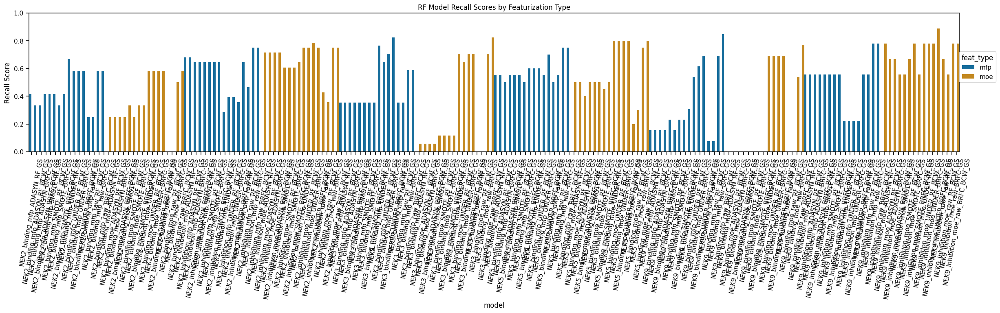

In [83]:
plot_df = df_all
dflong = plot_df.melt(id_vars=['NEK', 'dataset_category', 'model', 'feat_type', 'strategy'],
                      value_vars=['recall'], var_name='Metric', value_name='Metric_value')
dflong = dflong.sort_values(by=['NEK', 'strategy'], ascending=[True, True])
sns.set_context('notebook')

sns.set_palette('colorblind')
plt.figure(figsize=(25, 8))
dflong.sort_values(['NEK', 'feat_type'],inplace=True)
grid = sns.barplot(data=dflong, x='model', y='Metric_value', hue='feat_type', dodge=True, width=1)
plt.ylabel('Recall Score')
plt.xticks(rotation=80)
plt.ylim(0,1.0)
sns.move_legend(grid, (1., 0.5))
plt.tight_layout(pad=2.0)
plt.title('RF Model Recall Scores by Featurization Type')

# Display the plot
plt.show()
# plt.figure(figsize=(25, 7)) 
# plt.ylim(0,1.0)
# plt.bar(plot_df['model'],plot_df['recall'])
# plt.xticks(rotation=80)
# plt.tight_layout(pad=2.5)
# plt.show();

In [84]:
print('RF average recall scores')
for nek in neks: 
    nek_df = df_all[df_all['NEK']==nek]
    average_recall = nek_df['recall'].mean()
    print(f'{nek} average recall score: {average_recall}')

RF average recall scores
NEK2_binding average recall score: 0.40104166666666663
NEK2_inhibition average recall score: 0.6216517857142857
NEK3_binding average recall score: 0.39522058823529416
NEK5_binding average recall score: 0.5765625
NEK9_binding average recall score: 0.2932692307692307
NEK9_inhibition average recall score: 0.6006944444444444


In [87]:
!pip install openpyxl
datapath = '/Users/jayceepang/msse/capstone/atom2024/atom2024/notebooks/NEK/RF/RF_grid_search/rf_results/'
df2 = pd.read_csv(datapath+'RF_gridsearch_test_results_all_NEK.csv')
df2['strategy'] = df2['strategy'].str.replace('scaled', 'raw')
df2.set_index(['NEK',  'strategy', 'feat_type', 'RF_type'], inplace=True)
df2.sort_values(['NEK','strategy'])
df2.to_csv(datapath+'RF_GS_results_by_strategy.csv', index=True)
df2.to_excel(datapath+'RF_GS_results_by_strategy.xlsx', index=True)
display(df2)

accuracy  precision    recall  \
NEK             strategy feat_type RF_type                                   
NEK2_binding    raw      moe       RF        0.957597   0.000000  0.000000   
                                   RF_BCW    0.957597   0.000000  0.000000   
                                   BRFC      0.734982   0.080000  0.500000   
                                   BRFC_BCW  0.756184   0.098592  0.583333   
                UNDER    moe       RF        0.745583   0.094595  0.583333   
...                                               ...        ...       ...   
NEK9_inhibition SMOTE    mfp       BRFC_BCW  0.937500   0.833333  0.555556   
                ADASYN   mfp       RF        0.937500   0.833333  0.555556   
                                   RF_BCW    0.937500   0.833333  0.555556   
                                   BRFC      0.937500   0.833333  0.555556   
                                   BRFC_BCW  0.937500   0.833333  0.555556   

                                             specificity   ROC-AUC       MCC  \
NEK             strategy feat_type RF_type                                     
NEK2_binding    raw      moe       RF           1.000000  0.500000  0.000000   
                                   RF_BCW       1.000000  0.500000  0.000000   
                                   BRFC         0.745387  0.622694  0.112038   
                                   BRFC_BCW     0.763838  0.673585  0.161370   
                UNDER    moe       RF           0.752768  0.668050  0.154119   
...                                                  ...       ...       ...   
NEK9_inhibition SMOTE    mfp       BRFC_BCW     0.985915  0.770736  0.649582   
                ADASYN   mfp       RF           0.985915  0.770736  0.649582   
                                   RF_BCW       0.985915  0.770736  0.649582   
                                   BRFC         0.985915  0.770736  0.649582   
                                   BRFC_BCW     0.985915  0.770736  0.649582   

                                             Balanced Accuracy        f1  y  \
NEK             strategy feat_type RF_type                                    
NEK2_binding    raw      moe       RF                 0.500000  0.000000  0   
                                   RF_BCW             0.500000  0.000000  0   
                                   BRFC               0.622694  0.137931  0   
                                   BRFC_BCW           0.673585  0.168675  0   
                UNDER    moe       RF                 0.668050  0.162791  0   
...                                                        ...       ... ..   
NEK9_inhibition SMOTE    mfp       BRFC_BCW           0.770736  0.666667  0   
                ADASYN   mfp       RF                 0.770736  0.666667  0   
                                   RF_BCW             0.770736  0.666667  0   
                                   BRFC               0.770736  0.666667  0   
                                   BRFC_BCW           0.770736  0.666667  0   

                                              TN  FN  FP  TP  \
NEK             strategy feat_type RF_type                     
NEK2_binding    raw      moe       RF        271  12   0   0   
                                   RF_BCW    271  12   0   0   
                                   BRFC      202   6  69   6   
                                   BRFC_BCW  207   5  64   7   
                UNDER    moe       RF        204   5  67   7   
...                                          ...  ..  ..  ..   
NEK9_inhibition SMOTE    mfp       BRFC_BCW   70   4   1   5   
                ADASYN   mfp       RF         70   4   1   5   
                                   RF_BCW     70   4   1   5   
                                   BRFC       70   4   1   5   
                                   BRFC_BCW   70   4   1   5   

                                                                              model  \
NEK             strategy feat_type RF_typ

In [88]:
df3 = pd.read_csv(datapath+'RF_gridsearch_test_results_all_NEK.csv')
df3['strategy'] = df3['strategy'].str.replace('scaled', 'raw')

df3.set_index(['NEK', 'RF_type', 'strategy' ,'feat_type'],inplace=True)


df3 = df3.sort_values(['NEK','RF_type', 'strategy'])

df3.to_csv(datapath+'RF_GS_results_by_RF_type.csv', index=True)
df3.to_excel(datapath+'RF_GS_results_by_RF_type.xlsx', index=True)
# display(df3)


In [89]:
df4 = pd.read_csv(datapath+'RF_gridsearch_test_results_all_NEK.csv')
df4['strategy'] = df4['strategy'].str.replace('scaled', 'raw')
df4.set_index(['NEK', 'feat_type', 'strategy','RF_type'],inplace=True)
df4 = df4.sort_values(['NEK','feat_type', 'strategy'])
df4.to_csv(datapath+'RF_GS_results_by_feat_type.csv', index=True)
df4.to_excel(datapath+'RF_GS_results_by_feat_type.xlsx', index=True)
df4.head(32)

accuracy  precision    recall  \
NEK          feat_type strategy RF_type                                   
NEK2_binding mfp       ADASYN   RF        0.964664   0.625000  0.416667   
                                RF_BCW    0.968198   0.800000  0.333333   
                                BRFC      0.961131   0.571429  0.333333   
                                BRFC_BCW  0.964664   0.625000  0.416667   
                       SMOTE    RF        0.968198   0.714286  0.416667   
                                RF_BCW    0.964664   0.625000  0.416667   
                                BRFC      0.961131   0.571429  0.333333   
                                BRFC_BCW  0.968198   0.714286  0.416667   
                       UNDER    RF        0.643110   0.076190  0.666667   
                                RF_BCW    0.671378   0.073684  0.583333   
                                BRFC      0.611307   0.062500  0.583333   
                                BRFC_BCW  0.696113   0.079545  0.583333   
                       raw      RF        0.968198   1.000000  0.250000   
                                RF_BCW    0.968198   1.000000  0.250000   
                                BRFC      0.886926   0.205882  0.583333   
                                BRFC_BCW  0.855124   0.162791  0.583333   
             moe       ADASYN   RF        0.964664   0.750000  0.250000   
                                RF_BCW    0.964664   0.750000  0.250000   
                                BRFC      0.964664   0.750000  0.250000   
                                BRFC_BCW  0.964664   0.750000  0.250000   
                       SMOTE    RF        0.968198   0.800000  0.333333   
                                RF_BCW    0.964664   0.750000  0.250000   
                                BRFC      0.968198   0.800000  0.333333   
                                BRFC_BCW  0.968198   0.800000  0.333333   
                       UNDER    RF        0.745583   0.094595  0.583333   
                                RF_BCW    0.756184   0.098592  0.583333   
                                BRFC      0.745583   0.094595  0.583333   
                                BRFC_BCW  0.752650   0.097222  0.583333   
                       raw      RF        0.957597   0.000000  0.000000   
                                RF_BCW    0.957597   0.000000  0.000000   
                                BRFC      0.734982   0.080000  0.500000   
                                BRFC_BCW  0.756184   0.098592  0.583333   

                                          specificity   ROC-AUC       MCC  \
NEK          feat_type strategy RF_type                                     
NEK2_binding mfp       ADASYN   RF           0.988930  0.702798  0.493126   
                                RF_BCW       0.996310  0.664822  0.504211   
                                BRFC         0.988930  0.661132  0.418102   
                                BRFC_BCW     0.988930  0.702798  0.493126   
                       SMOTE    RF           0.992620  0.704643  0.531006   
                                RF_BCW       0.988930  0.702798  0.493126   
                                BRFC         0.988930  0.661132  0.418102   
                                BRFC_BCW     0.992620  0.704643  0.531006   
                       UNDER    RF           0.642066  0.654367  0.128782   
                                RF_BCW       0.675277  0.629305  0.110352   
                                BRFC         0.612546  0.597940  0.080716   
                                BRFC_BCW     0.701107  0.642220  0.123825   
                       raw      RF           1.000000  0.625000  0.491899   
                                RF_BCW       1.000000  0.625000  0.491899   
                                BRFC         0.900369  0.741851  0.299788   
                                BRFC_BCW     0.867159  0.725246  0.252885   
             moe       ADASYN   RF           0.996310  0.623155  0.420460   
                            